### Libraries import

In [1]:
import csv
import copy
import numpy as np
import pandas as pd
import random as rd
from tqdm import tqdm
import networkx as nx
import matplotlib.pyplot as plt

np.random.seed(0)

In [2]:
import warnings
warnings.filterwarnings("ignore")

### Spread function

In [3]:
def graph_generation(
    graph_type: str,
    number_of_nodes: int, 
    BA_connect: int = None, 
    ER_prob: float = None,
    CL_average: int = None,
    silent: bool = True
) -> nx.Graph:
    """
    Function that generates a graph based on the specified graph type.

    Inputs:
    ---------
    graph_type : str
        The type of graph to generate. Valid values are 'BA', 'ER', and 'CL'.
    number_of_nodes : int
        The number of nodes in the graph.
    BA_connect : int = None
        The number of connections in the Barabasi-Albert graph. Required if graph_type is 'BA'.
    ER_prob : float = None
        The probability of an edge in the Erdos-Renyi graph. Required if graph_type is 'ER'.
    CL_average : int = None
        The average degree in the Chung-Lu graph. Required if graph_type is 'CL'.
    silent : bool = True
        If True, suppresses the print of graph size (number of edges).

    Returns:
    ---------
    G : nx.Graph
        The generated graph.

    Raises:
    ---------
    ValueError: If the graph_type is not one of 'BA', 'ER', or 'CL'.
    """
    
    if graph_type == 'BA':
        G = nx.barabasi_albert_graph(number_of_nodes, BA_connect)
    elif graph_type == 'ER':
        G = nx.erdos_renyi_graph(number_of_nodes, ER_prob)
    elif graph_type == 'CL':
    # Model's Parameters: Generate a random Chung-Lu graph with average degree d, max degree m, and power-law degree distribution with exponent gamma
    # Source: https://github.com/ftudisco/scalefreechunglu/blob/master/python/example.py
        gamma = 2.2
        m = number_of_nodes ** 0.4
        p = 1 / (gamma - 1)
        c = (1 - p) * CL_average * (number_of_nodes ** p)
        i0 = (c / m) ** (1 / p) - 1
        w = [c / ((i + i0) ** p) for i in range(number_of_nodes)]
        G = nx.expected_degree_graph(w)
    else:
        raise ValueError("Wrong graph_type. Choose BA, ER or CL.")
    
    if silent == False: 
        print(G.size())

    return G

In [4]:
# Set parametrization for the graphs
number_of_days = 10000
number_of_nodes = 2500
new_grains = []
BA_connect = 1
ER_prob = 0.0016
CL_average = 10

In [5]:
def grain_generator(
    number_of_nodes:int, 
    number_of_days:int, 
    dist:str = 'uni'
) -> list:
    """
    Generate grains to be put into the sand pile based on the specified distribution for a given number of nodes and days.

    Inputs:
    ---------
    number_of_nodes : int
        The number of nodes to generate grains for.
    number_of_days : int
        The number of days for which grains are generated.
    dist : str = 'uni'
        The type of distribution to use for generating grains. Default is 'uni'.
        Other options: 'expon' for exponential, 'par' for Pareto.

    Returns:
    ---------
    new_grains : list
        A list of generated grains based on the specified distribution.

    Raises:
    ---------
    ValueError: If the distribution type is not one of 'uni', 'expon' or 'par'.
    """
    
    # Create list to fday
    new_grains = []
    
    # Generate grains depending on the distribution
    if dist == 'uni':
        for d in range(number_of_days):
            grain = np.random.randint(number_of_nodes)
            new_grains.append([grain])
    elif dist in ['expon', 'par']:
        if dist == 'expon':
            num_of_grains = np.around(np.random.exponential(size = number_of_days))
        else:
            num_of_grains = np.around(np.random.pareto(a = 2, size = number_of_days))
        for d in range(number_of_days):
            grains = []
            for g in range(int(num_of_grains[d]) + 1):
                grain = np.random.randint(number_of_nodes)
                grains.append(grain)
            new_grains.append(grains)
    else:
        raise ValueError('Wrong distribution type. Choose uni, expon or par.')
    
    return new_grains

In [6]:
# Generation of the base list for coordinates of the new grains
new_grains = grain_generator(number_of_nodes, number_of_days)

In [7]:
# Generation of the additional list for coordinates of the new grains on the exponential distribution
new_grains_exp = grain_generator(number_of_nodes, number_of_days, 'expon')

In [8]:
# Generation of the additional list for coordinates of the new grains on the Pareto distribution
new_grains_par = grain_generator(number_of_nodes, number_of_days, 'par')

In [9]:
# Set additional parametrization in case of higher dissipation from the system
new_grains_plus = grain_generator(number_of_nodes, number_of_days)
new_grains_minus = grain_generator(number_of_nodes, number_of_days)

In [10]:
def counter(
    G: nx.Graph,
    new_grains: list,
    new_grains_plus: list,
    new_grains_minus: list
) -> tuple:
    """
    For calculation of number of sand grains in and out of the model

    Inputs:
    ---------
    G : nx.Graph
        The generated graph.
    new_grains : list
        Nodes that get new grains
    new_grains_plus : list
        Nodes that get additional grains
    new_grains_minus : list
        Nodes that dissipate additional grains

    Returns:
    ---------
    inner : list
        Lists of number of grains inside the system
    outer : list
        Lists of number of grains outside the system
    """

    # Initiate lists
    inner = []
    outer = []
    d = 0

    # Get a number of grains in and out of the system
    final_status = pd.DataFrame.from_dict(dict(G.nodes(data=True)), orient='index')
    for column in final_status:
        d += 1
        total_d = 0
        inner.append(np.sum(final_status[column]))
        for i in range(d):
            total_d += len(new_grains[i])
        if new_grains_plus != None:
            for i in range(d):
                total_d += len(new_grains_plus[i])
        if new_grains_minus != None:
            for i in range(d):
                total_d -= len(new_grains_minus[i])
        outer.append(total_d - np.sum(final_status[column]))

    return inner, outer

In [39]:
def spread(
    model: str,
    G: nx.Graph,
    number_of_days: int,
    new_grains: list,
    graph_type: str,
    facilitated: bool = False,
    ad_dissipation: bool = False,
    neutral_state: bool = False,
    expon: bool = False,
    par: bool = False,
    new_grains_plus: list = None,
    new_grains_minus: list = None,
) -> None:
    """
    Function that simulates grain spreading in a graph-based cellular automaton.

    The function supports the Bak-Tang-Wiesenfeld, Manna, Feder, and
    stochastic Feder models. It can additionally apply facilitated dynamics,
    adaptive dissipation, a neutral-state regime, exponential pumping, and
    parameterized pumping.

    Inputs:
    ---------
    model : str
        The sandpile rule to apply. Valid values are 'BTW', 'MA', 'FE',
        and 'SFE'.
    G : nx.Graph
        The graph representing the cellular automaton.
    number_of_days : int
        The total number of system iterations.
    new_grains : list
        A list containing the nodes that receive one grain at each system
        iteration.
    graph_type : str
        The identifier of the graph model used to generate G.
    facilitated : bool = False
        If True, applies the facilitated version of the selected sandpile rule.
    ad_dissipation : bool = False
        If True, applies the adaptive-dissipation pumping regime, with grains
        added according to new_grains and new_grains_plus and removed according
        to new_grains_minus.
    neutral_state : bool = False
        If True, applies the neutral-state pumping regime, with grains added
        according to new_grains and removed according to new_grains_minus.
    expon : bool = False
        If True, adds the '_exp' suffix to the output file name to indicate
        exponential pumping.
    par : bool = False
        If True, adds the '_par' suffix to the output file name to indicate
        parameterized pumping.
    new_grains_plus : list = None
        A list containing nodes that receive an additional grain at each
        system iteration. Required when ad_dissipation is True.
    new_grains_minus : list = None
        A list containing nodes from which one grain is removed at each
        system iteration. Required when ad_dissipation or neutral_state is True.


    Returns:
    ---------
    None
        The function saves the avalanche-size series as a CSV file and displays
        a two-panel figure with the grain dynamics and number of falls.


    Raises:
    ---------
    ValueError
        If model is not one of 'BTW', 'MA', 'FE', or 'SFE'.
    ValueError
        If ad_dissipation is True and either new_grains_plus or
        new_grains_minus is None.
    ValueError
        If neutral_state is True and new_grains_minus is None.
    """

    valid_models = {'BTW', 'MA', 'FE', 'SFE'}

    if model not in valid_models:
        raise ValueError("Wrong model. Choose BTW, MA, FE, or SFE.")

    if ad_dissipation and (
        new_grains_plus is None or new_grains_minus is None
    ):
        raise ValueError(
            "new_grains_plus and new_grains_minus are required when "
            "ad_dissipation is True."
        )

    if neutral_state and new_grains_minus is None:
        raise ValueError(
            "new_grains_minus is required when neutral_state is True."
        )

    inner = []
    outer = []
    falls = []
    ones = []
    deg = []

    degrees = [[node, value] for node, value in G.degree()]

    for degree in degrees:
        deg.append(degree[1])

        if degree[1] == 1:
            ones.append(degree[0])

    status = pd.DataFrame()

    for i in range(number_of_days):
        status[f'ill{i}'] = np.zeros(G.number_of_nodes())

    node_attr = status.to_dict('index')
    nx.set_node_attributes(G, node_attr)

    if facilitated:
        facilit_list = [
            [0 for _ in range(G.number_of_nodes())]
            for _ in range(number_of_days)
        ]

    for i in tqdm(range(number_of_days - 1)):
        falls_i = 0

        if ad_dissipation:
            for node in G.nodes(data=True):
                if node[0] in new_grains[i]:
                    node[1][f'ill{i}'] += 1.0

                if node[0] in new_grains_plus[i]:
                    node[1][f'ill{i}'] += 1.0

                if node[0] in new_grains_minus[i]:
                    node[1][f'ill{i}'] -= 1.0

                node[1][f'ill{i + 1}'] += node[1][f'ill{i}']

        elif neutral_state:
            for node in G.nodes(data=True):
                if node[0] in new_grains[i]:
                    node[1][f'ill{i}'] += 1.0

                if node[0] in new_grains_minus[i]:
                    node[1][f'ill{i}'] -= 1.0

                node[1][f'ill{i + 1}'] += node[1][f'ill{i}']

        else:
            for node in G.nodes(data=True):
                if node[0] in new_grains[i]:
                    node[1][f'ill{i}'] += 1.0

                node[1][f'ill{i + 1}'] += node[1][f'ill{i}']

        for node in G.nodes(data=True):
            node_id = node[0]
            node_data = node[1]
            node_degree = deg[node_id]

            if not facilitated:
                if (
                    node_data[f'ill{i}'] >= node_degree
                    and node_degree > 0
                ):
                    if model == 'BTW':
                        G, falls_i = BTW(
                            G,
                            ones,
                            falls_i,
                            i,
                            node,
                            node_degree,
                        )

                    elif model == 'MA':
                        G, falls_i = MA(
                            G,
                            ones,
                            falls_i,
                            i,
                            node,
                            node_degree,
                        )

                    elif model == 'FE':
                        G, falls_i = FE(
                            G,
                            ones,
                            falls_i,
                            i,
                            node,
                            node_degree,
                        )

                    elif model == 'SFE':
                        G, falls_i = SFE(
                            G,
                            ones,
                            falls_i,
                            i,
                            node,
                            node_degree,
                        )

            else:
                if (
                    (
                        node_data[f'ill{i}'] >= node_degree
                        or facilit_list[i][node_id] >= 2
                    )
                    and node_degree > 0
                ):
                    if model == 'BTW':
                        G, facilit_list, falls_i = BTW_fa(
                            G,
                            facilit_list,
                            ones,
                            falls_i,
                            i,
                            node,
                            node_degree,
                        )

                    elif model == 'MA':
                        G, facilit_list, falls_i = MA_fa(
                            G,
                            facilit_list,
                            ones,
                            falls_i,
                            i,
                            node,
                            node_degree,
                        )

                    elif model == 'FE':
                        G, facilit_list, falls_i = FE_fa(
                            G,
                            facilit_list,
                            ones,
                            falls_i,
                            i,
                            node,
                            node_degree,
                        )

                    elif model == 'SFE':
                        G, facilit_list, falls_i = SFE_fa(
                            G,
                            facilit_list,
                            ones,
                            falls_i,
                            i,
                            node,
                            node_degree,
                        )

        falls.append(falls_i)

    inner, outer = counter(
        G,
        new_grains,
        new_grains_plus,
        new_grains_minus,
    )

    data = pd.DataFrame(falls)
    graph_name = f'{model}_{graph_type}'

    if facilitated:
        graph_name += '_fa'

    if ad_dissipation:
        graph_name += '_ad'

    if neutral_state:
        graph_name += '_ns'

    if expon:
        graph_name += '_exp'

    if par:
        graph_name += '_par'

    data.to_csv(
        f'CA_SOC/{graph_name}.csv',
        index=False,
    )

    fig, axs = plt.subplots(
        2,
        1,
        figsize=(5.8, 3.6),
        dpi=300,
        sharex=True,
        constrained_layout=True,
    )

    for ax in axs:
        ax.xaxis.get_major_locator().set_params(integer=True)
        ax.yaxis.get_major_locator().set_params(integer=True)
        ax.ticklabel_format(style='plain', axis='both')
        ax.tick_params(
            axis='both',
            which='major',
            labelsize=7,
            pad=2,
        )
        ax.grid(
            alpha=0.25,
            linewidth=0.4,
        )

    axs[0].plot(
        range(number_of_days),
        inner,
        color='#40a6d1',
        alpha=0.85,
        linewidth=0.9,
        label='Inner grains',
    )

    axs[0].plot(
        range(number_of_days),
        outer,
        color='red',
        alpha=0.85,
        linewidth=0.9,
        label='Outer grains',
    )

    axs[0].set_ylabel(
        'Grains',
        fontsize=8,
    )

    axs[0].set_title(
        f'Grain dynamics: {graph_name}',
        fontsize=8,
        pad=4,
    )

    axs[0].legend(
        loc='upper right',
        fontsize=6.5,
        frameon=False,
        handlelength=1.5,
    )

    axs[1].plot(
        range(number_of_days - 1),
        falls,
        color='#40a6d1',
        alpha=0.85,
        linewidth=0.9,
    )

    axs[1].set_xlabel(
        'System iteration',
        fontsize=8,
    )

    axs[1].set_ylabel(
        'Falls',
        fontsize=8,
    )

    axs[1].set_title(
        f'Number of falls: {graph_name}',
        fontsize=8,
        pad=4,
    )

    plt.show()

### Model definition

In [40]:
def BTW(G, ones, falls_d, d, node, crit):
  falls_d += 1
  if node[0] not in ones:
    neighbors = [n for n in G.neighbors(node[0])]
    for neighbor in G.nodes(data=True):
      if neighbor[0] in neighbors:
        neighbor[1]['ill'+str(d+1)] += 1
  node[1]['ill'+str(d+1)] -= crit

  return G, falls_d

In [41]:
def BTW_fa(G, facilit_list, ones, falls_d, d, node, crit):
  falls_d += 1
  if node[0] not in ones:
    neighbors = [n for n in G.neighbors(node[0])]
    if node[1]['ill'+str(d)] >= crit:
      for neighbor in G.nodes(data=True):
        if neighbor[0] in neighbors:
          neighbor[1]['ill'+str(d+1)] += 1
          facilit_list[d+1][neighbor[0]] += 1
      node[1]['ill'+str(d+1)] -= crit
    elif node[1]['ill'+str(d)] < crit and node[1]['ill'+str(d)] > 0:
      remains = node[1]['ill'+str(d)]
      for neighbor in G.nodes(data=True):
        if neighbor[0] in neighbors:
          n = rd.randint(0, int(remains))
          remains -= n
          neighbor[1]['ill'+str(d+1)] += n
          if n > 0:
            facilit_list[d+1][neighbor[0]] += 1
      node[1]['ill'+str(d+1)] -= node[1]['ill'+str(d)]
  else:
    node[1]['ill'+str(d+1)] -= crit

  return G, facilit_list, falls_d

In [42]:
def MA(G, ones, falls_d, d, node, crit):
  falls_d += 1
  if node[0] not in ones:
    neighbors = [n for n in G.neighbors(node[0])]
    remains = copy.copy(crit)
    for neighbor in G.nodes(data=True):
      if neighbor[0] in neighbors:
        n = rd.randint(0, int(remains))
        remains -= n
        neighbor[1]['ill'+str(d+1)] += n
  node[1]['ill'+str(d+1)] -= crit

  return G, falls_d

In [43]:
def MA_fa(G, facilit_list, ones, falls_d, d, node, crit):
  falls_d += 1
  if node[0] not in ones:
    neighbors = [n for n in G.neighbors(node[0])]
    if node[1]['ill'+str(d)] >= crit:
      remains = int(copy.copy(crit))
      for neighbor in G.nodes(data=True):
        if neighbor[0] in neighbors:
          n = rd.randint(0, int(remains))
          remains -= n
          neighbor[1]['ill'+str(d+1)] += n
          if n > 0 and d+1 <= len(facilit_list):
            facilit_list[d+1][neighbor[0]] += 1
      node[1]['ill'+str(d+1)] -= crit
    elif node[1]['ill'+str(d)] < crit and node[1]['ill'+str(d)] > 0:
      remains = int(node[1]['ill'+str(d)])
      for neighbor in G.nodes(data=True):
        if neighbor[0] in neighbors:
          n = rd.randint(0, int(remains))
          remains -= n
          neighbor[1]['ill'+str(d+1)] += n
          if n > 0 and d+1 <= len(facilit_list):
            facilit_list[d+1][neighbor[0]] += 1
      node[1]['ill'+str(d+1)] -= node[1]['ill'+str(d)]
  else:
    node[1]['ill'+str(d+1)] -= crit

  return G, facilit_list, falls_d

In [44]:
def FE(G, ones, falls_d, d, node, crit):
  falls_d += 1
  if node[0] not in ones:
    neighbors = [n for n in G.neighbors(node[0])]
    for neighbor in G.nodes(data=True):
      if neighbor[0] in neighbors:
        neighbor[1]['ill'+str(d+1)] += 1
  node[1]['ill'+str(d+1)] -= node[1]['ill'+str(d)]

  return G, falls_d

In [45]:
def FE_fa(G, facilit_list, ones, falls_d, d, node, crit):
  falls_d += 1
  if node[0] not in ones:
    neighbors = [n for n in G.neighbors(node[0])]
    if node[1]['ill'+str(d)] >= crit:
      for neighbor in G.nodes(data=True):
        if neighbor[0] in neighbors:
          neighbor[1]['ill'+str(d+1)] += 1
          facilit_list[d+1][neighbor[0]] += 1
      node[1]['ill'+str(d+1)] -= node[1]['ill'+str(d)]
    elif node[1]['ill'+str(d)] < crit and node[1]['ill'+str(d)] > 0:
      remains = node[1]['ill'+str(d)]
      for neighbor in G.nodes(data=True):
        if neighbor[0] in neighbors:
          n = rd.randint(0, int(remains))
          remains -= n
          neighbor[1]['ill'+str(d+1)] += n
          if n > 0 and d+1 <= len(facilit_list):
            facilit_list[d+1][neighbor[0]] += 1
      node[1]['ill'+str(d+1)] -= node[1]['ill'+str(d)]
  else:
    node[1]['ill'+str(d+1)] -= node[1]['ill'+str(d)]

  return G, facilit_list, falls_d

In [46]:
def SFE(G, ones, falls_d, d, node, crit):
  falls_d += 1
  if node[0] not in ones:
    neighbors = [n for n in G.neighbors(node[0])]
    remains = copy.copy(crit)
    for neighbor in G.nodes(data=True):
      if neighbor[0] in neighbors:
        n = rd.randint(0, int(remains))
        remains -= n
        neighbor[1]['ill'+str(d+1)] += n
  node[1]['ill'+str(d+1)] -= node[1]['ill'+str(d)]

  return G, falls_d

In [47]:
def SFE_fa(G, facilit_list, ones, falls_d, d, node, crit):
  falls_d += 1
  if node[0] not in ones:
    neighbors = [n for n in G.neighbors(node[0])]
    if node[1]['ill'+str(d)] >= crit:
      remains = copy.copy(crit)
      for neighbor in G.nodes(data=True):
        if neighbor[0] in neighbors:
          n = rd.randint(0, int(remains))
          remains -= n
          neighbor[1]['ill'+str(d+1)] += n
          if n > 0 and d+1 <= len(facilit_list):
            facilit_list[d+1][neighbor[0]] += 1
      node[1]['ill'+str(d+1)] -= node[1]['ill'+str(d)]
    elif node[1]['ill'+str(d)] < crit and node[1]['ill'+str(d)] > 0:
      remains = node[1]['ill'+str(d)]
      for neighbor in G.nodes(data=True):
        if neighbor[0] in neighbors:
          n = rd.randint(0, int(remains))
          remains -= n
          neighbor[1]['ill'+str(d+1)] += n
          if n > 0 and d+1 <= len(facilit_list):
            facilit_list[d+1][neighbor[0]] += 1
      node[1]['ill'+str(d+1)] -= node[1]['ill'+str(d)]
  else:
    node[1]['ill'+str(d+1)] -= node[1]['ill'+str(d)]

  return G, facilit_list, falls_d

### Graph Generation

In [20]:
G_BA = graph_generation(graph_type = "BA", number_of_nodes = number_of_nodes, BA_connect = BA_connect)

In [21]:
G_ER = graph_generation(graph_type = "ER", number_of_nodes = number_of_nodes, ER_prob = ER_prob)

In [22]:
G_CL = graph_generation(graph_type = "CL", number_of_nodes = number_of_nodes, CL_average = CL_average)

### Bak-Tang-Wiesenfeld

#### Standart Model

##### Standart Dissipation

100%|██████████| 9999/9999 [00:22<00:00, 443.31it/s]


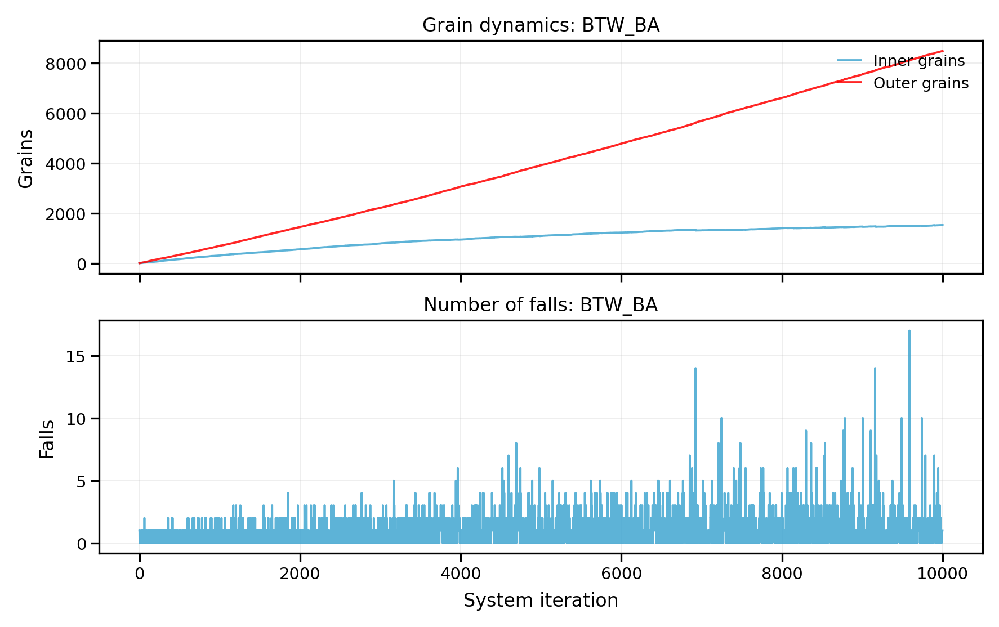

In [23]:
spread("BTW", G_BA, number_of_days, new_grains, "BA")

100%|██████████| 9999/9999 [00:33<00:00, 300.07it/s]


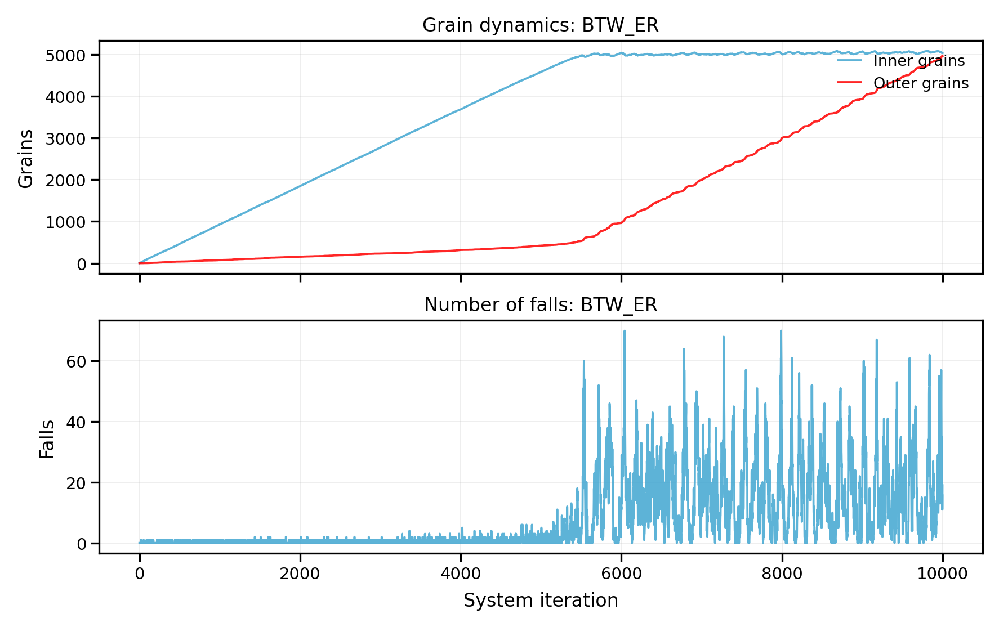

In [24]:
spread("BTW", G_ER, number_of_days, new_grains, "ER")

100%|██████████| 9999/9999 [00:29<00:00, 334.51it/s]


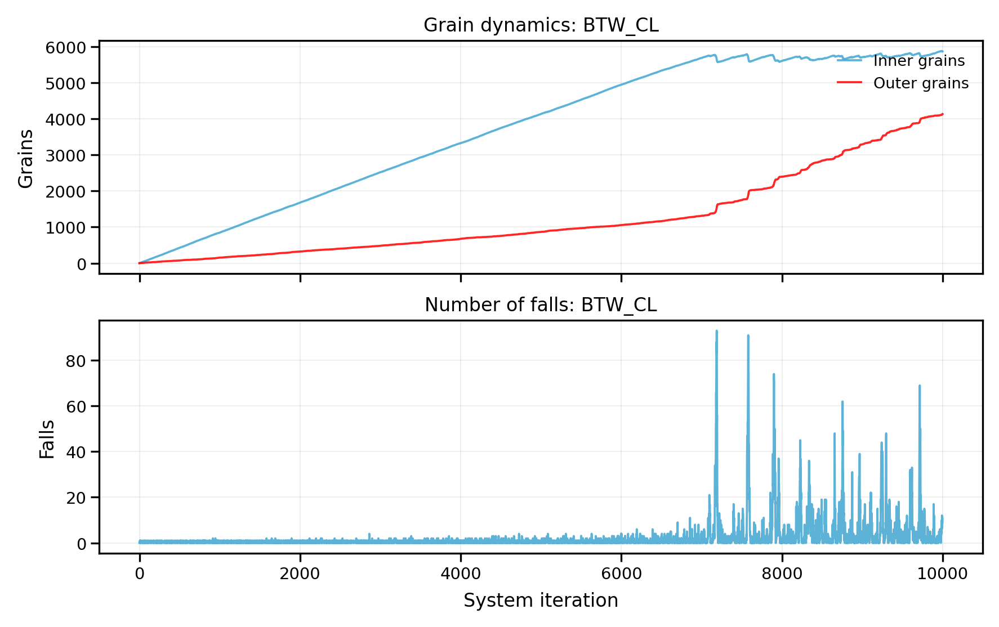

In [25]:
spread("BTW", G_CL, number_of_days, new_grains, "CL")

##### Additional Dissipation

100%|██████████| 9999/9999 [00:30<00:00, 327.32it/s]


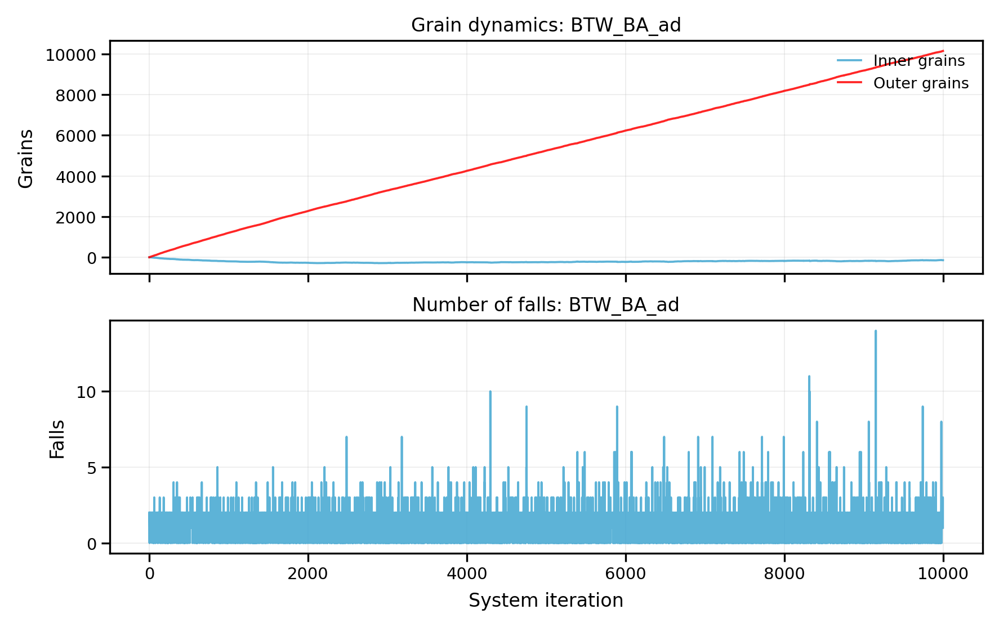

In [26]:
spread("BTW", G_BA, number_of_days, new_grains, "BA", ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

100%|██████████| 9999/9999 [00:35<00:00, 282.44it/s]


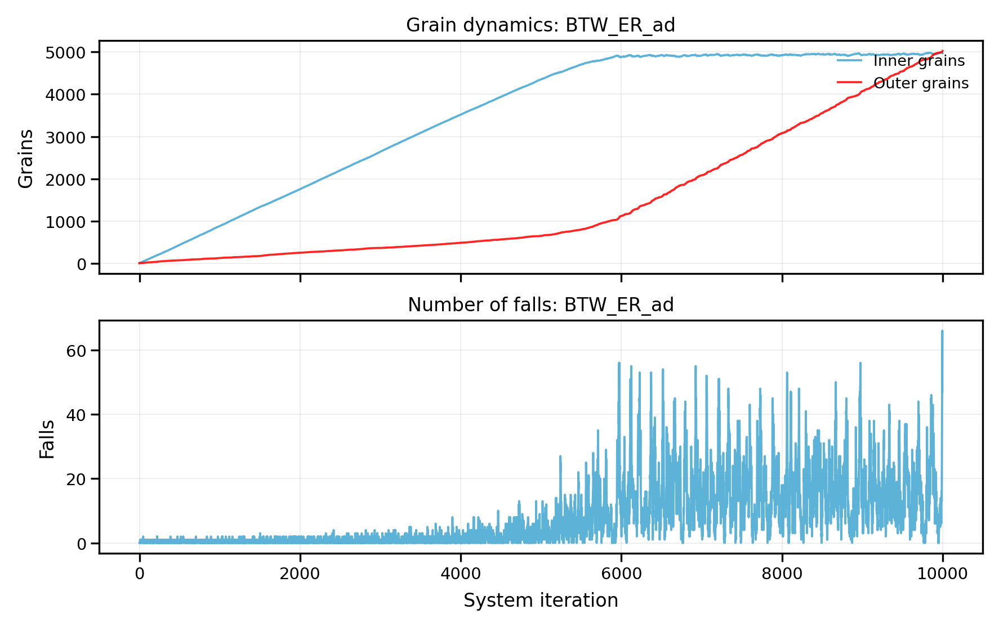

In [27]:
spread("BTW", G_ER, number_of_days, new_grains, "ER", ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

100%|██████████| 9999/9999 [00:34<00:00, 292.80it/s]


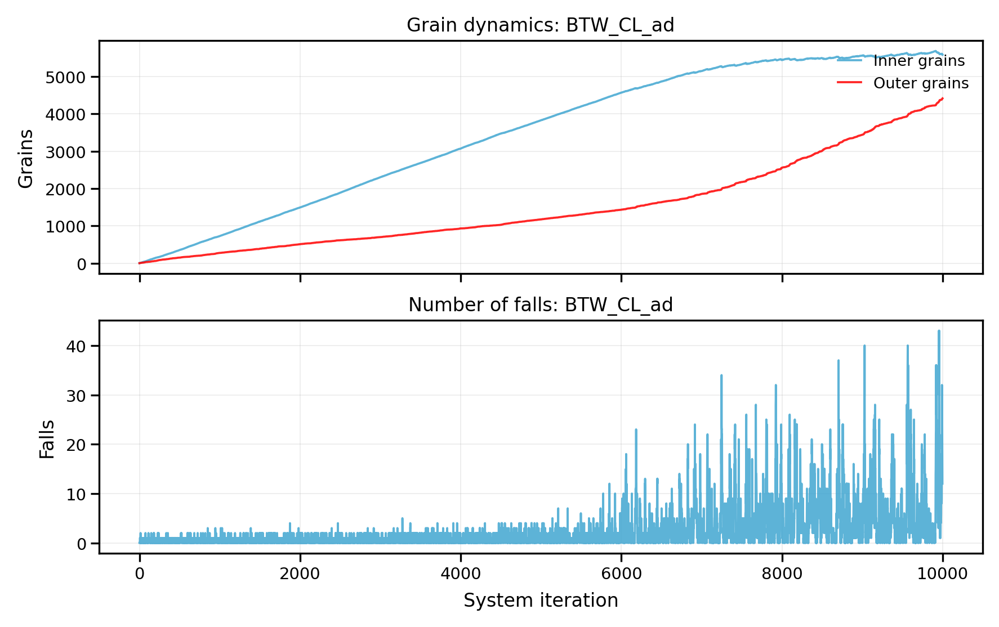

In [28]:
spread("BTW", G_CL, number_of_days, new_grains, "CL", ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

##### Neutral State

100%|██████████| 9999/9999 [00:27<00:00, 361.04it/s]


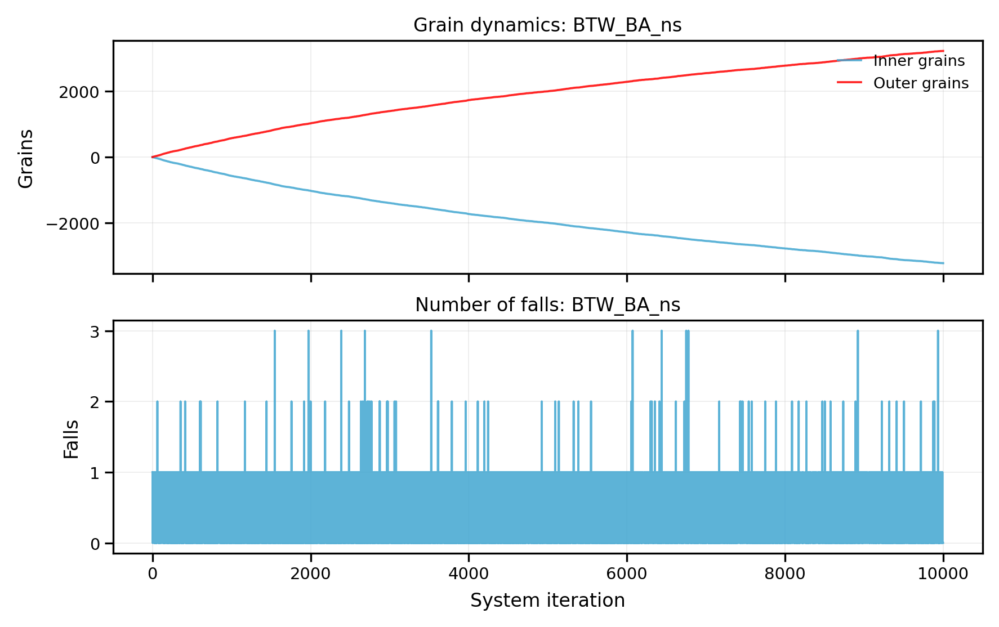

In [29]:
spread("BTW", G_BA, number_of_days, new_grains, "BA", neutral_state = True, new_grains_minus = new_grains_minus)

100%|██████████| 9999/9999 [00:27<00:00, 358.40it/s]


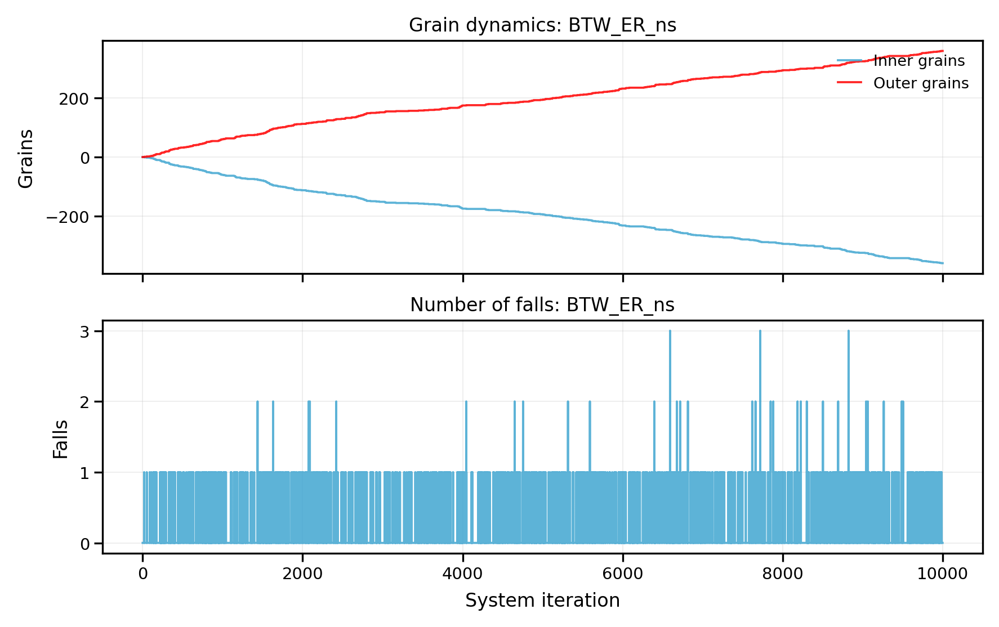

In [30]:
spread("BTW", G_ER, number_of_days, new_grains, "ER", neutral_state = True, new_grains_minus = new_grains_minus)

100%|██████████| 9999/9999 [00:27<00:00, 365.31it/s]


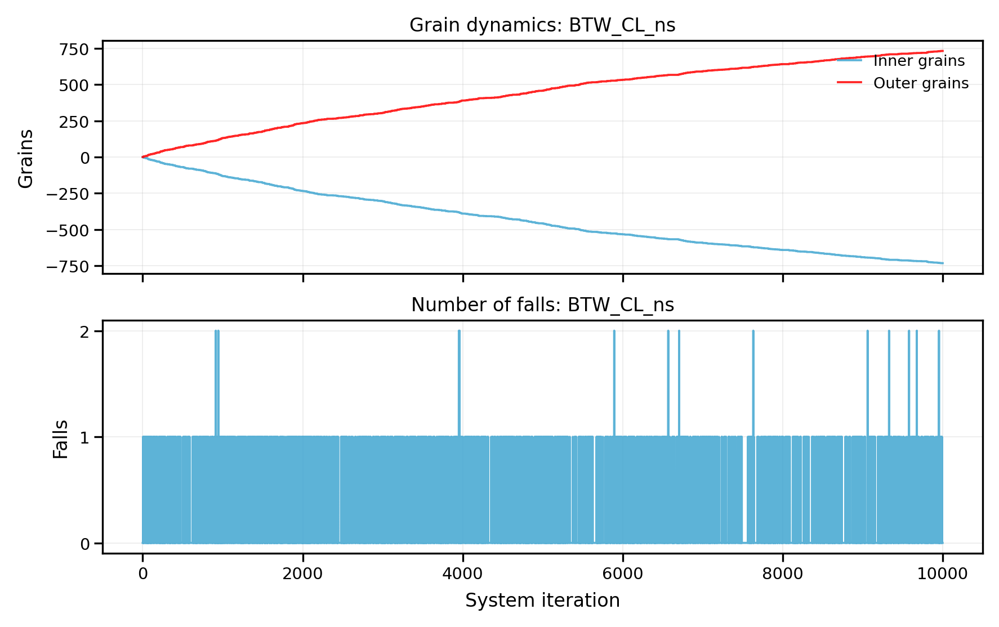

In [31]:
spread("BTW", G_CL, number_of_days, new_grains, "CL", neutral_state = True, new_grains_minus = new_grains_minus)

##### Additional Pumping

100%|██████████| 9999/9999 [00:28<00:00, 354.54it/s]


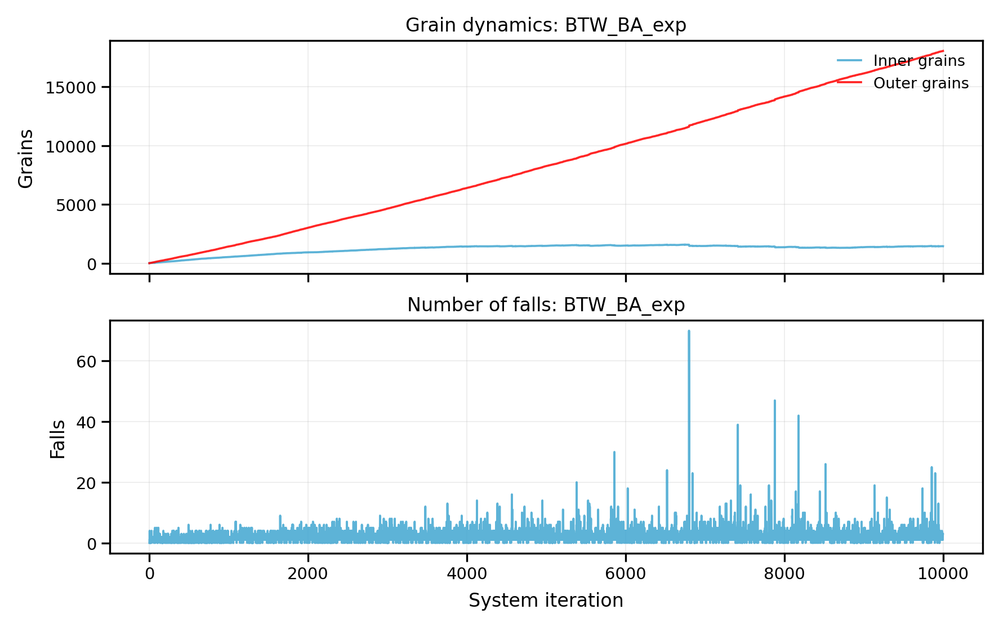

In [32]:
spread("BTW", G_BA, number_of_days, new_grains_exp, "BA", expon = True)

100%|██████████| 9999/9999 [00:58<00:00, 169.78it/s]


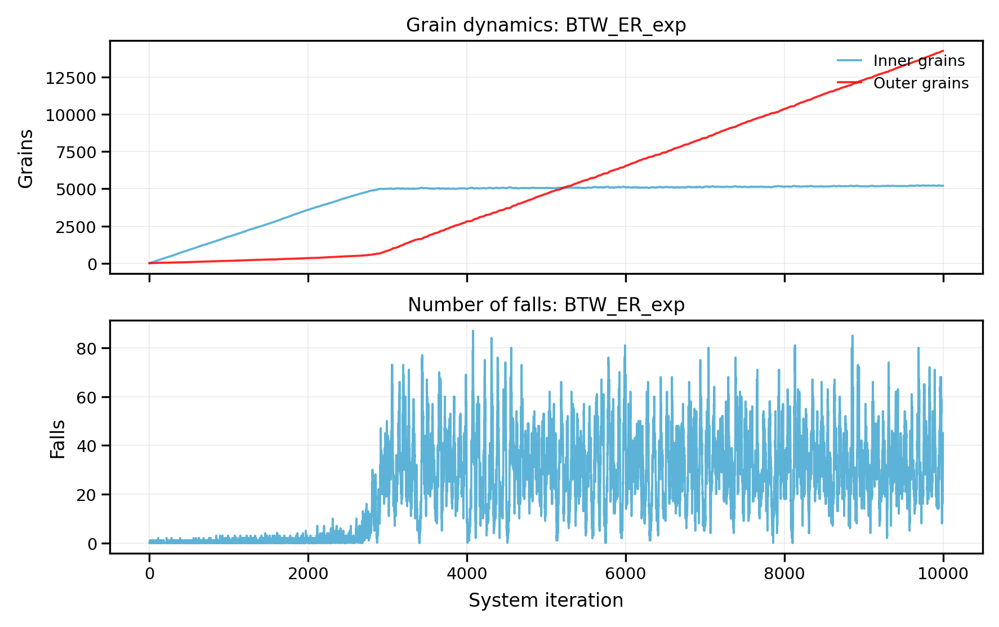

In [33]:
spread("BTW", G_ER, number_of_days, new_grains_exp, "ER", expon = True)

100%|██████████| 9999/9999 [00:37<00:00, 264.07it/s]


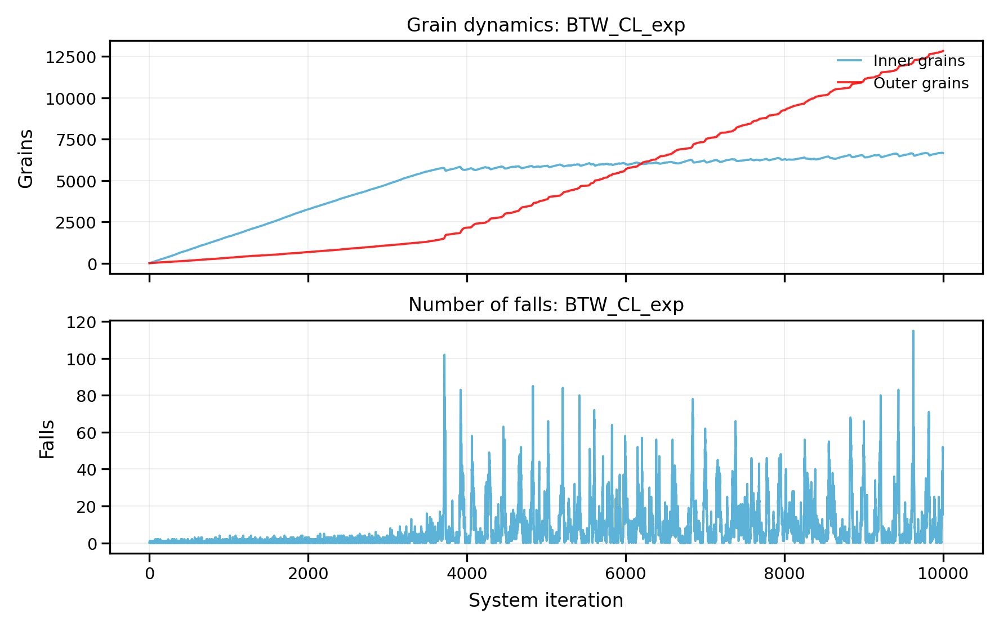

In [34]:
spread("BTW", G_CL, number_of_days, new_grains_exp, "CL", expon = True)

100%|██████████| 9999/9999 [00:27<00:00, 365.51it/s]


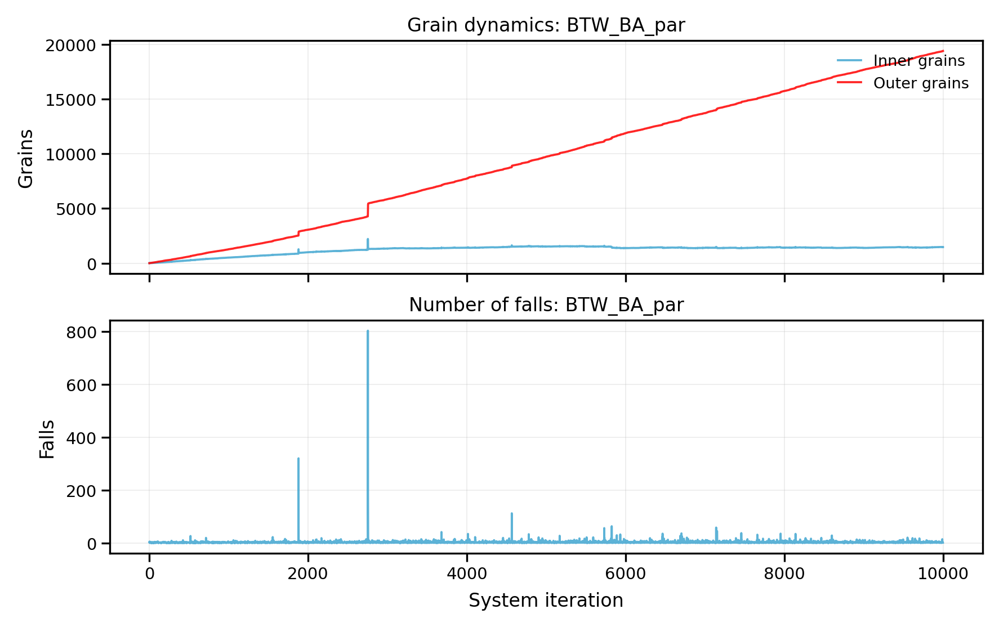

In [35]:
spread("BTW", G_BA, number_of_days, new_grains_par, "BA", par = True)

100%|██████████| 9999/9999 [01:01<00:00, 163.28it/s]


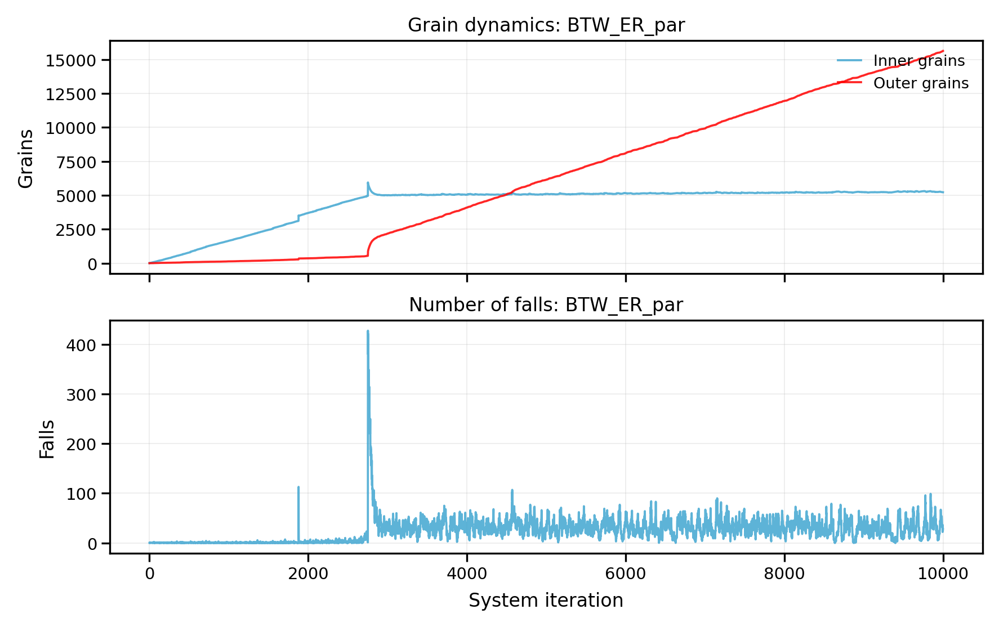

In [36]:
spread("BTW", G_ER, number_of_days, new_grains_par, "ER", par = True)

100%|██████████| 9999/9999 [00:38<00:00, 262.50it/s]


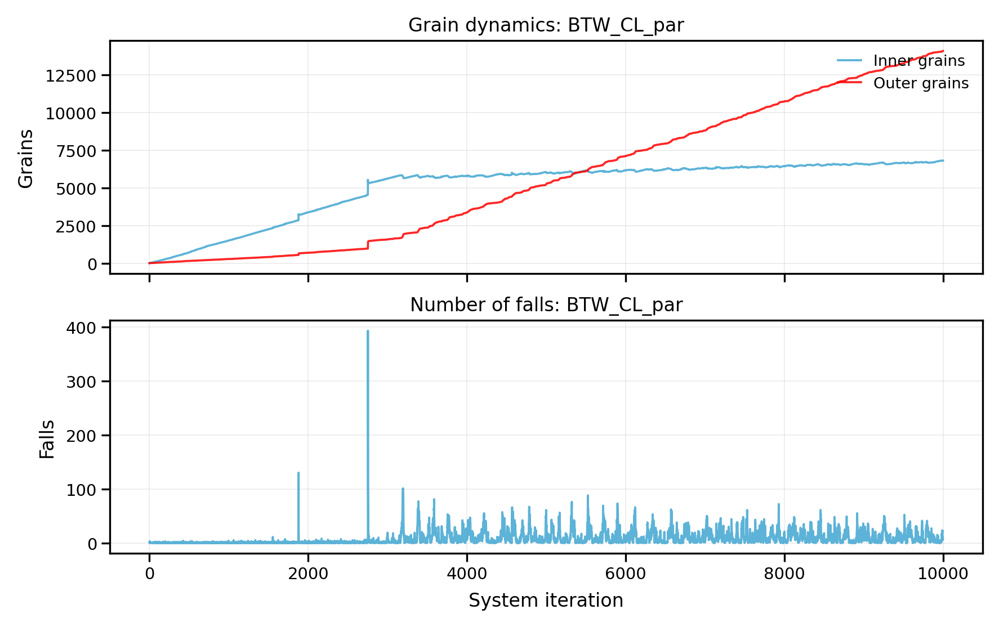

In [37]:
spread("BTW", G_CL, number_of_days, new_grains_par, "CL", par = True)

#### Facilitated Model

##### Standart Dissipation

100%|██████████| 9999/9999 [00:28<00:00, 356.97it/s]


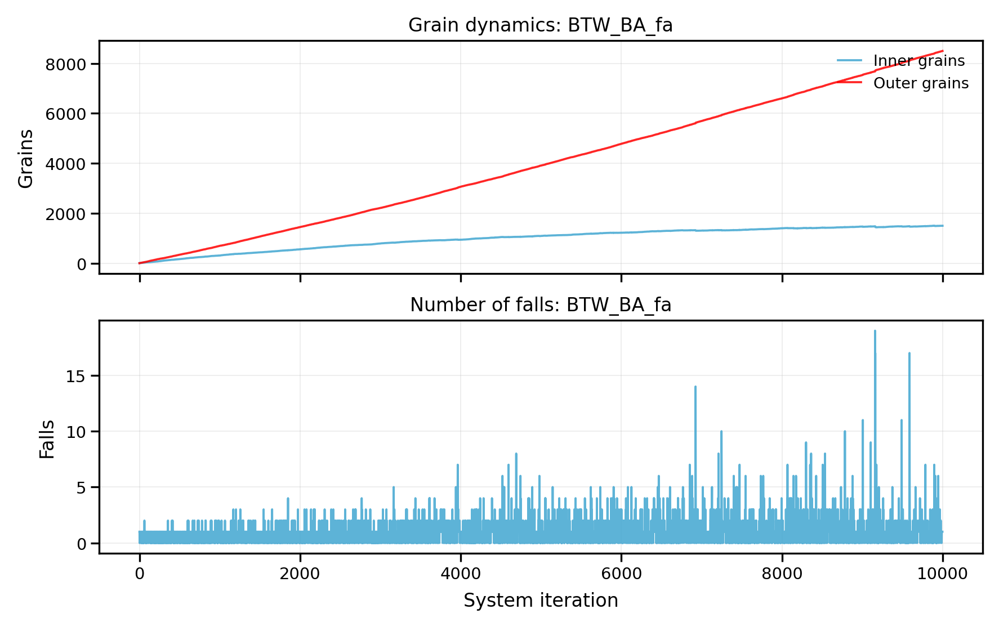

In [48]:
spread("BTW", G_BA, number_of_days, new_grains, "BA", facilitated = True)

100%|██████████| 9999/9999 [00:38<00:00, 259.53it/s]


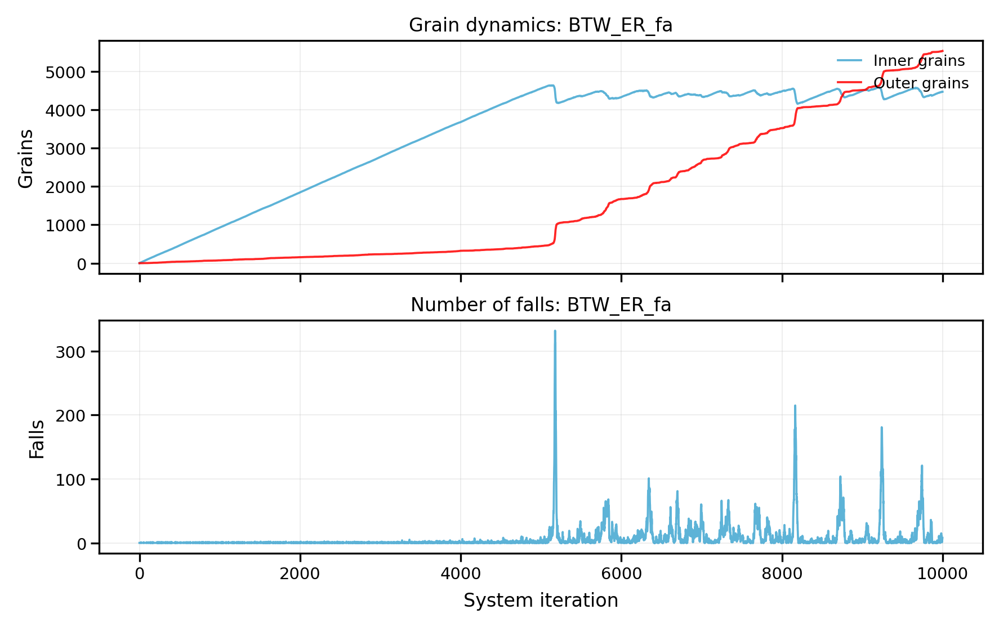

In [49]:
spread("BTW", G_ER, number_of_days, new_grains, "ER", facilitated = True)

100%|██████████| 9999/9999 [00:33<00:00, 294.19it/s]


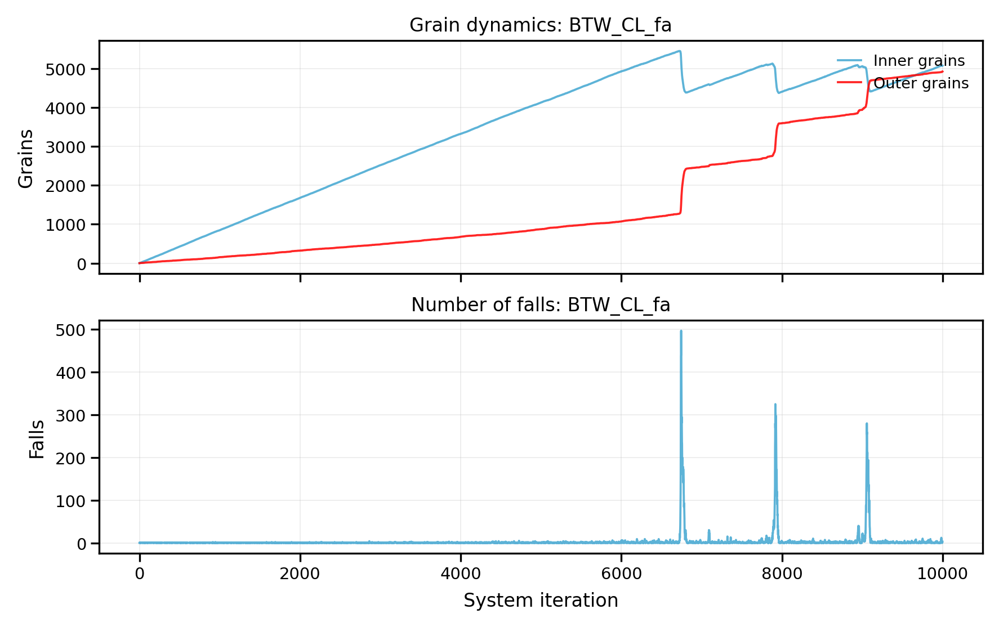

In [50]:
spread("BTW", G_CL, number_of_days, new_grains, "CL", facilitated = True)

##### Additional Dissipation

100%|██████████| 9999/9999 [00:29<00:00, 333.35it/s]


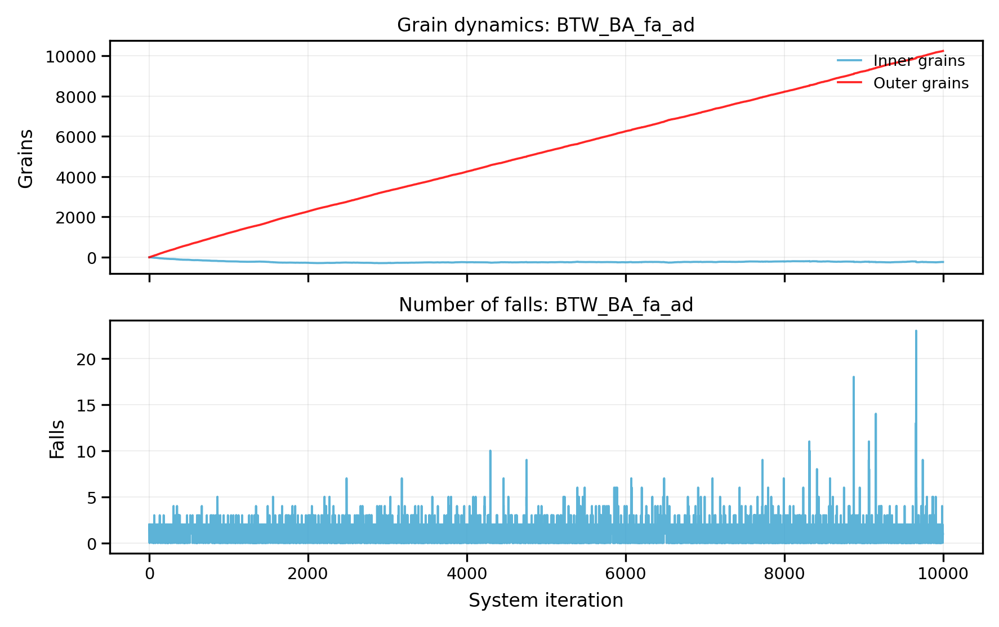

In [51]:
spread("BTW", G_BA, number_of_days, new_grains, "BA", facilitated = True, ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

100%|██████████| 9999/9999 [00:40<00:00, 248.28it/s]


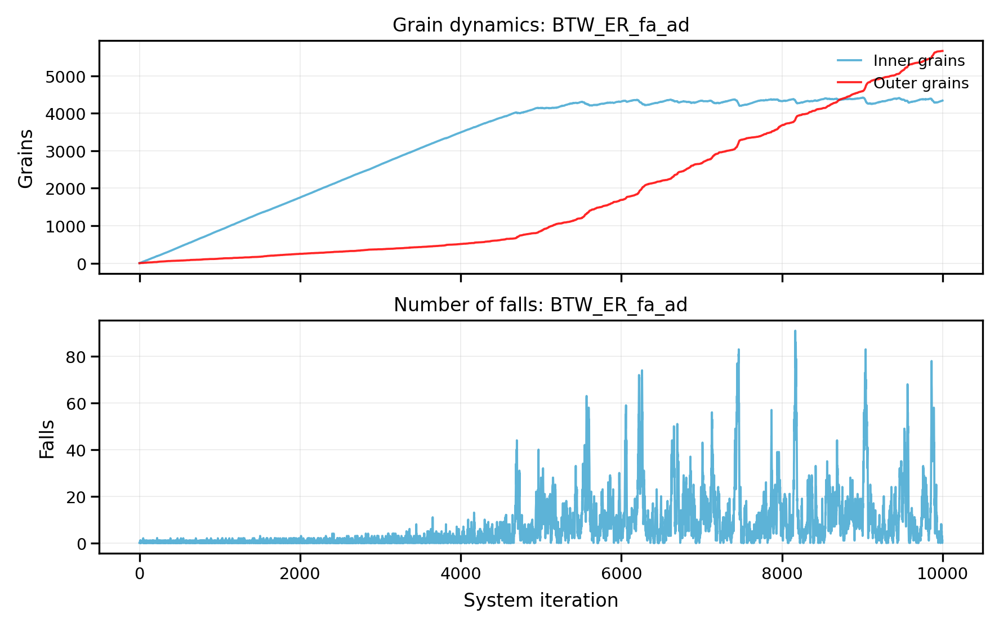

In [52]:
spread("BTW", G_ER, number_of_days, new_grains, "ER", facilitated = True, ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

100%|██████████| 9999/9999 [00:43<00:00, 229.84it/s]


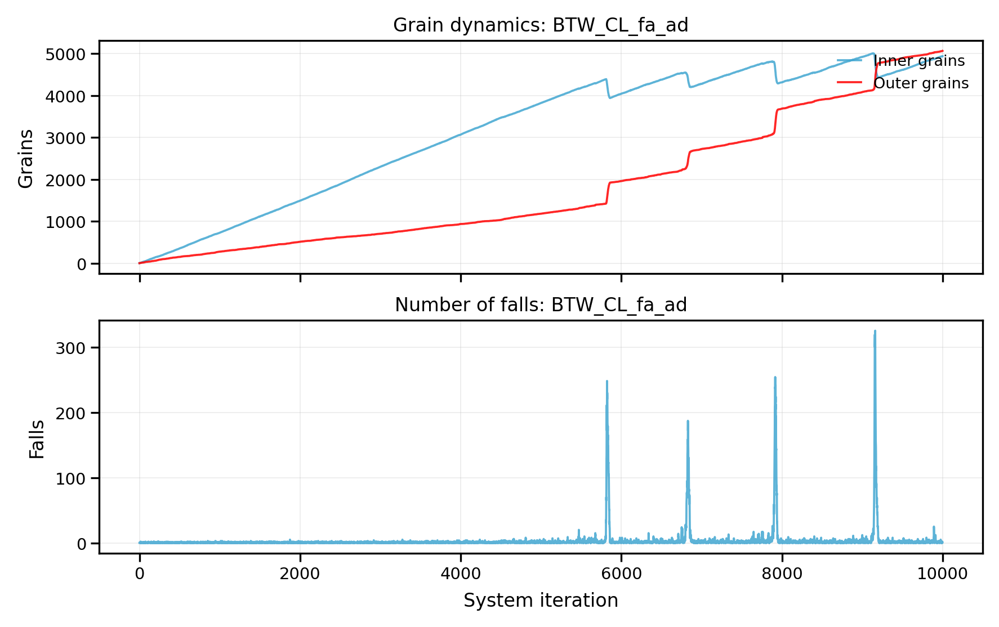

In [53]:
spread("BTW", G_CL, number_of_days, new_grains, "CL", facilitated = True, ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

##### Neutral State

100%|██████████| 9999/9999 [00:31<00:00, 314.91it/s]


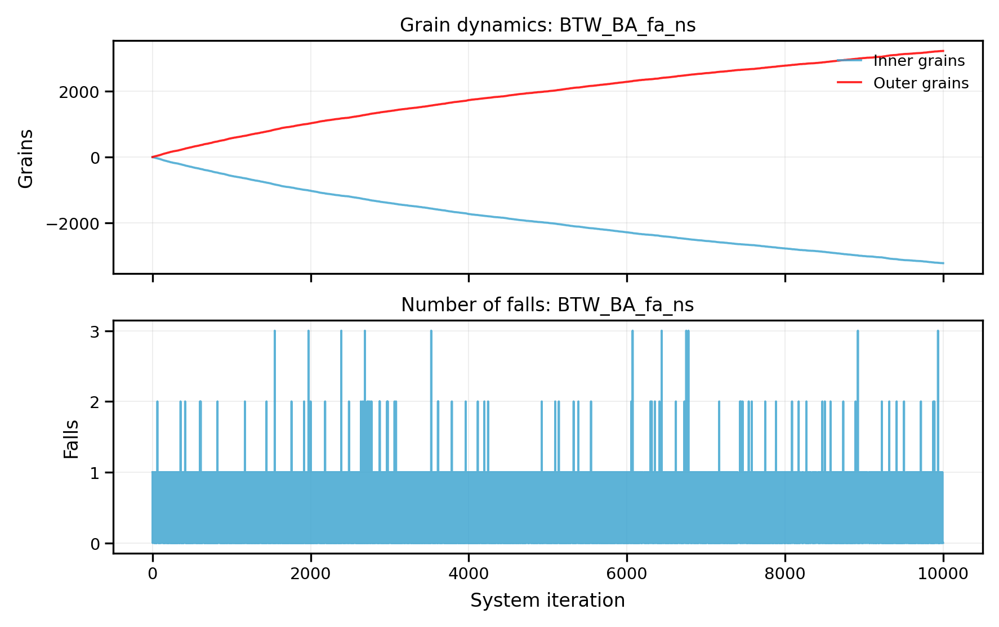

In [54]:
spread("BTW", G_BA, number_of_days, new_grains, "BA", facilitated = True, neutral_state = True, new_grains_minus = new_grains_minus)

100%|██████████| 9999/9999 [00:32<00:00, 304.57it/s]


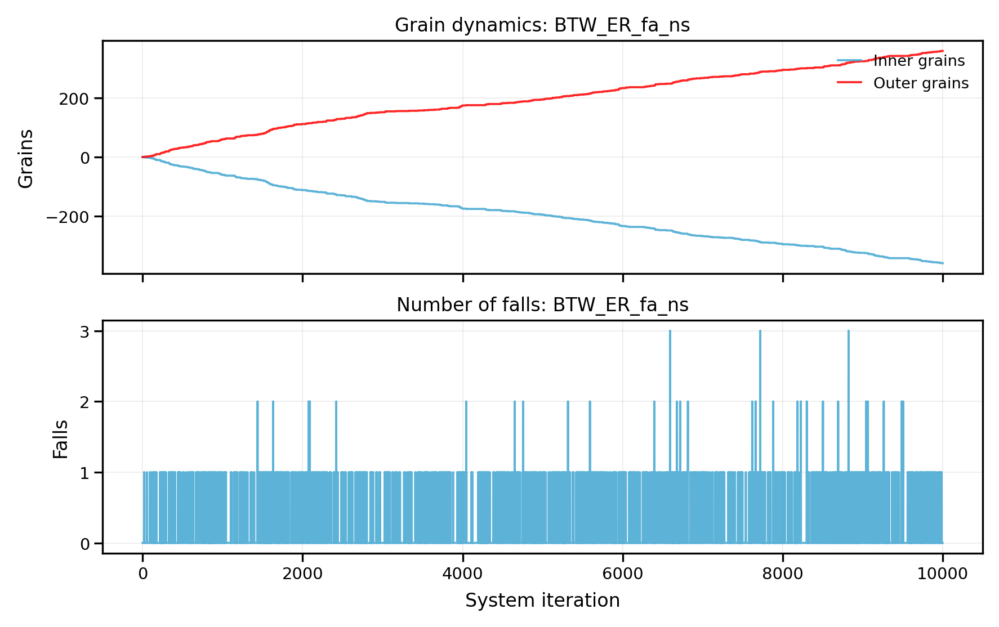

In [55]:
spread("BTW", G_ER, number_of_days, new_grains, "ER", facilitated = True, neutral_state = True, new_grains_minus = new_grains_minus)

100%|██████████| 9999/9999 [00:31<00:00, 318.65it/s]


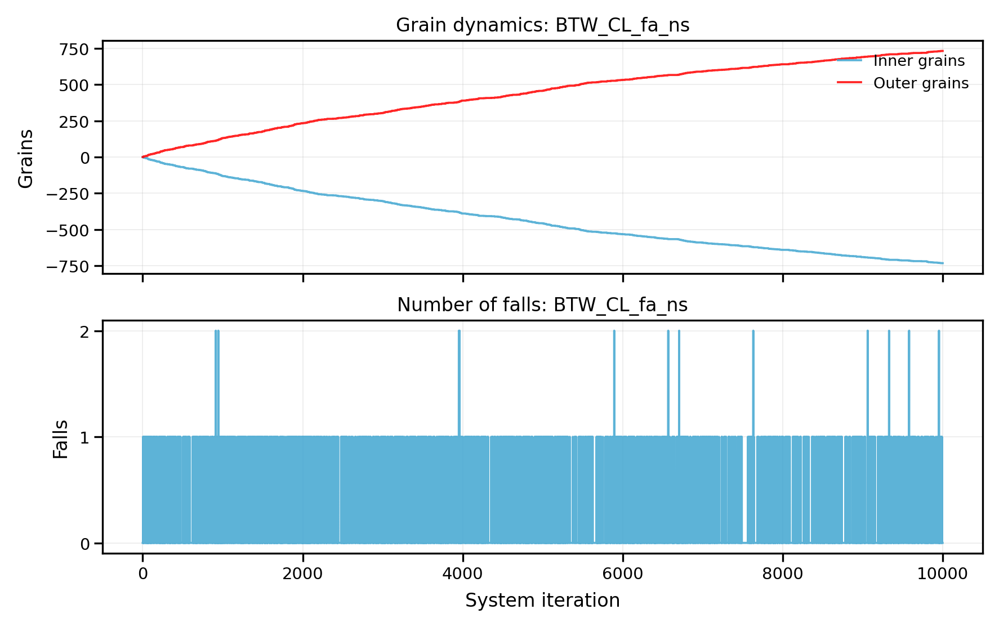

In [56]:
spread("BTW", G_CL, number_of_days, new_grains, "CL", facilitated = True, neutral_state = True, new_grains_minus = new_grains_minus)

##### Additional Pumping

100%|██████████| 9999/9999 [00:30<00:00, 329.06it/s]


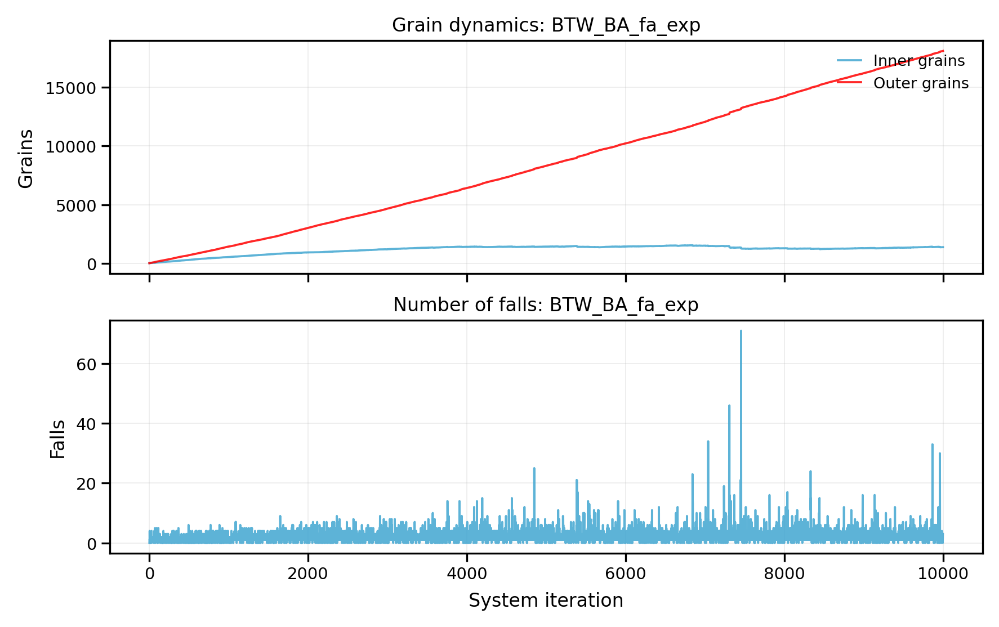

In [57]:
spread("BTW", G_BA, number_of_days, new_grains_exp, "BA", facilitated = True, expon = True)

100%|██████████| 9999/9999 [00:57<00:00, 174.93it/s]


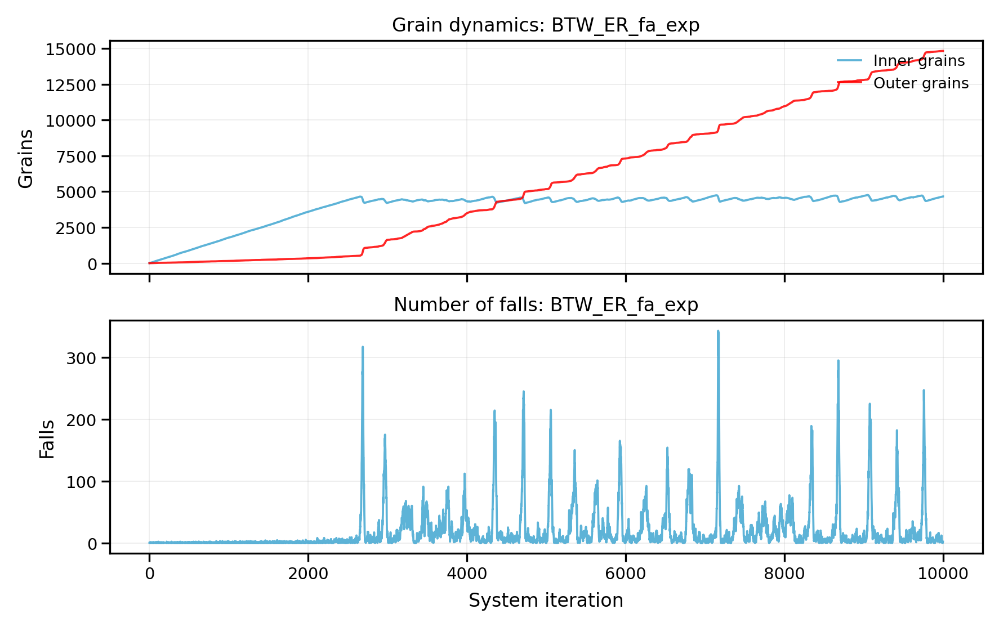

In [58]:
spread("BTW", G_ER, number_of_days, new_grains_exp, "ER", facilitated = True, expon = True)

100%|██████████| 9999/9999 [00:51<00:00, 195.20it/s]


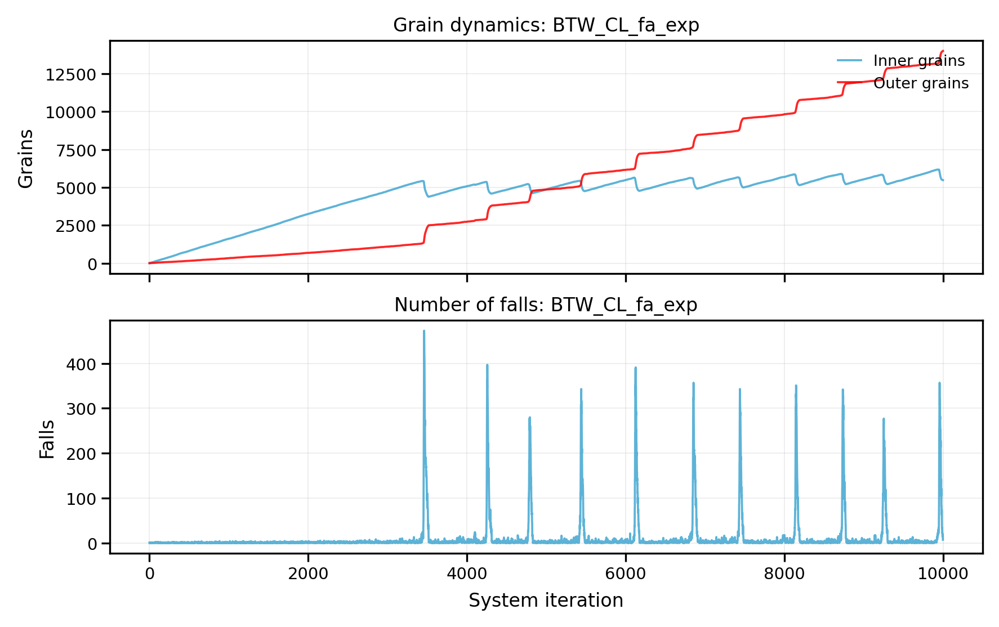

In [59]:
spread("BTW", G_CL, number_of_days, new_grains_exp, "CL", facilitated = True, expon = True)

100%|██████████| 9999/9999 [00:30<00:00, 328.49it/s]


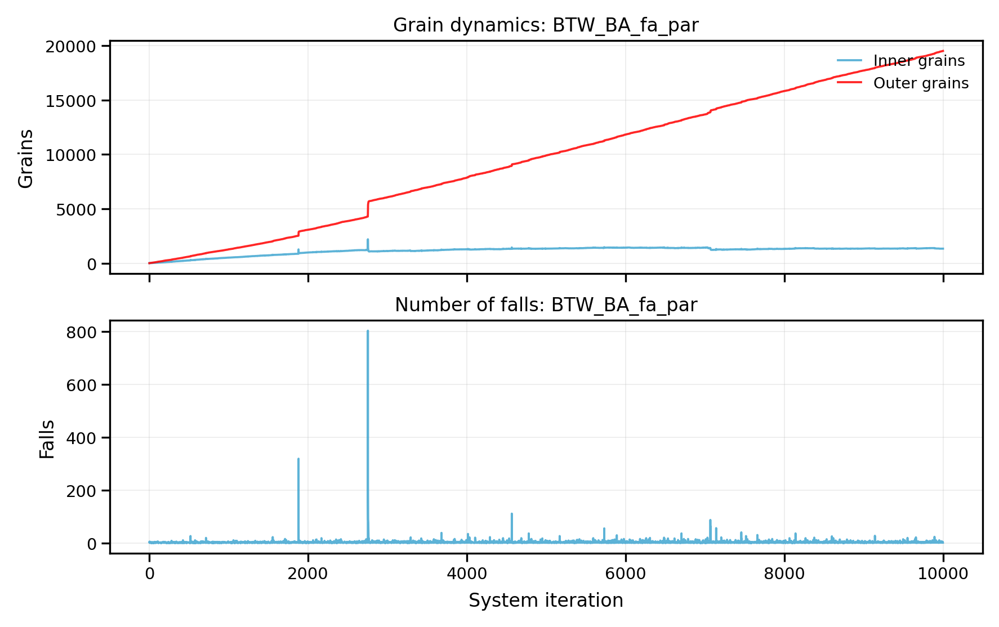

In [60]:
spread("BTW", G_BA, number_of_days, new_grains_par, "BA", facilitated = True, par = True)

100%|██████████| 9999/9999 [00:59<00:00, 166.81it/s]


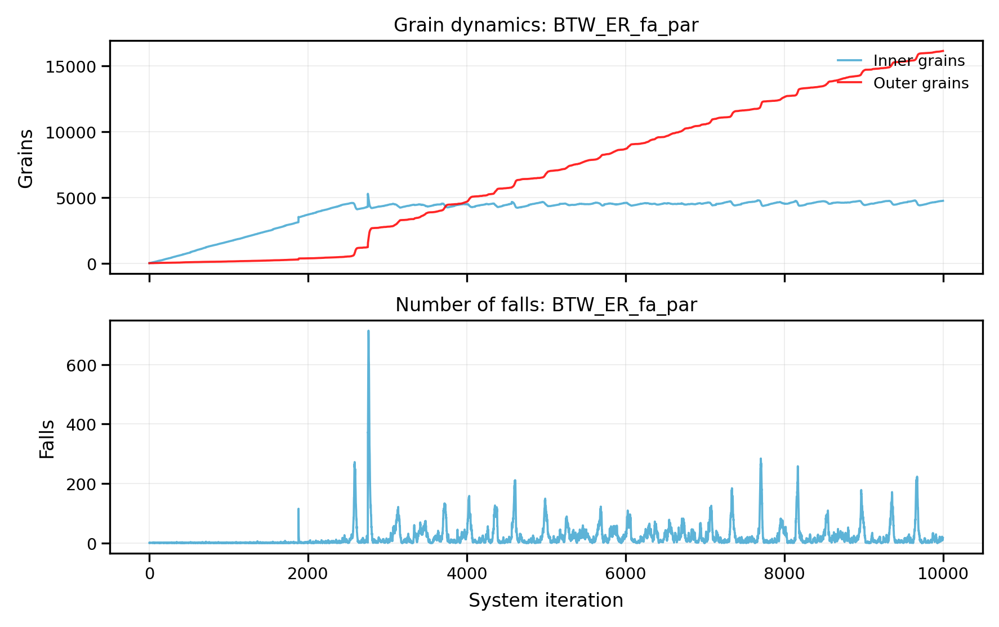

In [61]:
spread("BTW", G_ER, number_of_days, new_grains_par, "ER", facilitated = True, par = True)

100%|██████████| 9999/9999 [00:52<00:00, 189.34it/s]


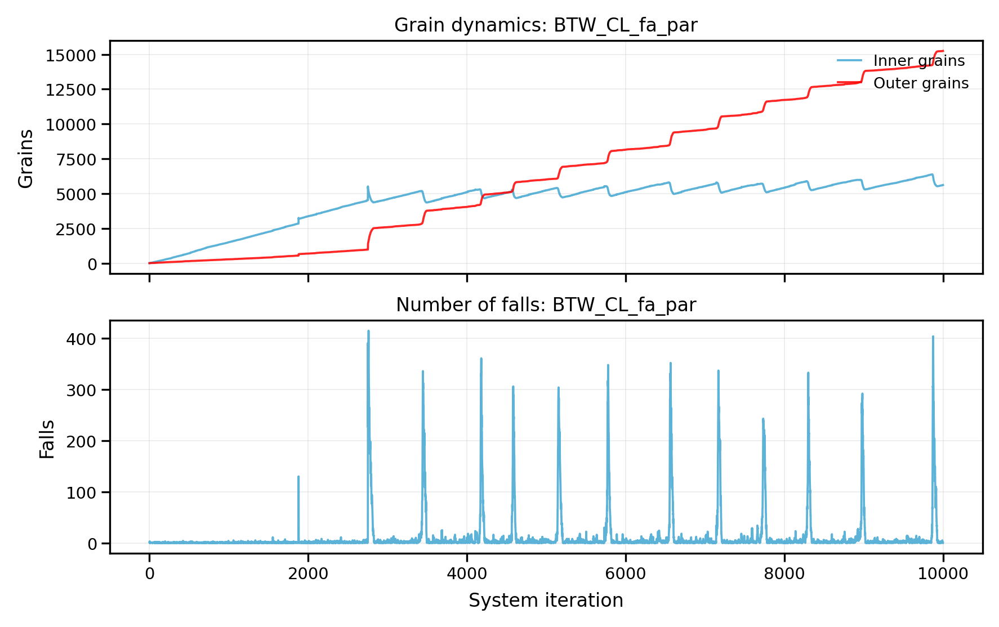

In [62]:
spread("BTW", G_CL, number_of_days, new_grains_par, "CL", facilitated = True, par = True)

### Mann

#### Standart Model

##### Standart Dissipation

100%|██████████| 9999/9999 [00:29<00:00, 336.40it/s]


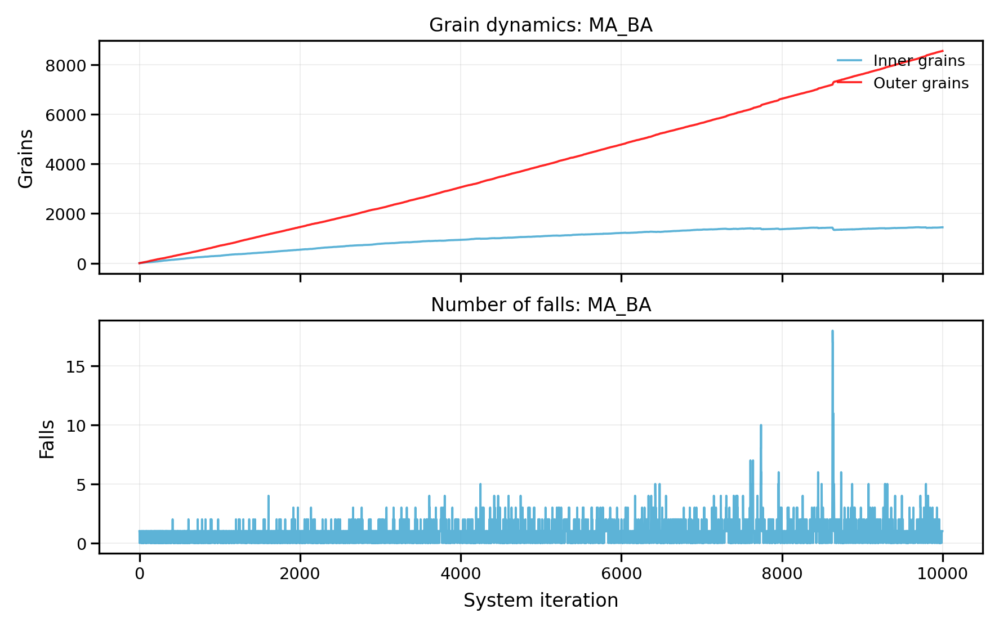

In [63]:
spread("MA", G_BA, number_of_days, new_grains, "BA")

100%|██████████| 9999/9999 [00:32<00:00, 311.22it/s]


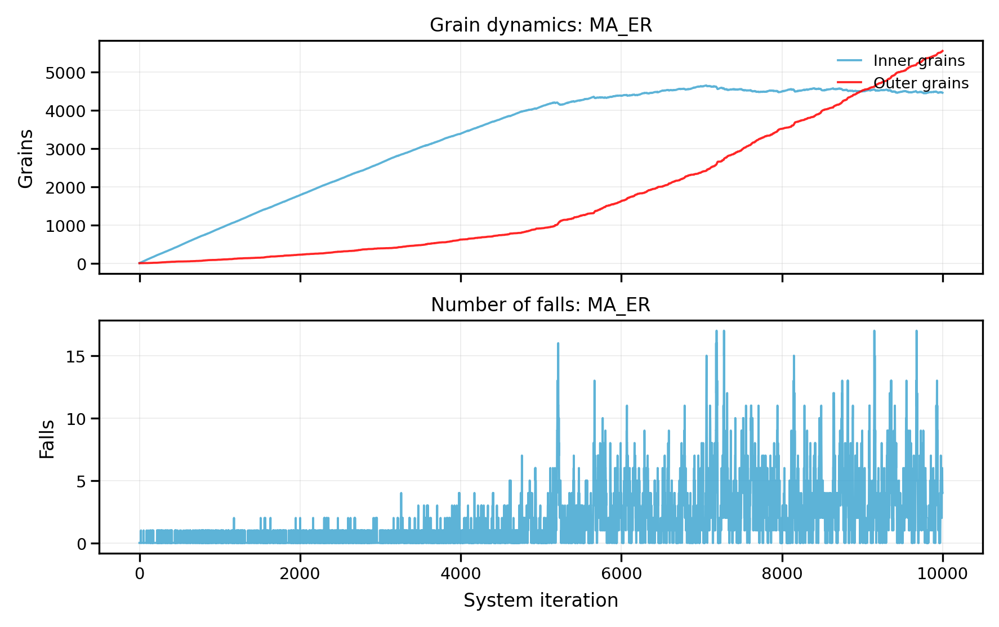

In [64]:
spread("MA", G_ER, number_of_days, new_grains, "ER")

100%|██████████| 9999/9999 [00:51<00:00, 194.84it/s]


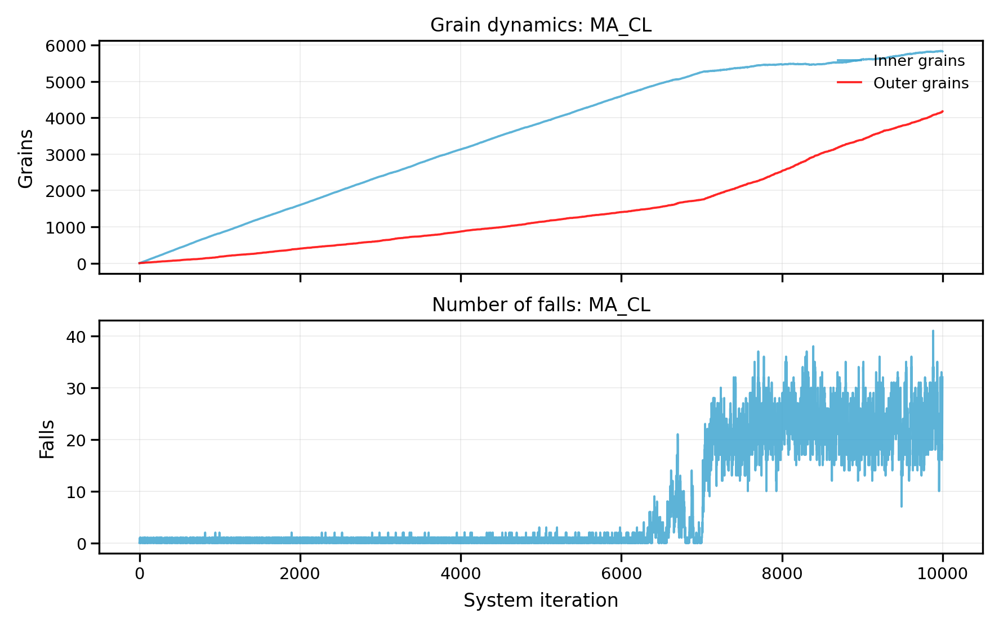

In [65]:
spread("MA", G_CL, number_of_days, new_grains, "CL")

##### Additional Dissipation

100%|██████████| 9999/9999 [00:29<00:00, 335.77it/s]


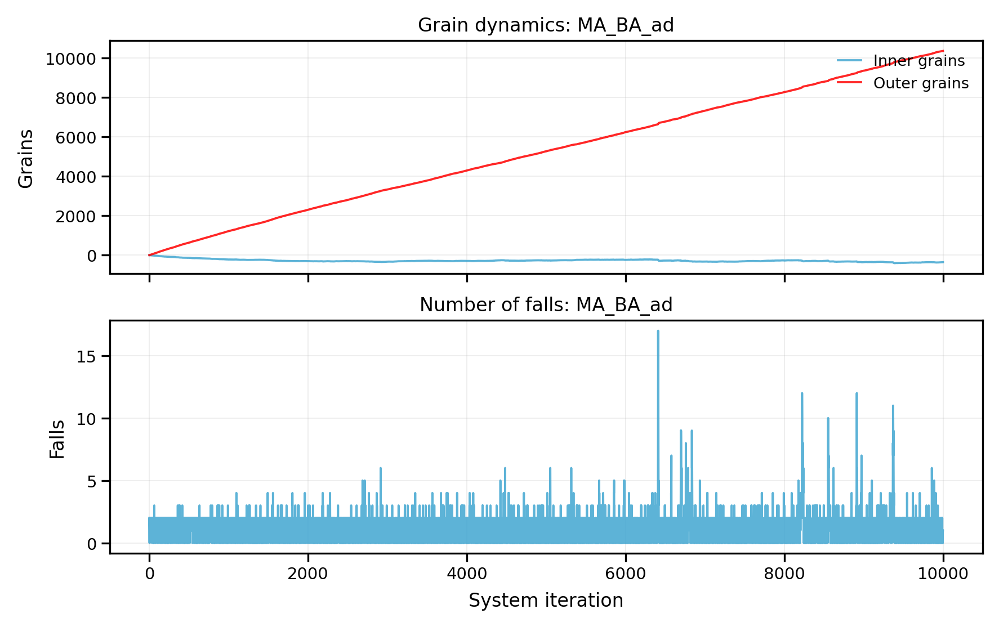

In [66]:
spread("MA", G_BA, number_of_days, new_grains, "BA", ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

100%|██████████| 9999/9999 [00:32<00:00, 306.02it/s]


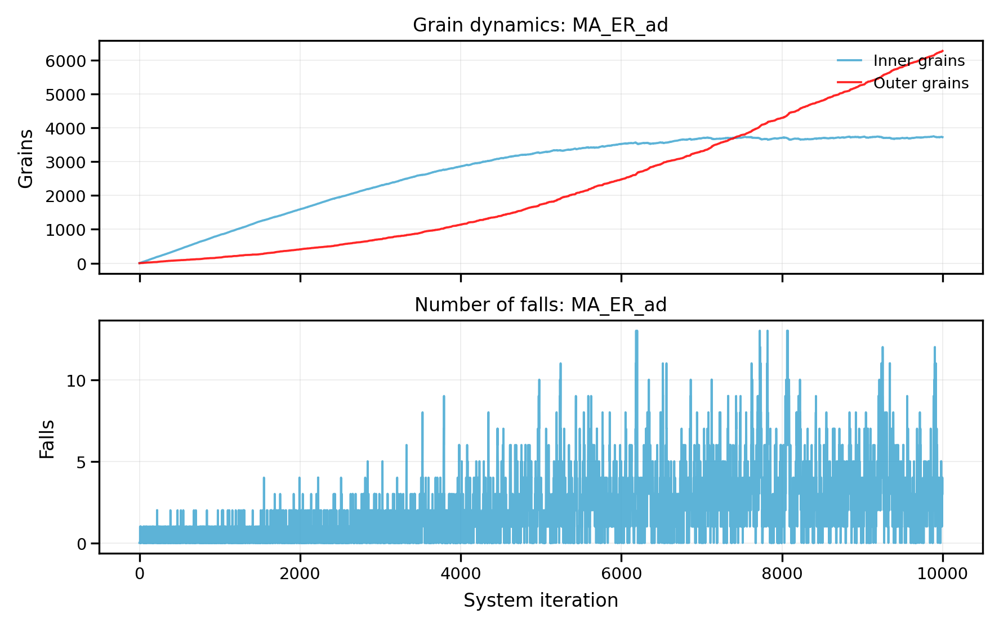

In [67]:
spread("MA", G_ER, number_of_days, new_grains, "ER", ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

100%|██████████| 9999/9999 [01:02<00:00, 160.76it/s]


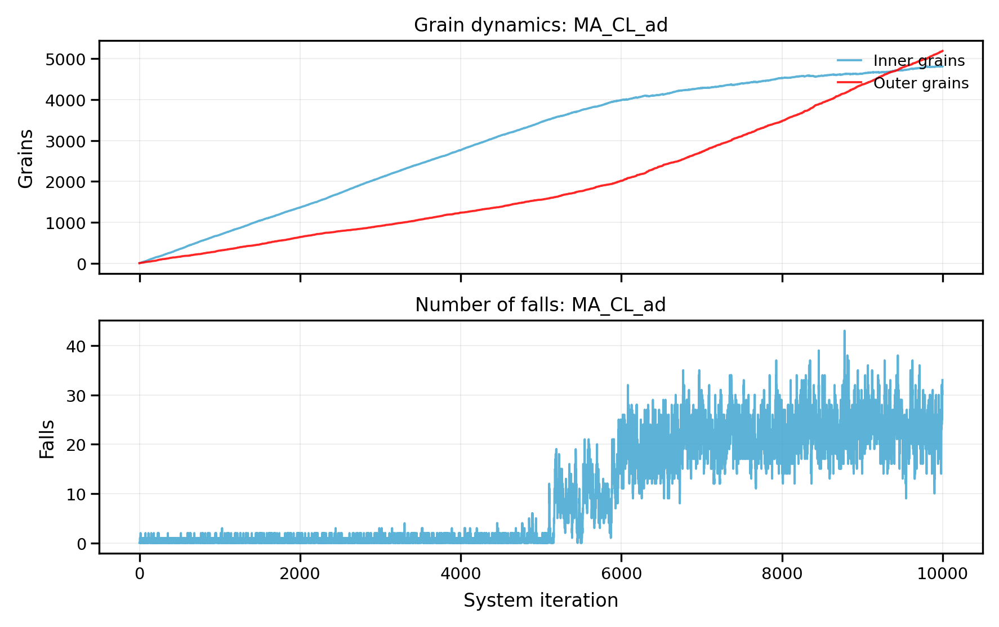

In [68]:
spread("MA", G_CL, number_of_days, new_grains, "CL", ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

##### Neutral State

100%|██████████| 9999/9999 [00:31<00:00, 321.45it/s]


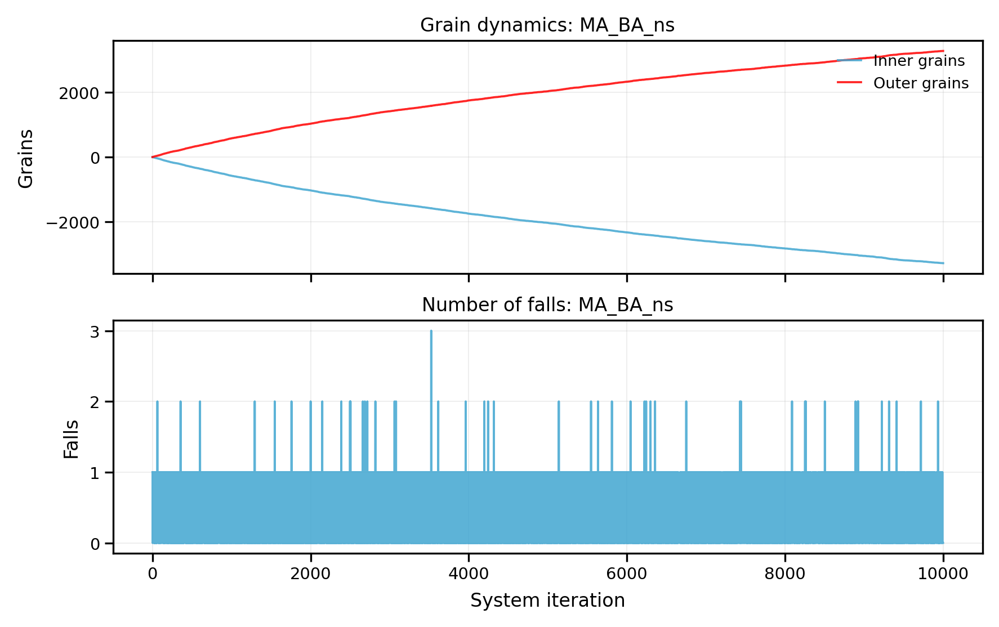

In [69]:
spread("MA", G_BA, number_of_days, new_grains, "BA", neutral_state = True, new_grains_minus = new_grains_minus)

100%|██████████| 9999/9999 [00:29<00:00, 344.32it/s]


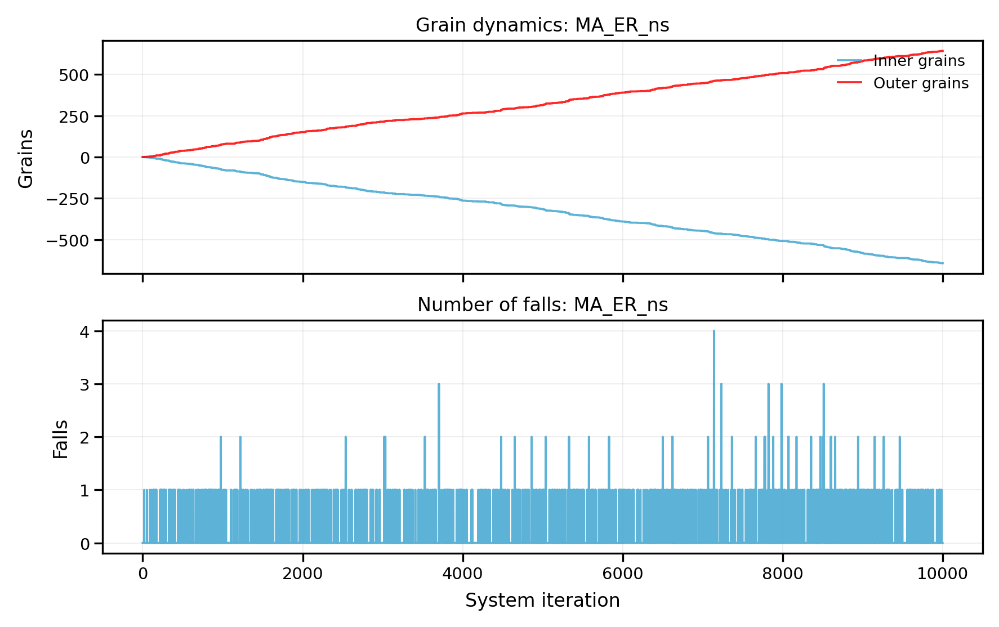

In [70]:
spread("MA", G_ER, number_of_days, new_grains, "ER", neutral_state = True, new_grains_minus = new_grains_minus)

100%|██████████| 9999/9999 [00:29<00:00, 333.94it/s]


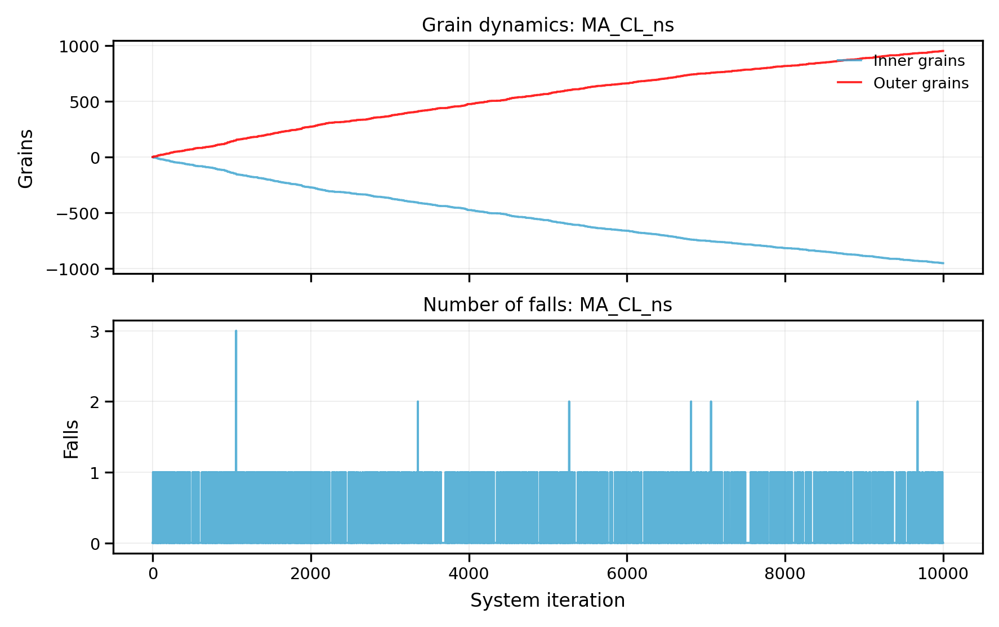

In [71]:
spread("MA", G_CL, number_of_days, new_grains, "CL", neutral_state = True, new_grains_minus = new_grains_minus)

##### Additional Pumping

100%|██████████| 9999/9999 [00:30<00:00, 331.47it/s]


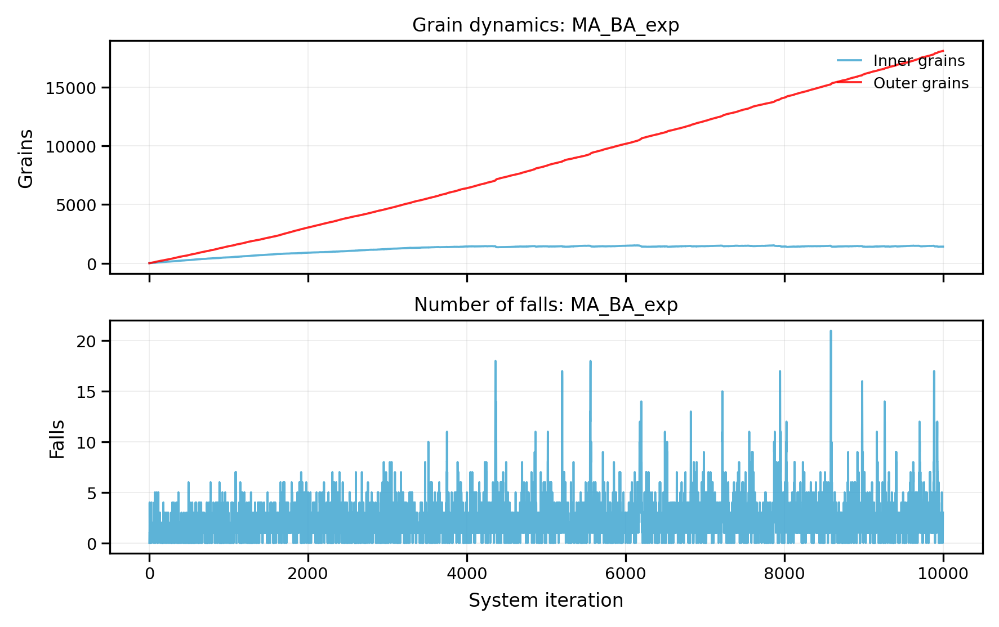

In [72]:
spread("MA", G_BA, number_of_days, new_grains_exp, "BA", expon = True)

100%|██████████| 9999/9999 [00:36<00:00, 271.74it/s]


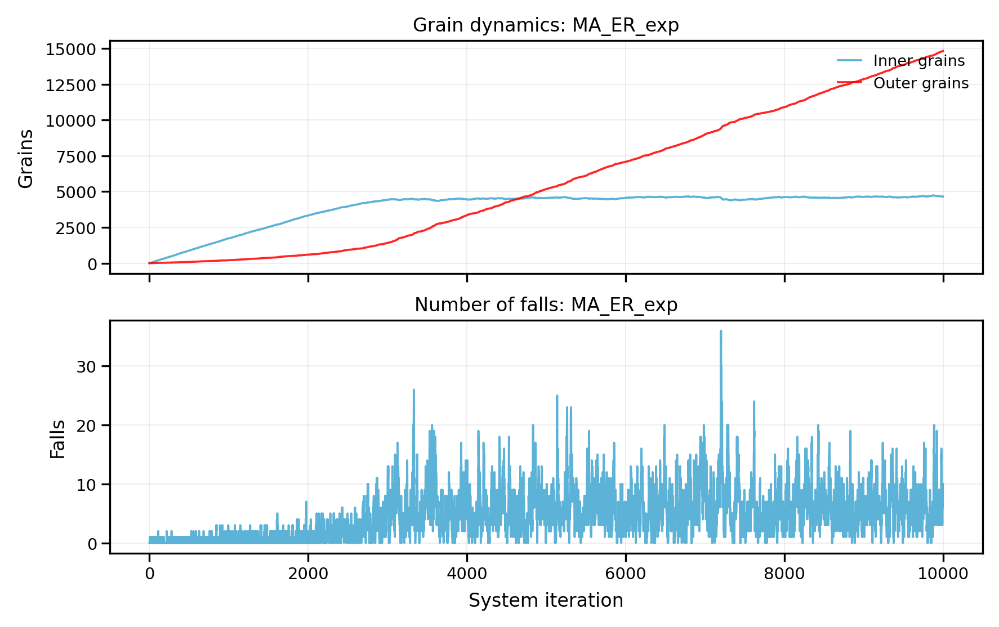

In [73]:
spread("MA", G_ER, number_of_days, new_grains_exp, "ER", expon = True)

100%|██████████| 9999/9999 [01:22<00:00, 121.22it/s]


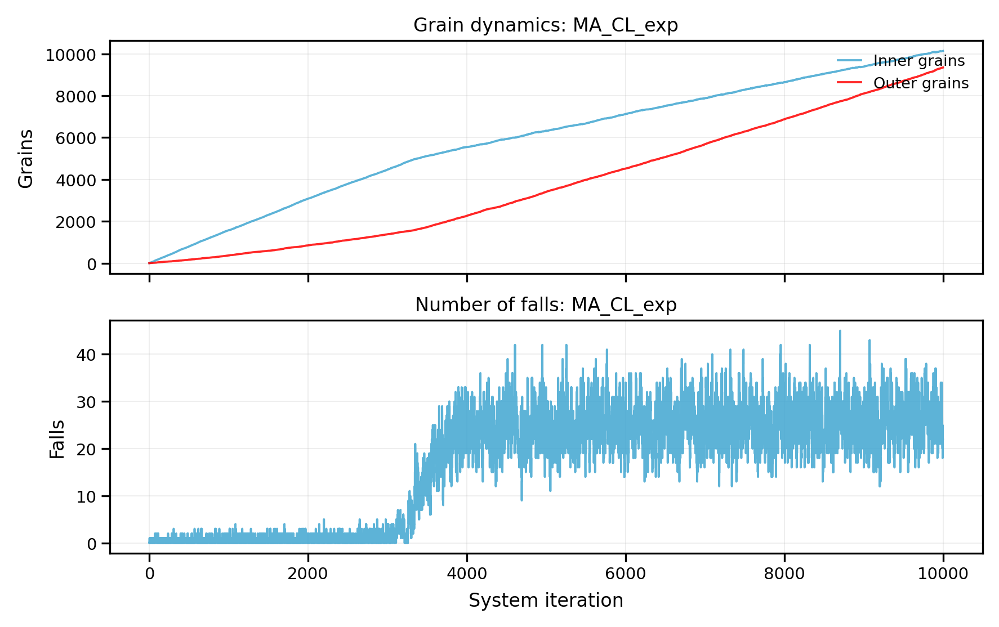

In [74]:
spread("MA", G_CL, number_of_days, new_grains_exp, "CL", expon = True)

100%|██████████| 9999/9999 [00:32<00:00, 310.60it/s]


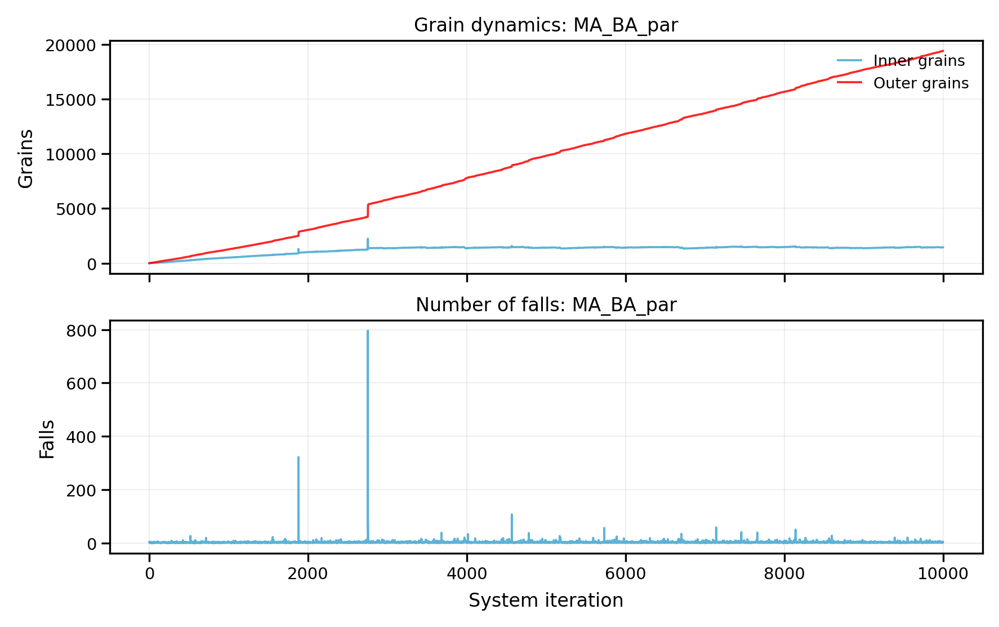

In [75]:
spread("MA", G_BA, number_of_days, new_grains_par, "BA", par = True)

100%|██████████| 9999/9999 [00:37<00:00, 263.18it/s]


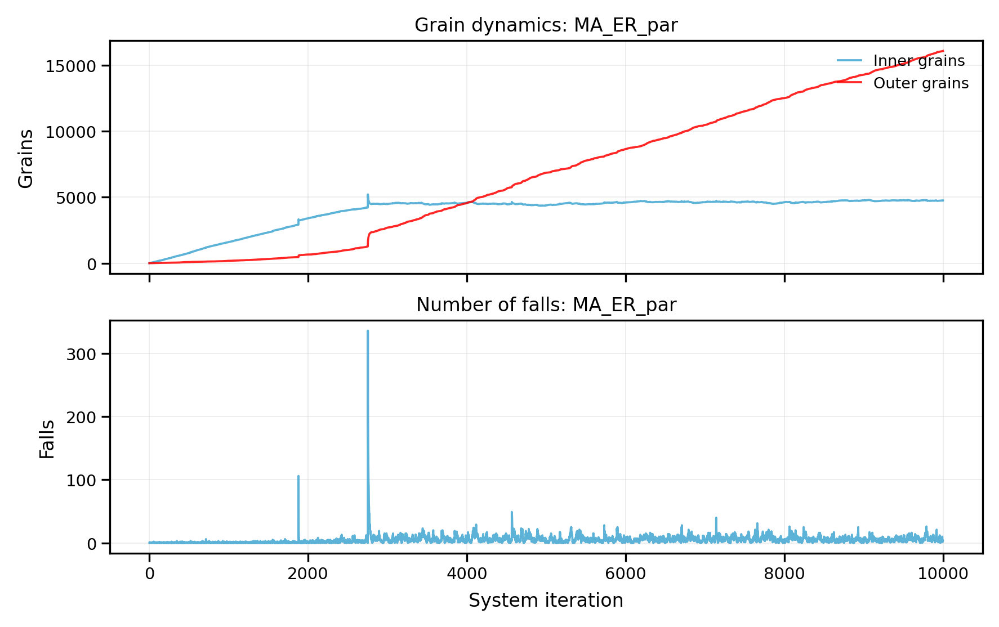

In [76]:
spread("MA", G_ER, number_of_days, new_grains_par, "ER", par = True)

100%|██████████| 9999/9999 [01:27<00:00, 114.39it/s]


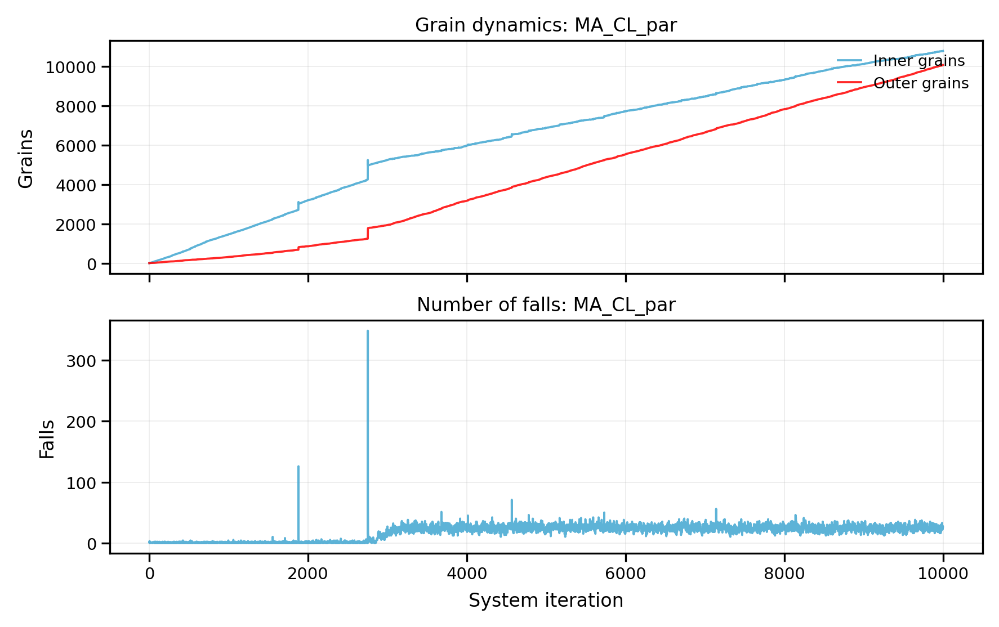

In [77]:
spread("MA", G_CL, number_of_days, new_grains_par, "CL", par = True)

#### Facilitated Model

##### Standart Dissipation

100%|██████████| 9999/9999 [00:24<00:00, 410.64it/s]


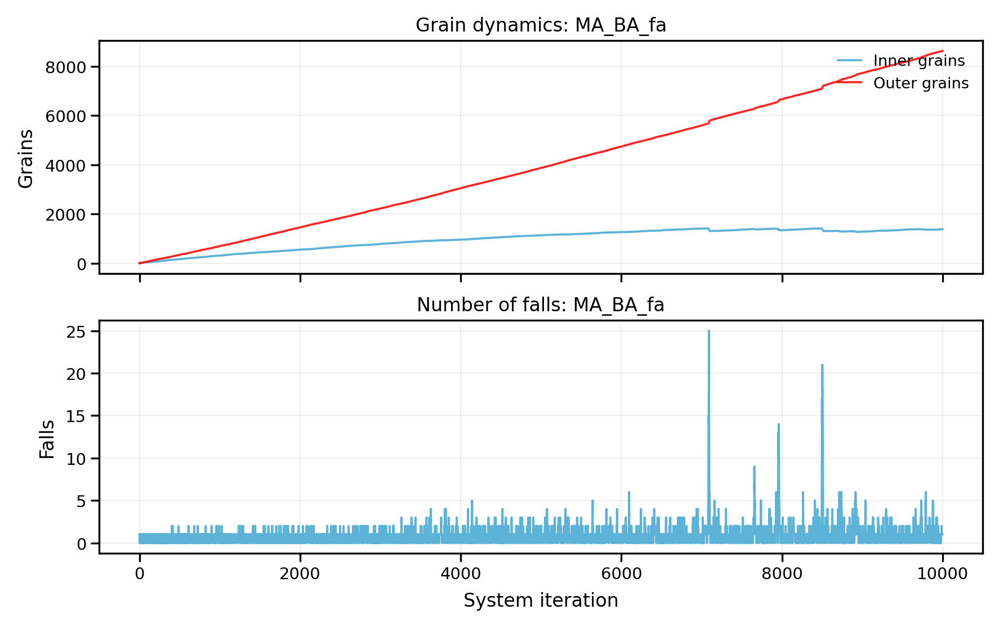

In [78]:
spread("MA", G_BA, number_of_days, new_grains, "BA", facilitated = True)

100%|██████████| 9999/9999 [00:26<00:00, 378.76it/s]


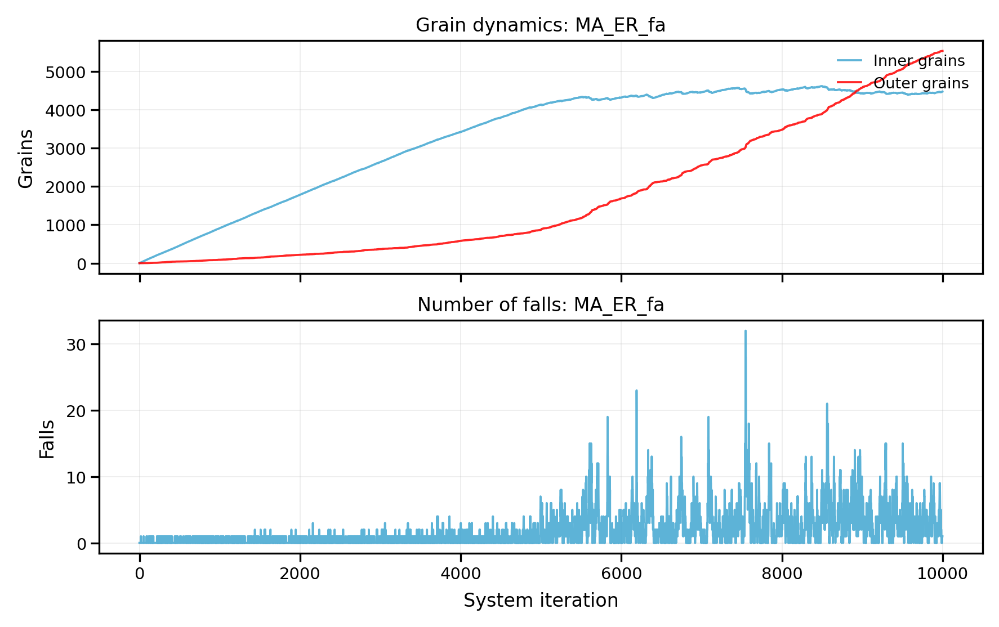

In [79]:
spread("MA", G_ER, number_of_days, new_grains, "ER", facilitated = True)

100%|██████████| 9999/9999 [00:49<00:00, 199.99it/s]


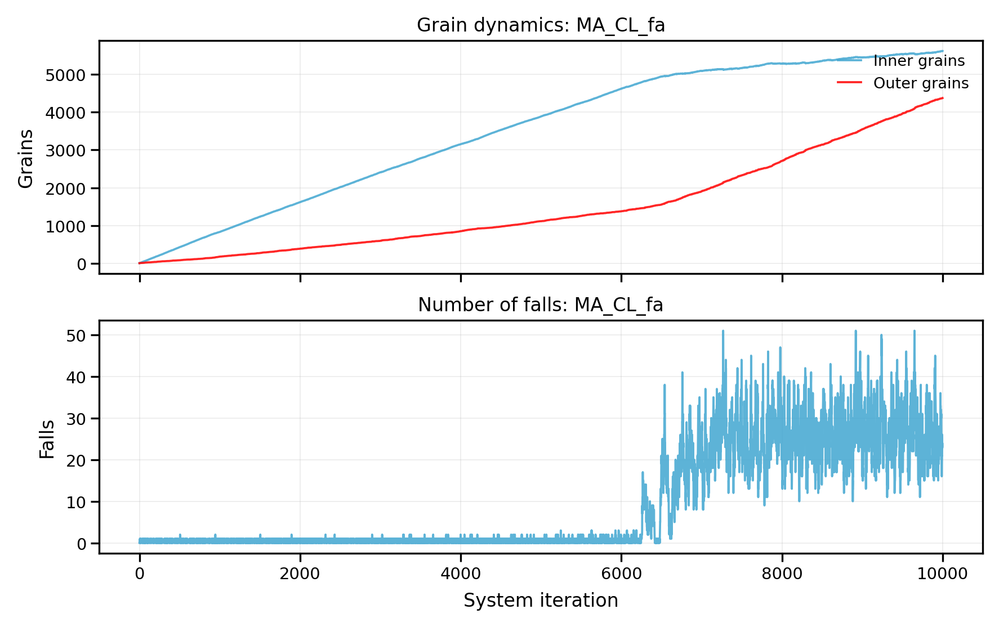

In [80]:
spread("MA", G_CL, number_of_days, new_grains, "CL", facilitated = True)

##### Additional Dissipation

100%|██████████| 9999/9999 [00:27<00:00, 367.72it/s]


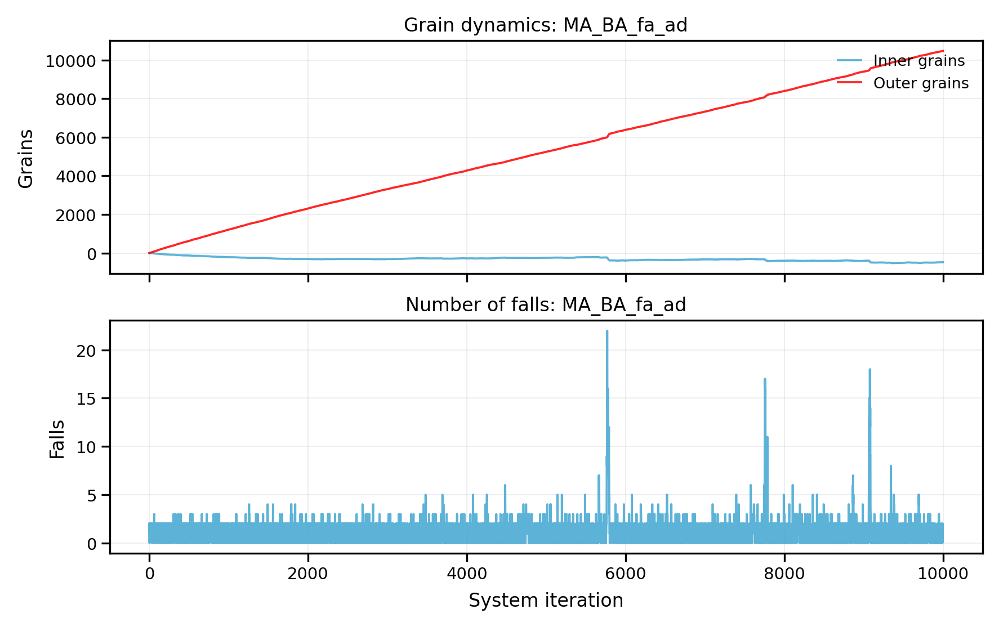

In [81]:
spread("MA", G_BA, number_of_days, new_grains, "BA", facilitated = True, ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

100%|██████████| 9999/9999 [00:28<00:00, 352.88it/s]


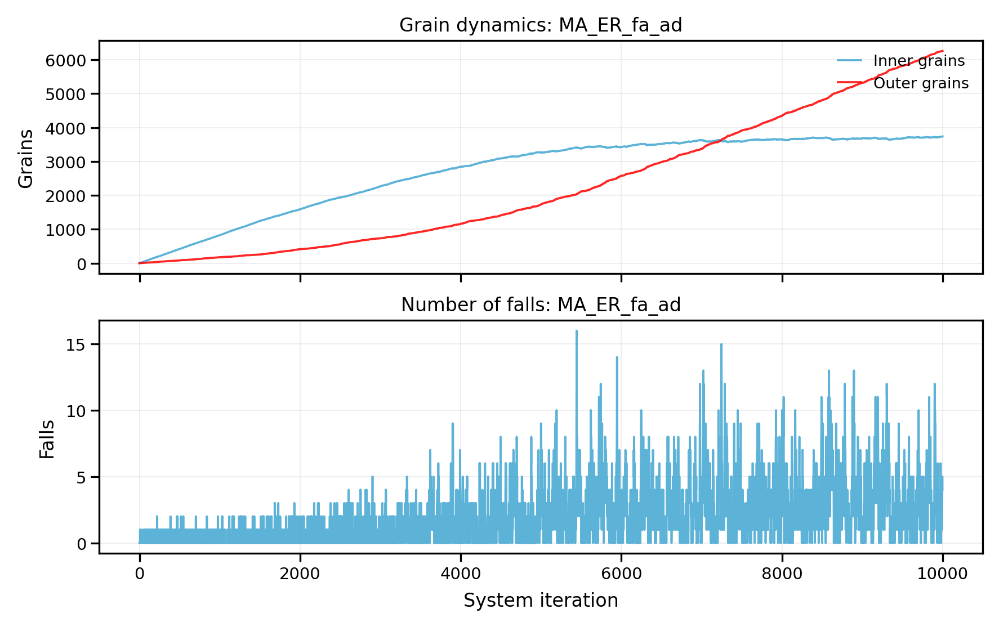

In [82]:
spread("MA", G_ER, number_of_days, new_grains, "ER", facilitated = True, ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

100%|██████████| 9999/9999 [01:01<00:00, 163.31it/s]


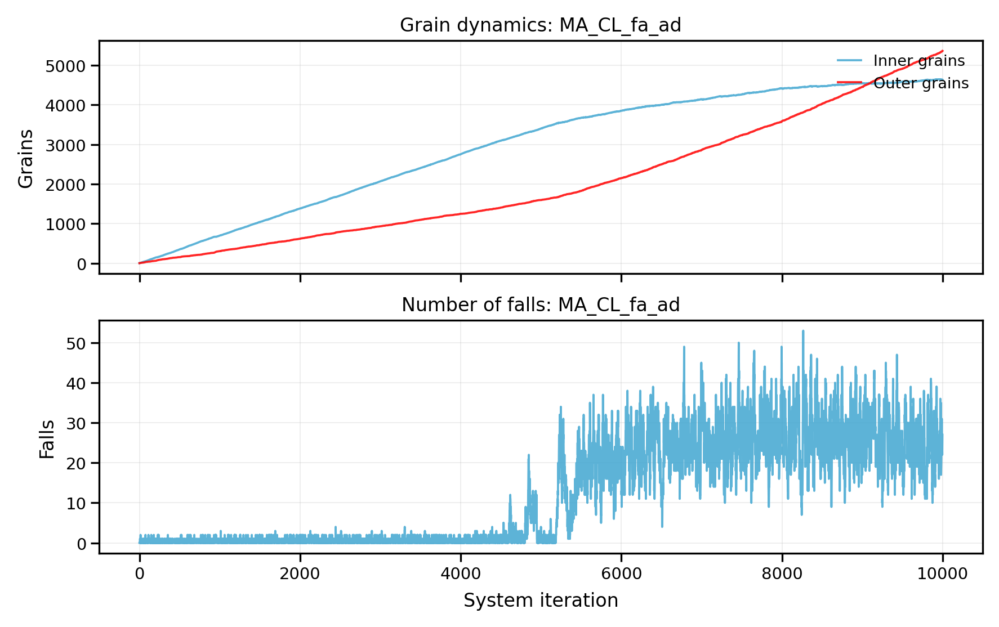

In [83]:
spread("MA", G_CL, number_of_days, new_grains, "CL", facilitated = True, ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

##### Neutral State

100%|██████████| 9999/9999 [00:23<00:00, 420.60it/s]


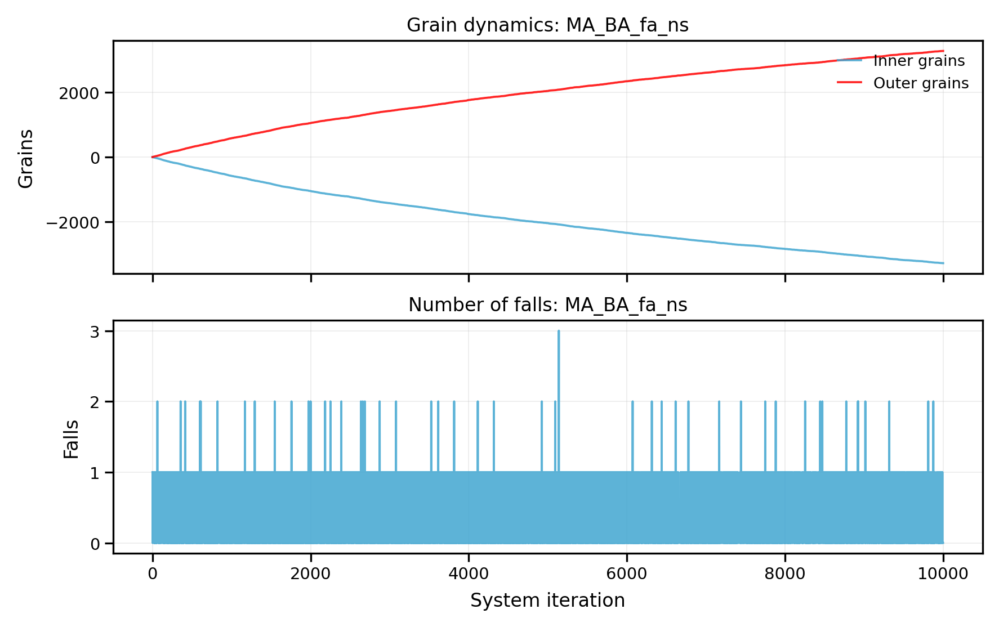

In [84]:
spread("MA", G_BA, number_of_days, new_grains, "BA", facilitated = True, neutral_state = True, new_grains_minus = new_grains_minus)

100%|██████████| 9999/9999 [00:24<00:00, 409.77it/s]


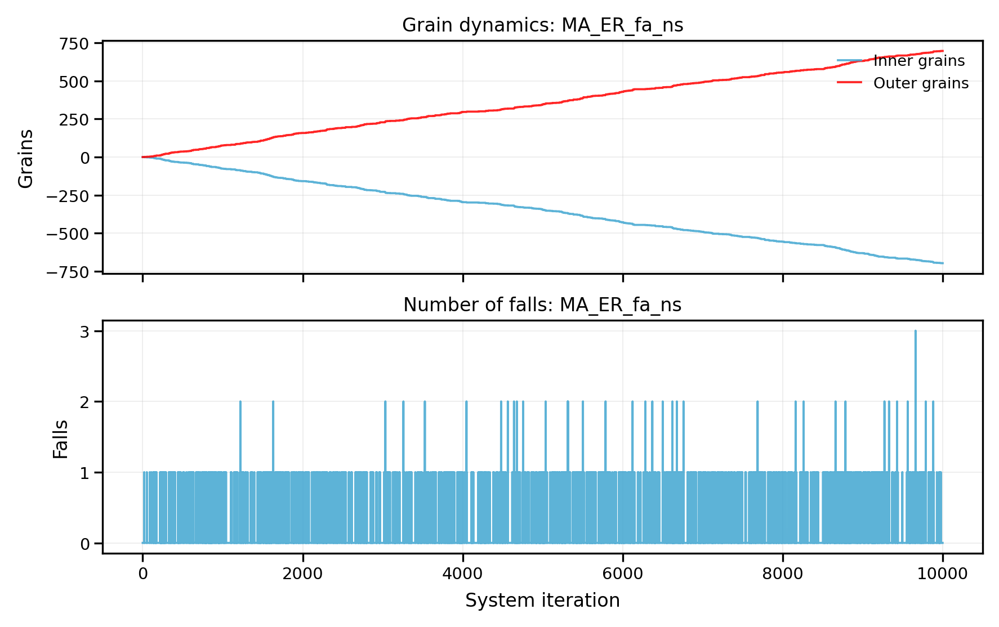

In [85]:
spread("MA", G_ER, number_of_days, new_grains, "ER", facilitated = True, neutral_state = True, new_grains_minus = new_grains_minus)

100%|██████████| 9999/9999 [00:23<00:00, 422.43it/s]


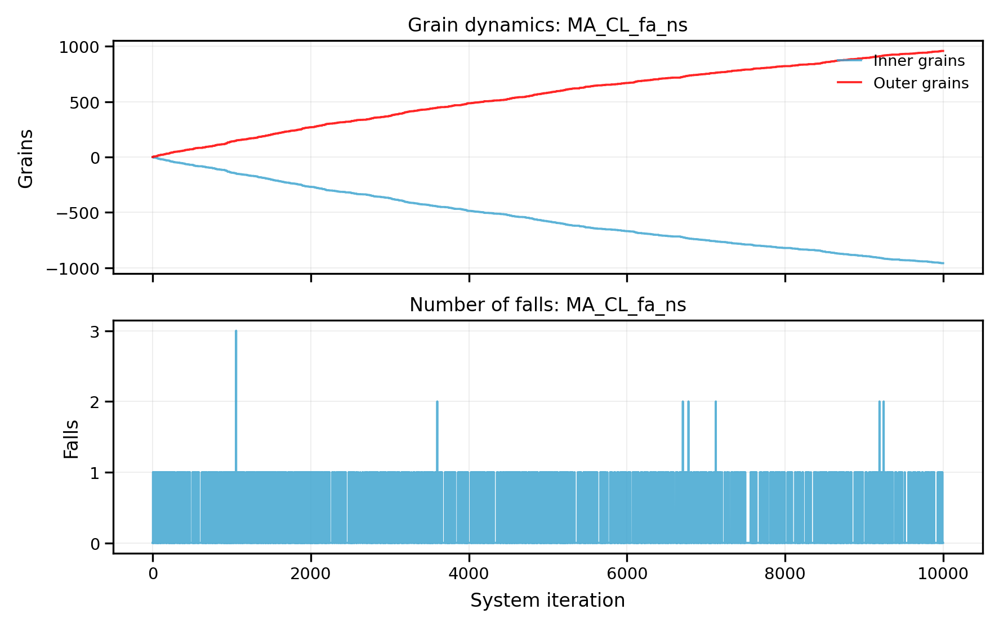

In [86]:
spread("MA", G_CL, number_of_days, new_grains, "CL", facilitated = True, neutral_state = True, new_grains_minus = new_grains_minus)

##### Additional Pumping

100%|██████████| 9999/9999 [00:24<00:00, 405.71it/s]


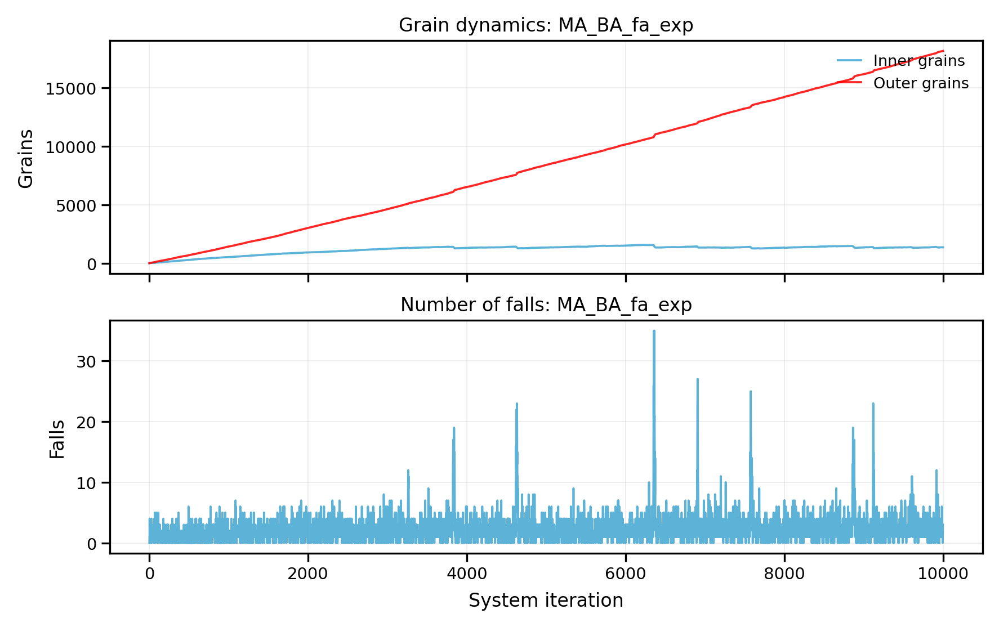

In [87]:
spread("MA", G_BA, number_of_days, new_grains_exp, "BA", facilitated = True, expon = True)

100%|██████████| 9999/9999 [00:29<00:00, 341.70it/s]


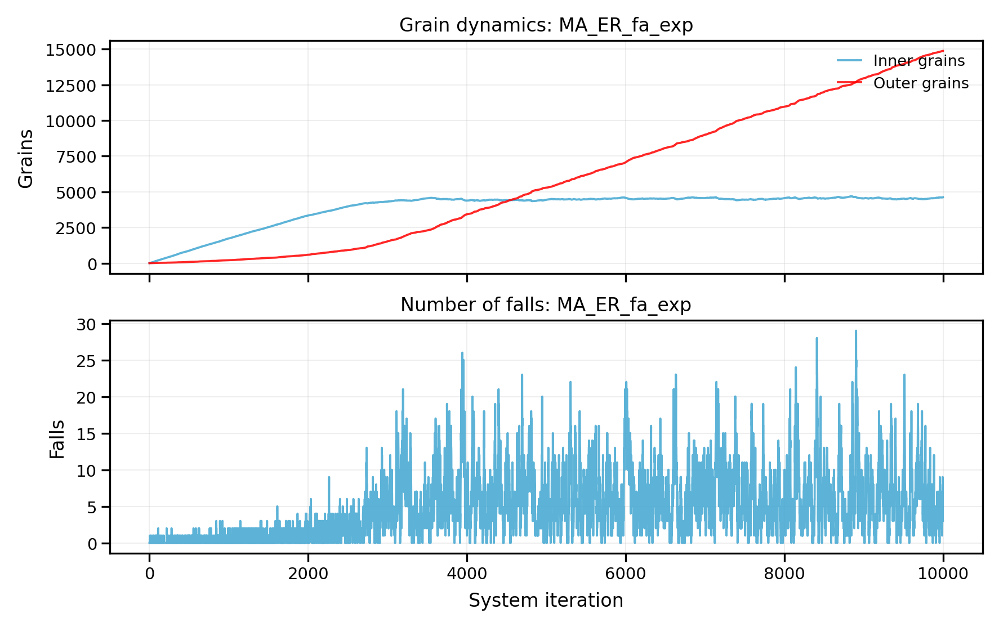

In [88]:
spread("MA", G_ER, number_of_days, new_grains_exp, "ER", facilitated = True, expon = True)

100%|██████████| 9999/9999 [01:20<00:00, 123.86it/s]


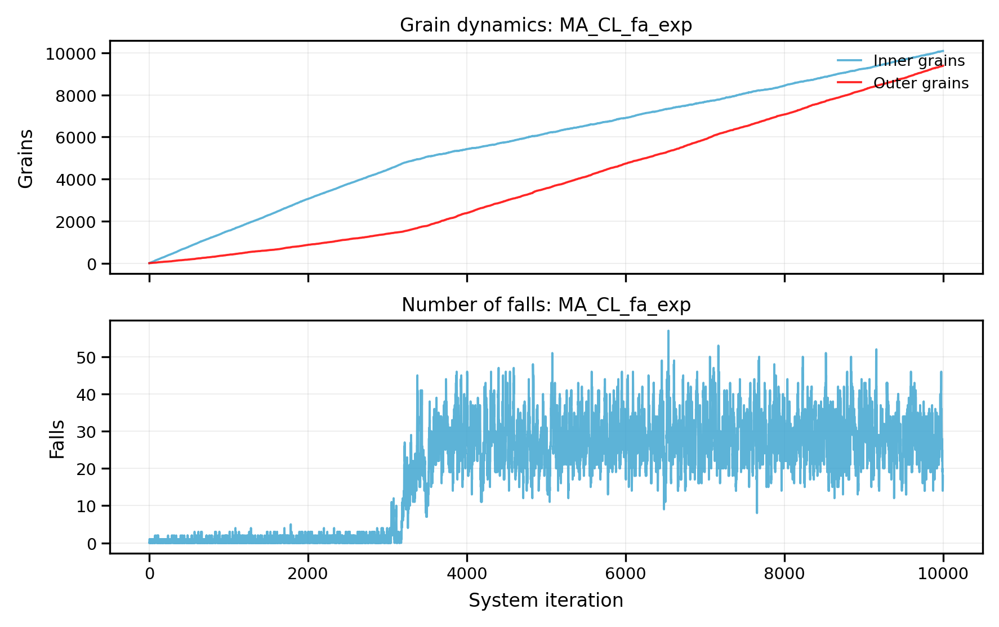

In [89]:
spread("MA", G_CL, number_of_days, new_grains_exp, "CL", facilitated = True, expon = True)

100%|██████████| 9999/9999 [00:24<00:00, 414.29it/s]


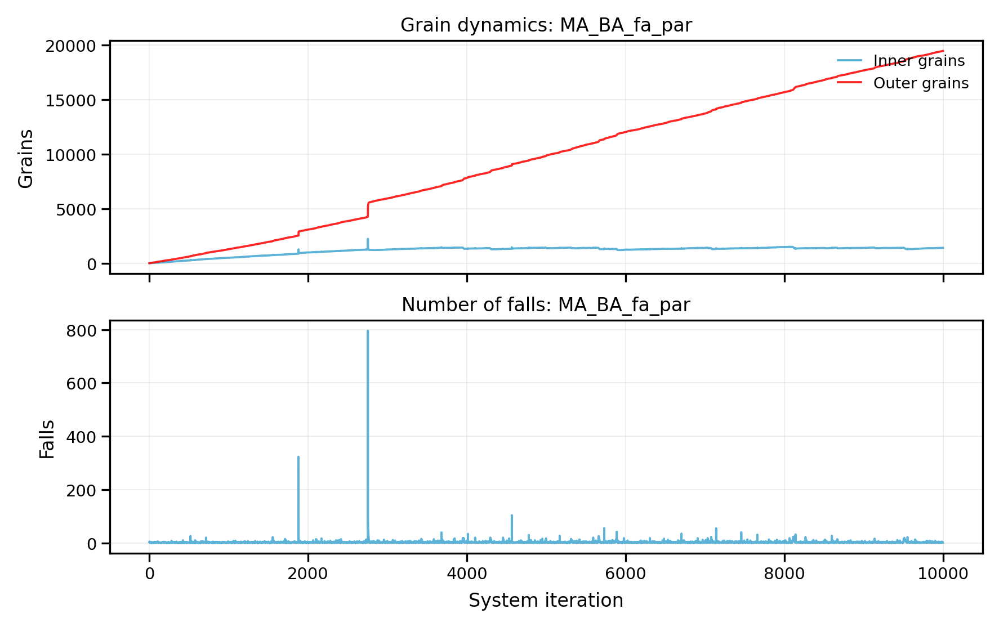

In [90]:
spread("MA", G_BA, number_of_days, new_grains_par, "BA", facilitated = True, par = True)

100%|██████████| 9999/9999 [00:29<00:00, 333.73it/s]


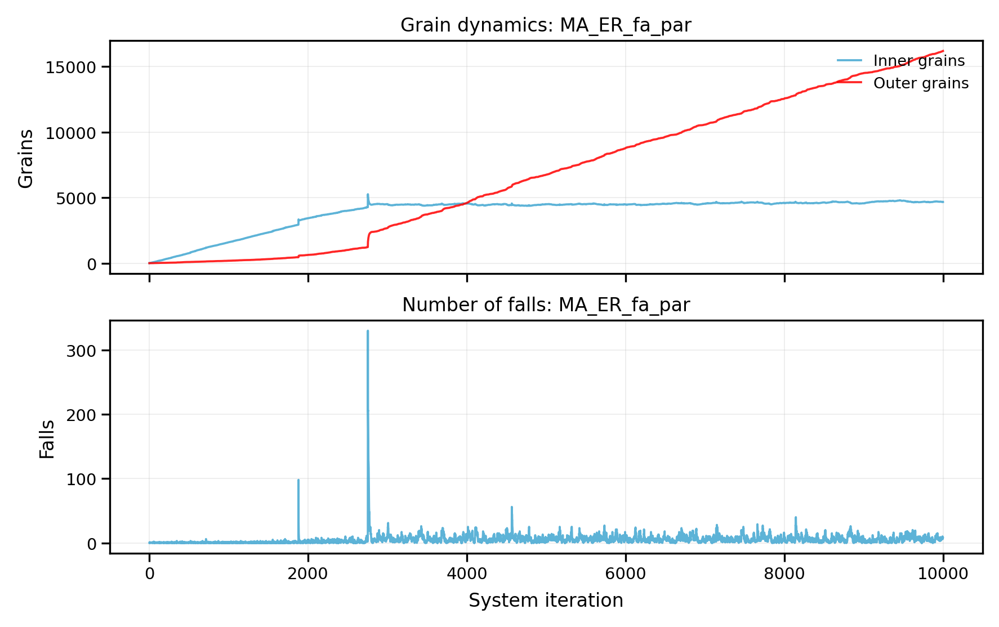

In [91]:
spread("MA", G_ER, number_of_days, new_grains_par, "ER", facilitated = True, par = True)

100%|██████████| 9999/9999 [01:24<00:00, 118.97it/s]


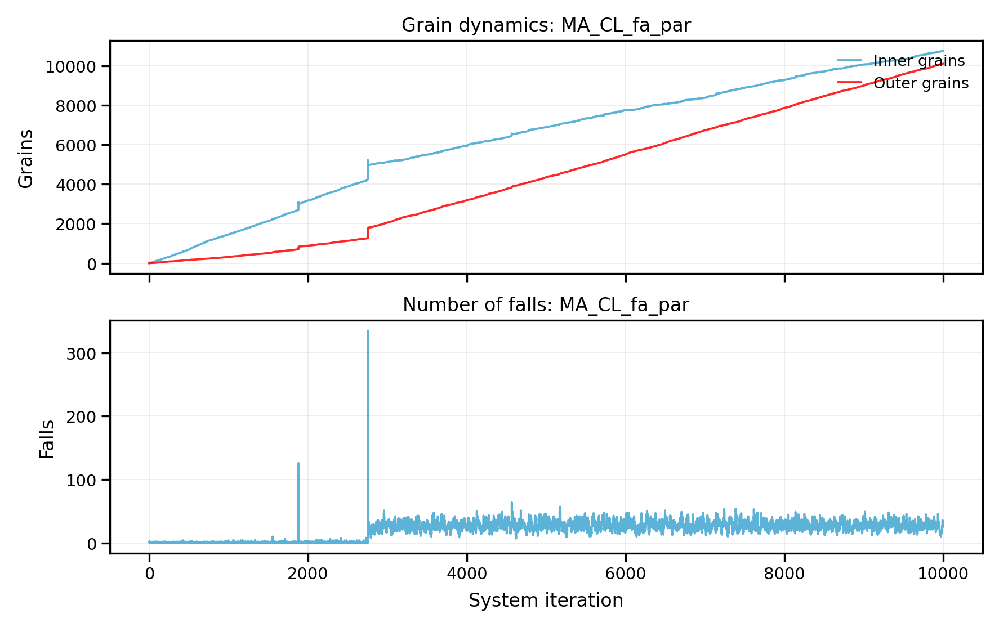

In [92]:
spread("MA", G_CL, number_of_days, new_grains_par, "CL", facilitated = True, par = True)

### Feder

#### Standart Model

##### Standart Dissipation

100%|██████████| 9999/9999 [00:22<00:00, 438.71it/s]


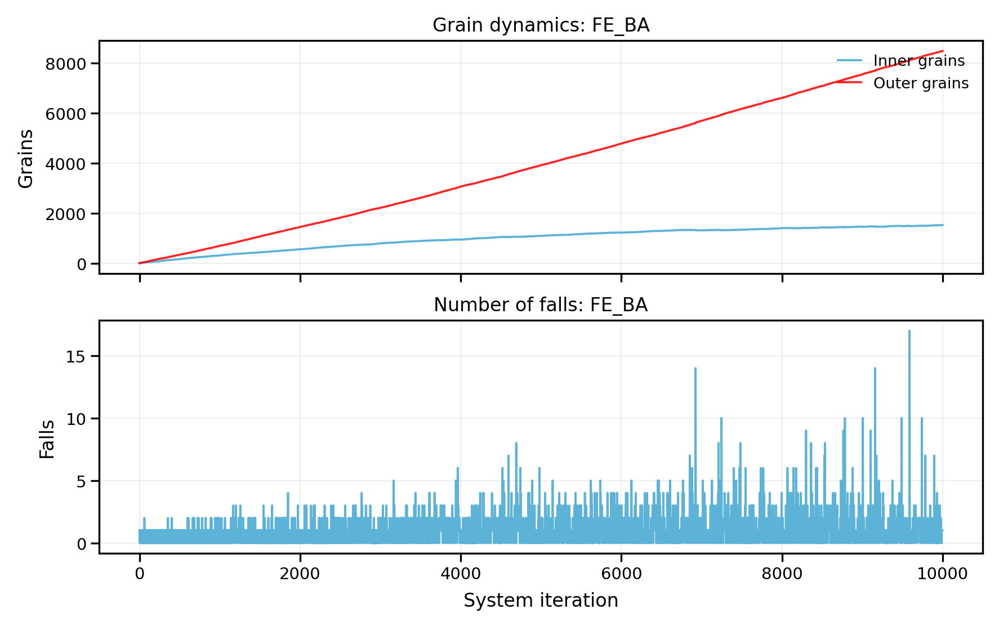

In [93]:
spread("FE", G_BA, number_of_days, new_grains, "BA")

100%|██████████| 9999/9999 [00:31<00:00, 318.64it/s]


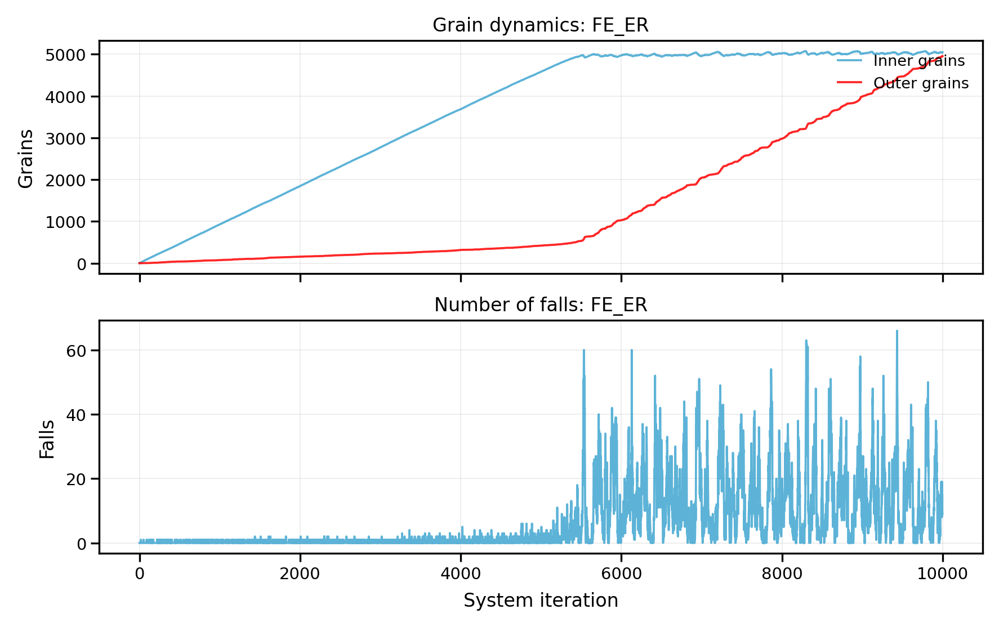

In [94]:
spread("FE", G_ER, number_of_days, new_grains, "ER")

100%|██████████| 9999/9999 [00:25<00:00, 399.70it/s]


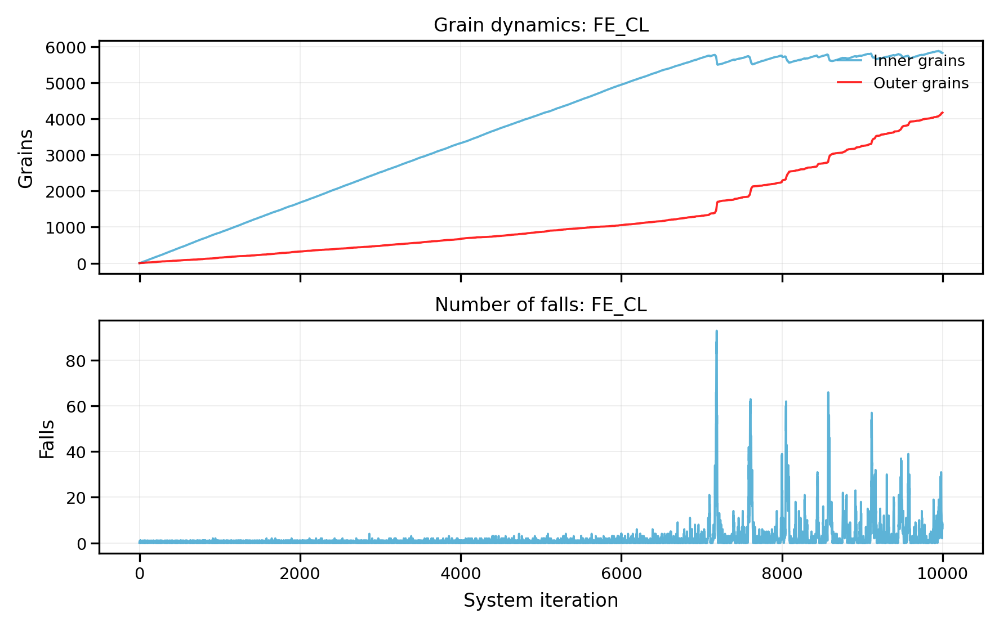

In [95]:
spread("FE", G_CL, number_of_days, new_grains, "CL")

##### Additional Dissipation

100%|██████████| 9999/9999 [00:24<00:00, 413.48it/s]


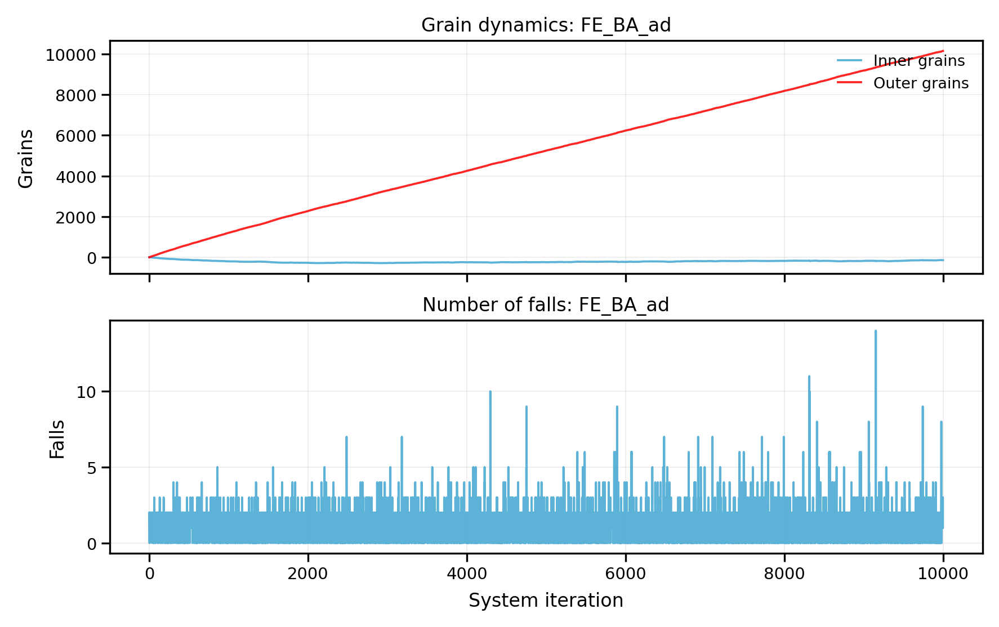

In [96]:
spread("FE", G_BA, number_of_days, new_grains, "BA", ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

100%|██████████| 9999/9999 [00:32<00:00, 305.28it/s]


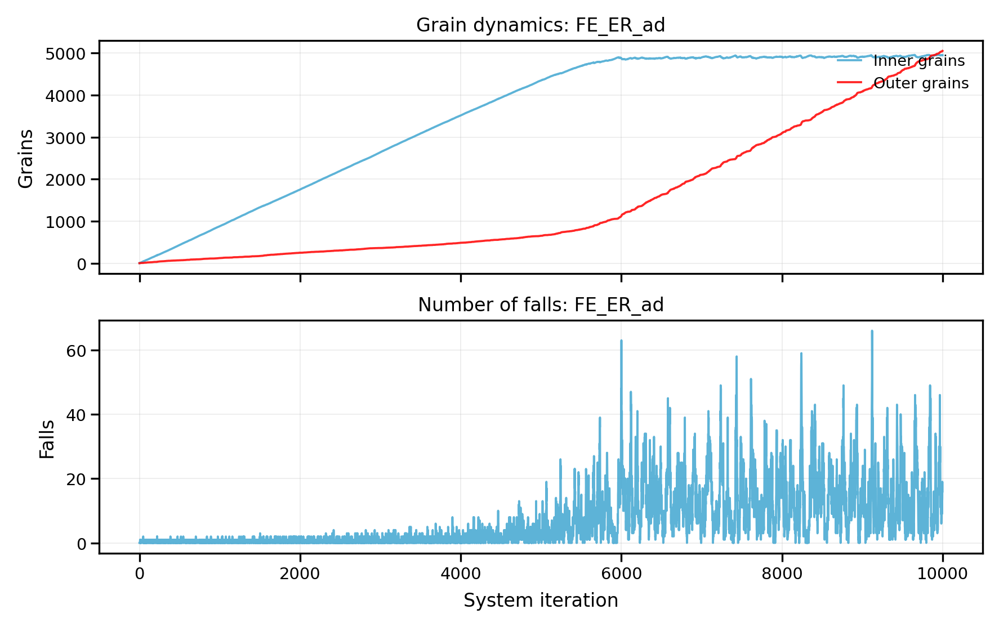

In [97]:
spread("FE", G_ER, number_of_days, new_grains, "ER", ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

100%|██████████| 9999/9999 [00:26<00:00, 374.17it/s]


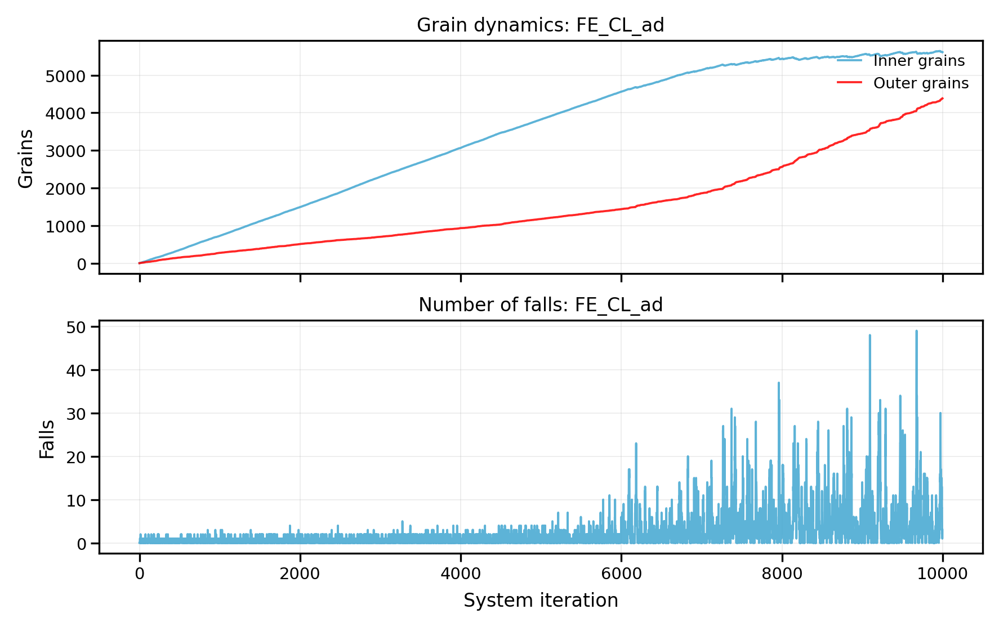

In [98]:
spread("FE", G_CL, number_of_days, new_grains, "CL", ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

##### Neutral State

100%|██████████| 9999/9999 [00:23<00:00, 421.58it/s]


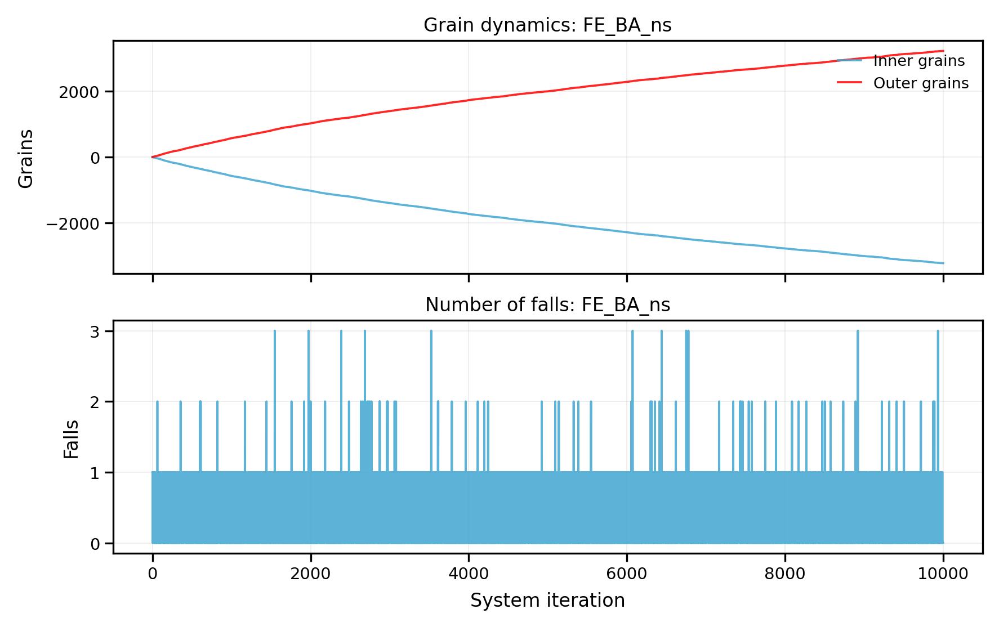

In [99]:
spread("FE", G_BA, number_of_days, new_grains, "BA", neutral_state = True, new_grains_minus = new_grains_minus)

100%|██████████| 9999/9999 [00:23<00:00, 434.62it/s]


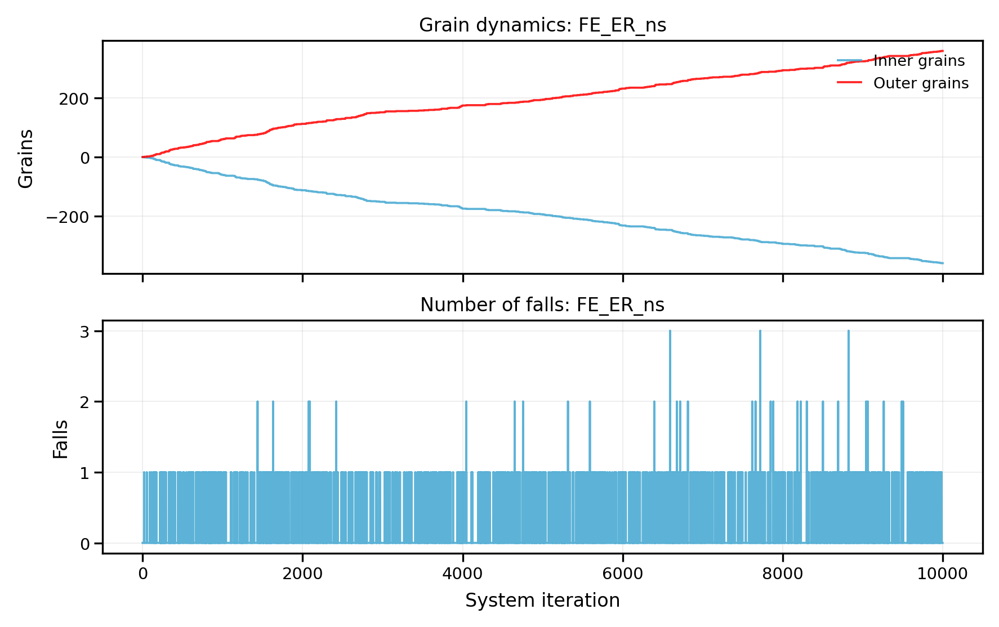

In [100]:
spread("FE", G_ER, number_of_days, new_grains, "ER", neutral_state = True, new_grains_minus = new_grains_minus)

100%|██████████| 9999/9999 [00:23<00:00, 422.84it/s]


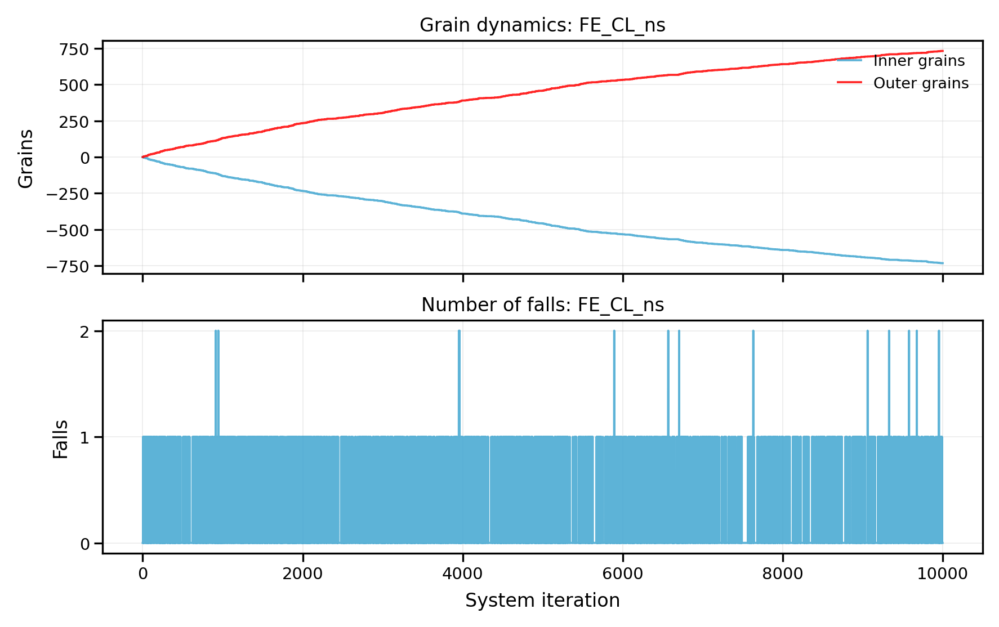

In [101]:
spread("FE", G_CL, number_of_days, new_grains, "CL", neutral_state = True, new_grains_minus = new_grains_minus)

##### Additional Pumping

100%|██████████| 9999/9999 [00:23<00:00, 425.01it/s]


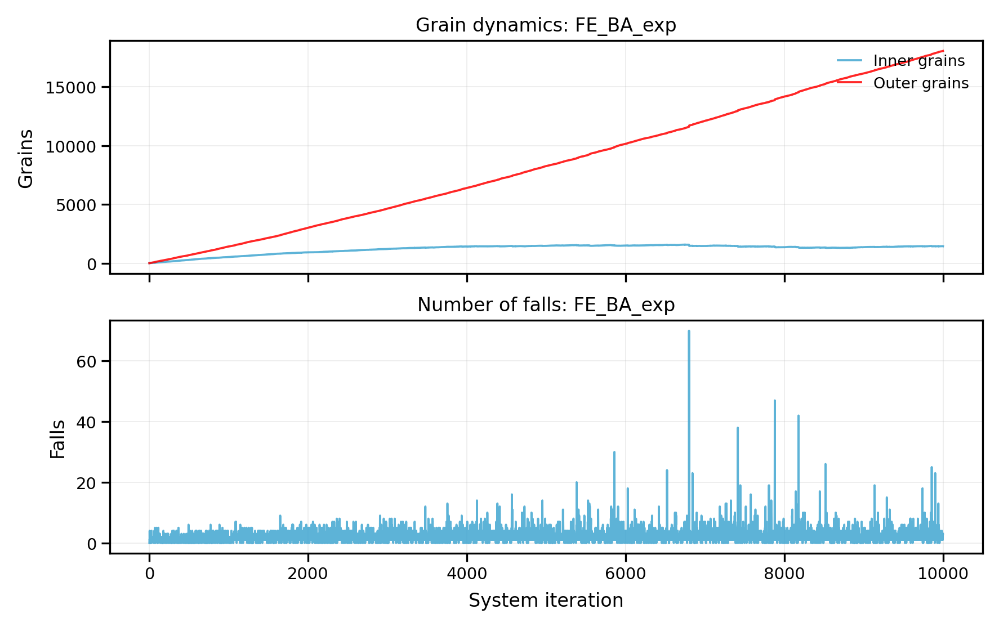

In [102]:
spread("FE", G_BA, number_of_days, new_grains_exp, "BA", expon = True)

100%|██████████| 9999/9999 [00:46<00:00, 216.58it/s]


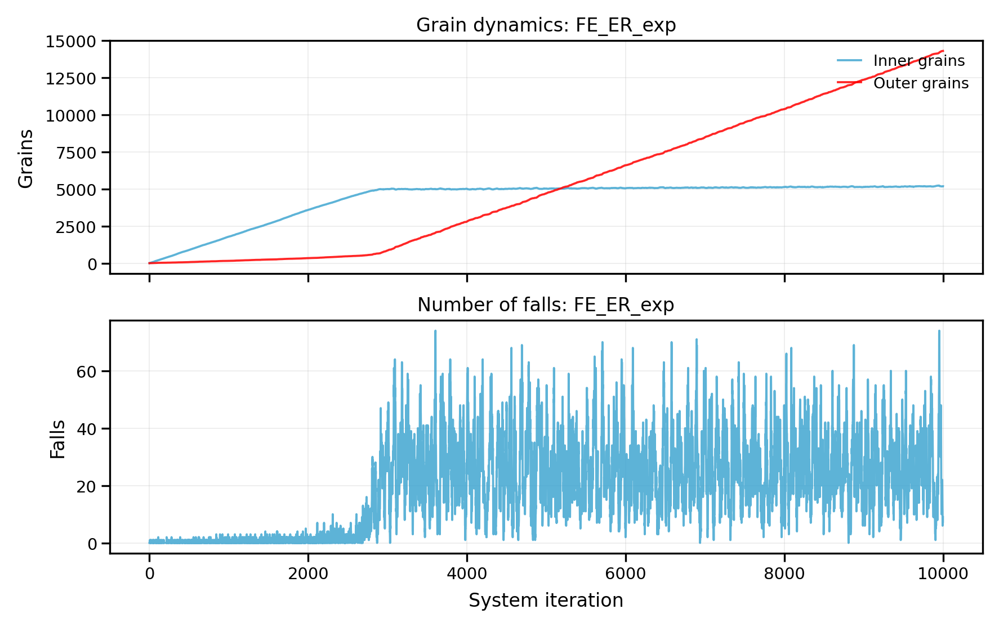

In [103]:
spread("FE", G_ER, number_of_days, new_grains_exp, "ER", expon = True)

100%|██████████| 9999/9999 [00:31<00:00, 317.88it/s]


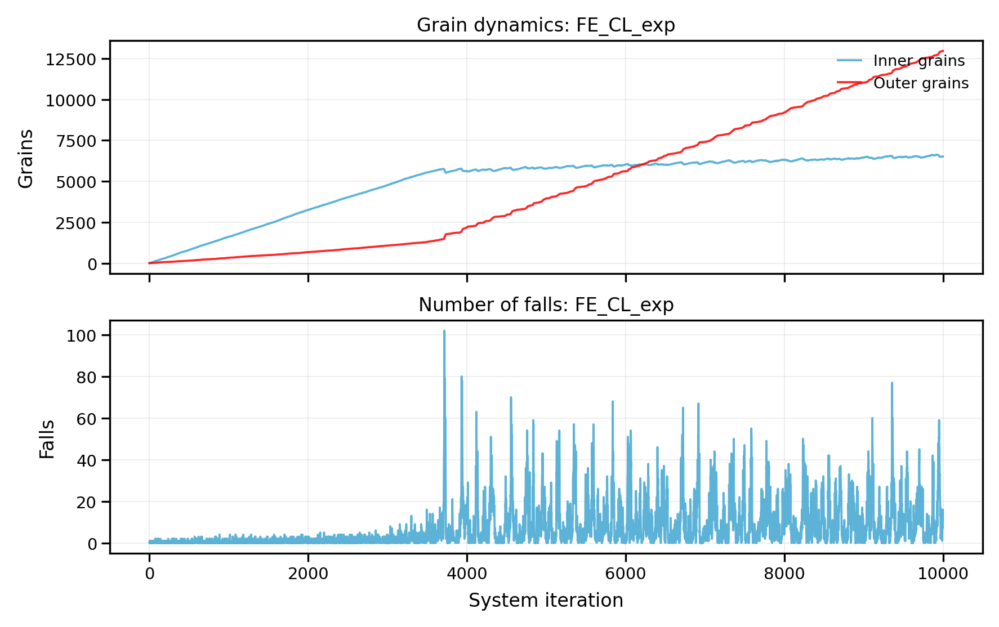

In [104]:
spread("FE", G_CL, number_of_days, new_grains_exp, "CL", expon = True)

100%|██████████| 9999/9999 [00:23<00:00, 423.60it/s]


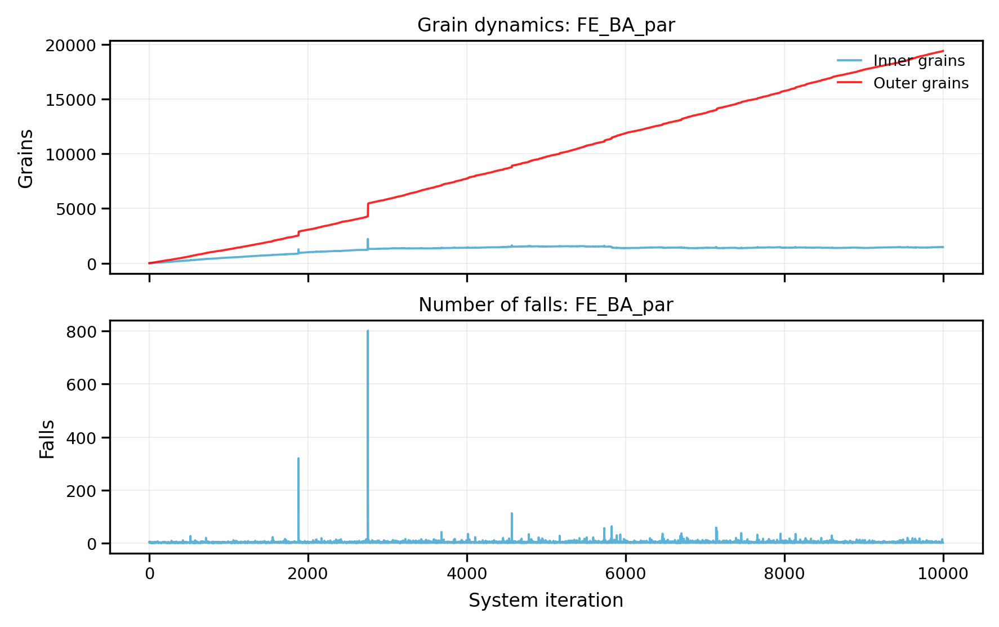

In [105]:
spread("FE", G_BA, number_of_days, new_grains_par, "BA", par = True)

100%|██████████| 9999/9999 [00:46<00:00, 212.92it/s]


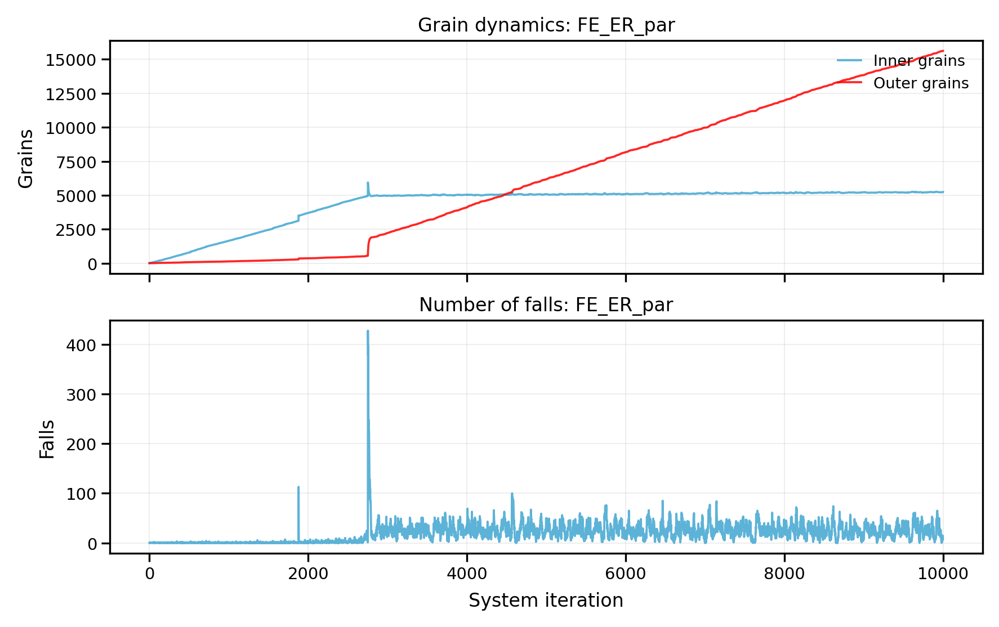

In [106]:
spread("FE", G_ER, number_of_days, new_grains_par, "ER", par = True)

100%|██████████| 9999/9999 [00:33<00:00, 300.53it/s]


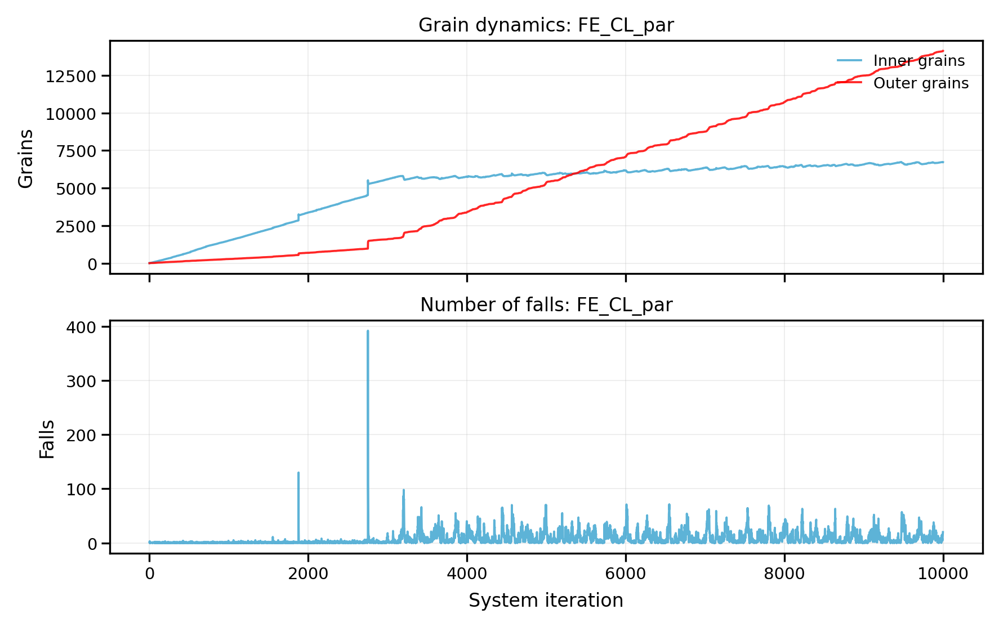

In [107]:
spread("FE", G_CL, number_of_days, new_grains_par, "CL", par = True)

#### Facilitated Model

##### Standart Dissipation

100%|██████████| 9999/9999 [00:23<00:00, 431.67it/s]


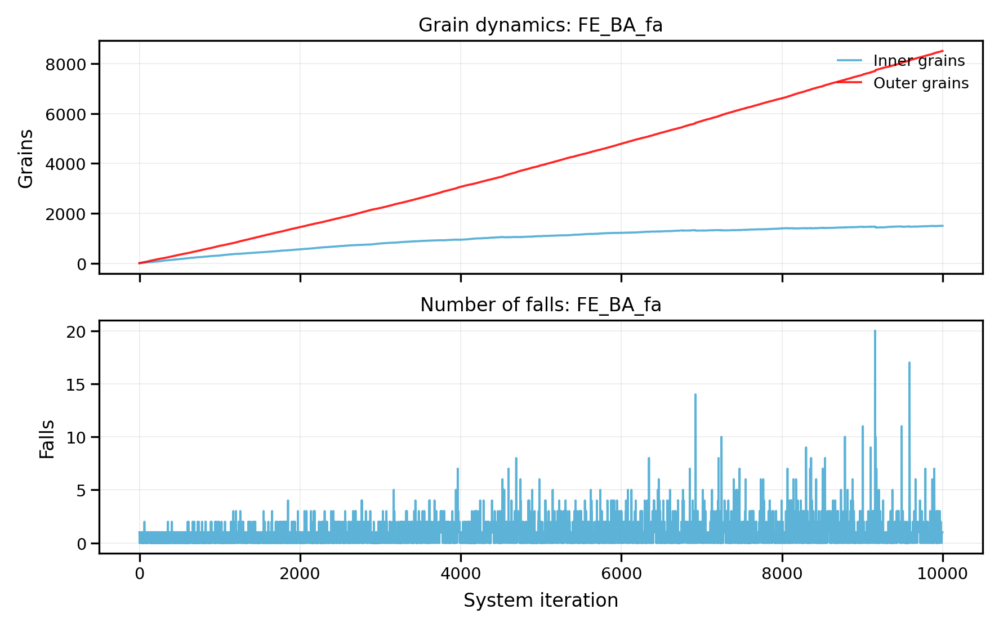

In [108]:
spread("FE", G_BA, number_of_days, new_grains, "BA", facilitated = True)

100%|██████████| 9999/9999 [00:28<00:00, 355.47it/s]


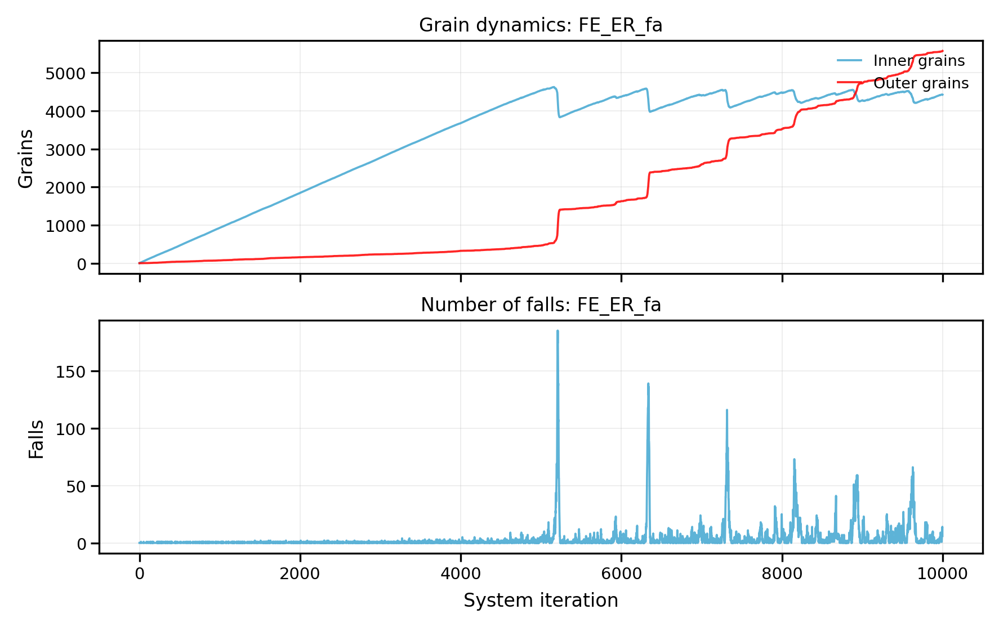

In [109]:
spread("FE", G_ER, number_of_days, new_grains, "ER", facilitated = True)

100%|██████████| 9999/9999 [00:25<00:00, 385.38it/s]


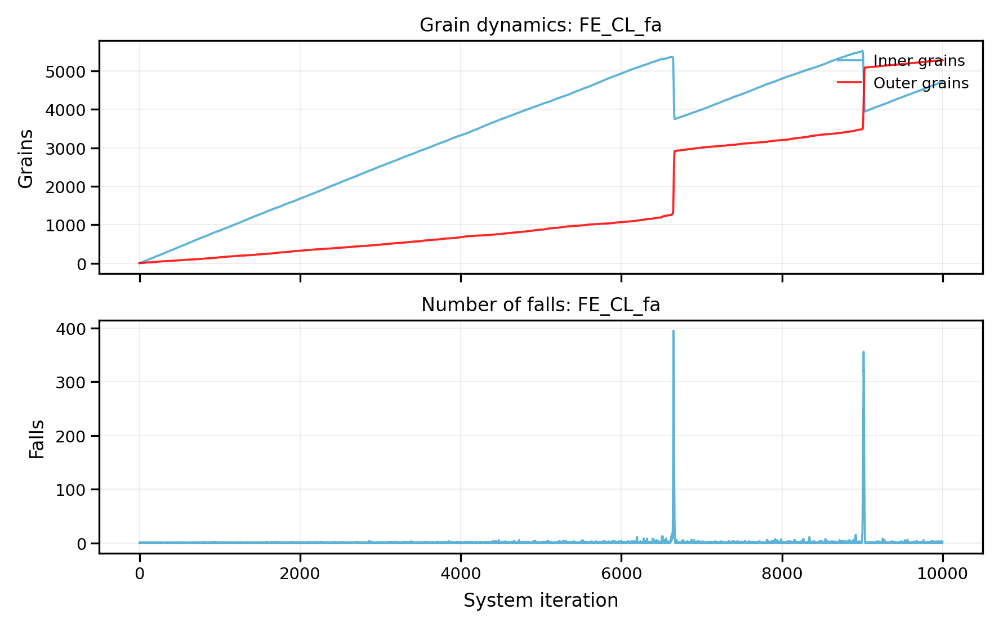

In [110]:
spread("FE", G_CL, number_of_days, new_grains, "CL", facilitated = True)

##### Additional Dissipation

100%|██████████| 9999/9999 [00:25<00:00, 393.00it/s]


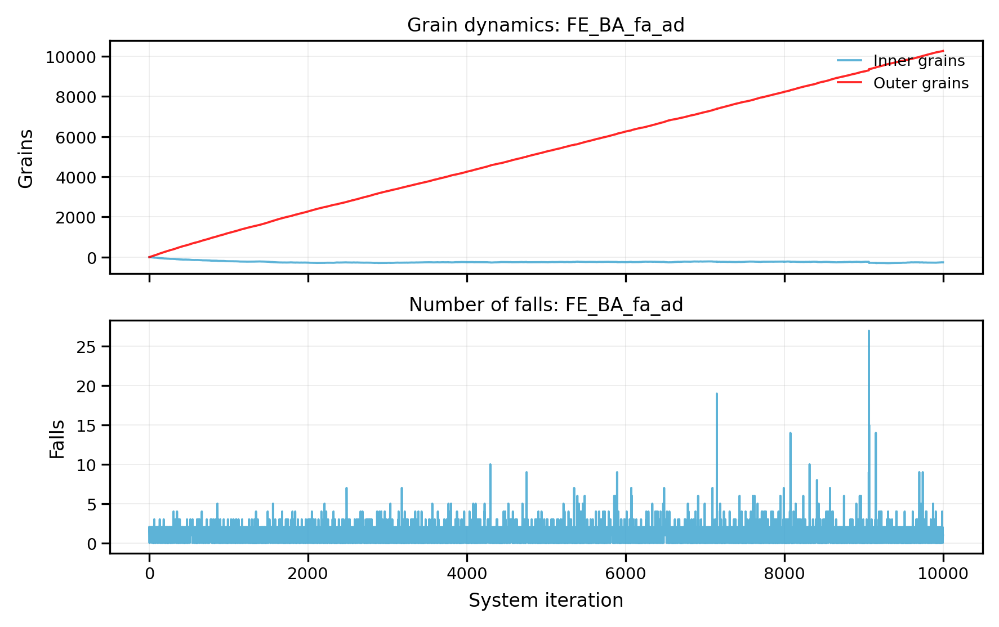

In [111]:
spread("FE", G_BA, number_of_days, new_grains, "BA", facilitated = True, ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

100%|██████████| 9999/9999 [00:30<00:00, 330.13it/s]


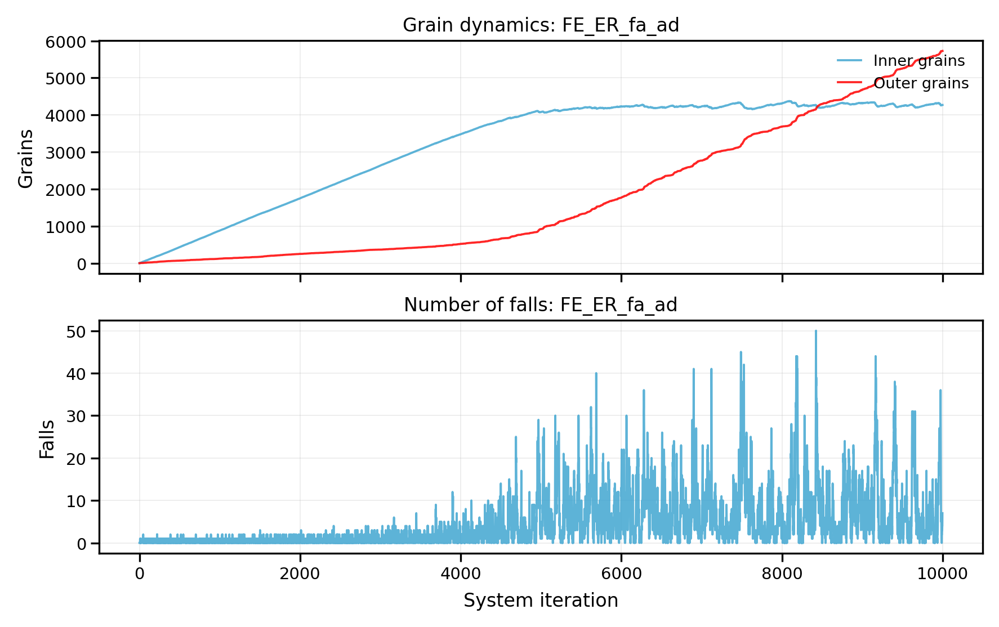

In [112]:
spread("FE", G_ER, number_of_days, new_grains, "ER", facilitated = True, ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

100%|██████████| 9999/9999 [00:27<00:00, 359.43it/s]


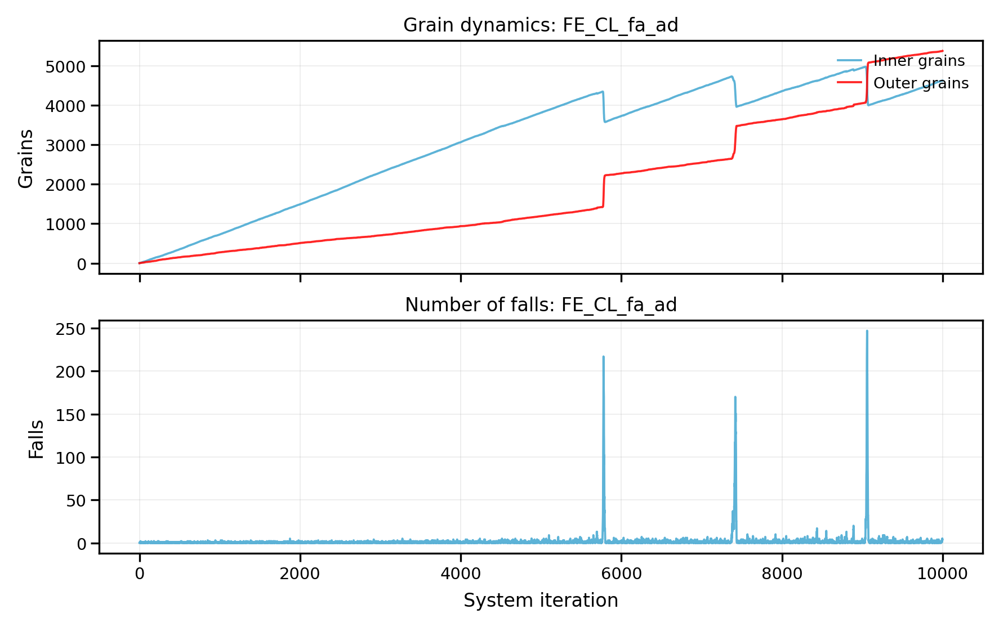

In [113]:
spread("FE", G_CL, number_of_days, new_grains, "CL", facilitated = True, ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

##### Neutral State

100%|██████████| 9999/9999 [00:23<00:00, 421.75it/s]


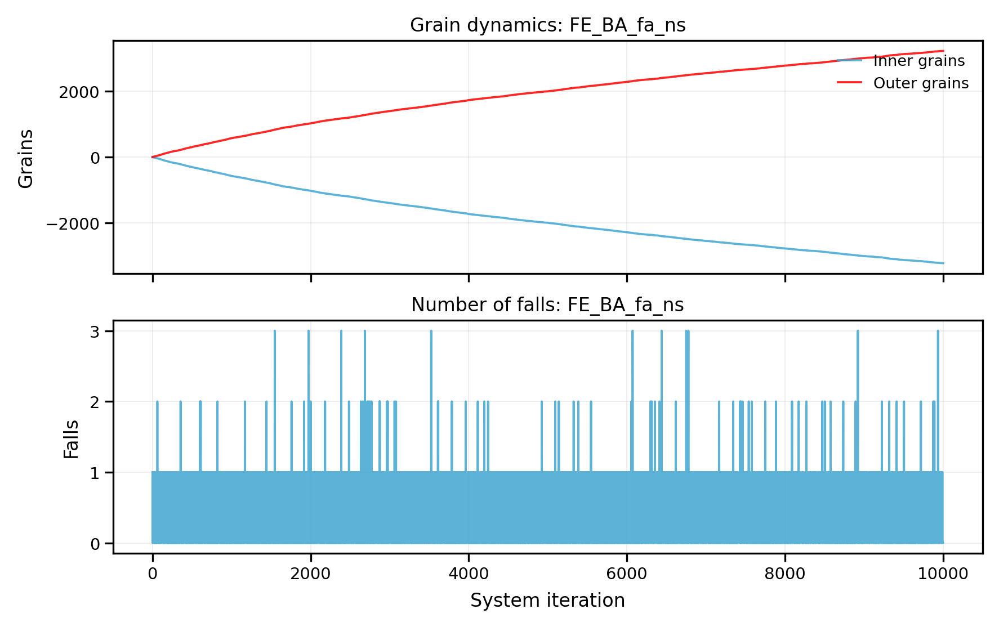

In [114]:
spread("FE", G_BA, number_of_days, new_grains, "BA", facilitated = True, neutral_state = True, new_grains_minus = new_grains_minus)

100%|██████████| 9999/9999 [00:24<00:00, 409.38it/s]


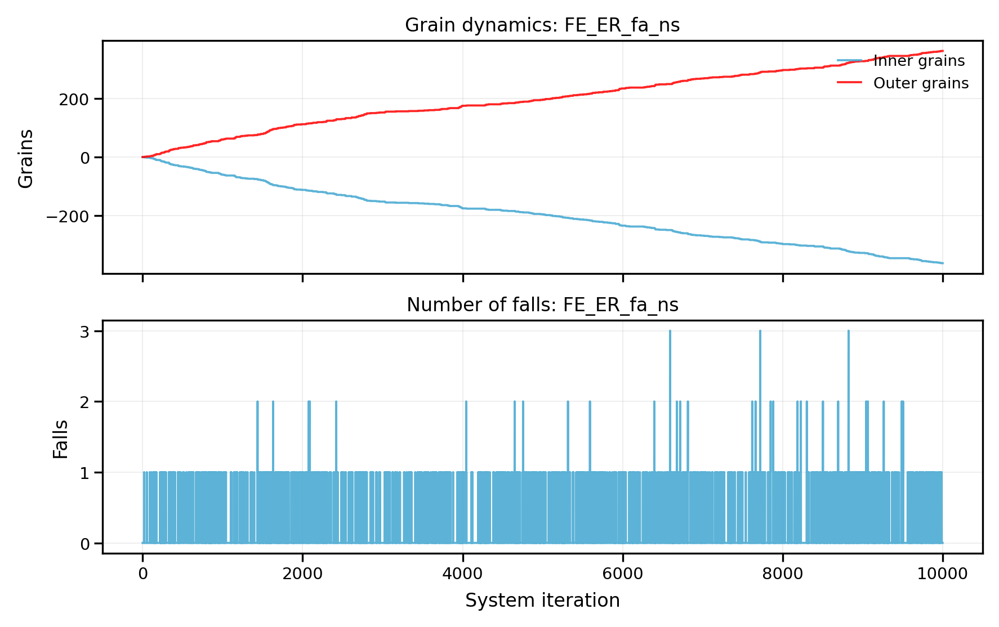

In [115]:
spread("FE", G_ER, number_of_days, new_grains, "ER", facilitated = True, neutral_state = True, new_grains_minus = new_grains_minus)

100%|██████████| 9999/9999 [00:24<00:00, 413.03it/s]


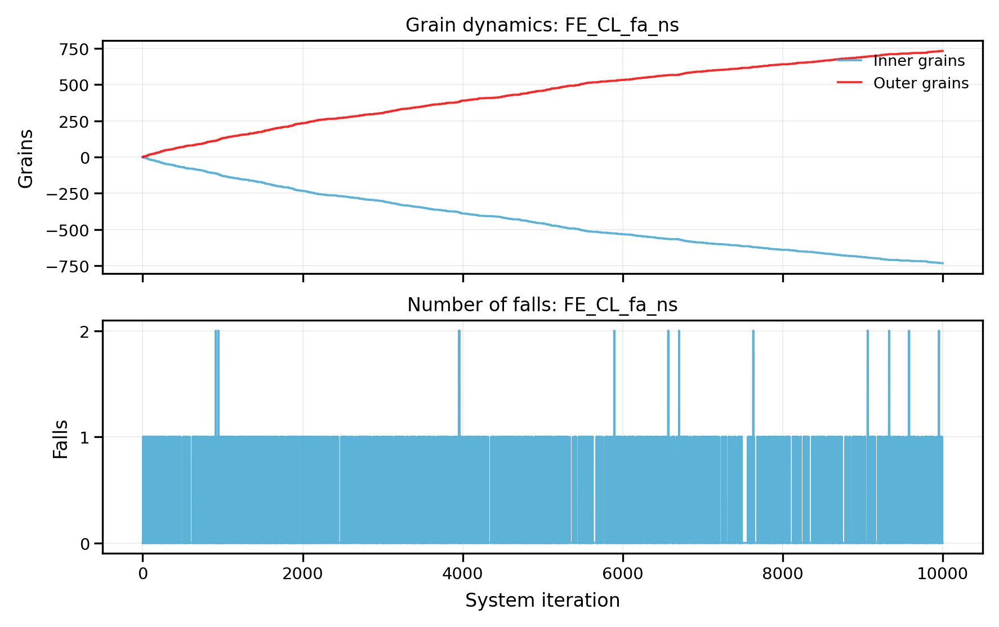

In [116]:
spread("FE", G_CL, number_of_days, new_grains, "CL", facilitated = True, neutral_state = True, new_grains_minus = new_grains_minus)

##### Additional Pumping

100%|██████████| 9999/9999 [00:24<00:00, 414.14it/s]


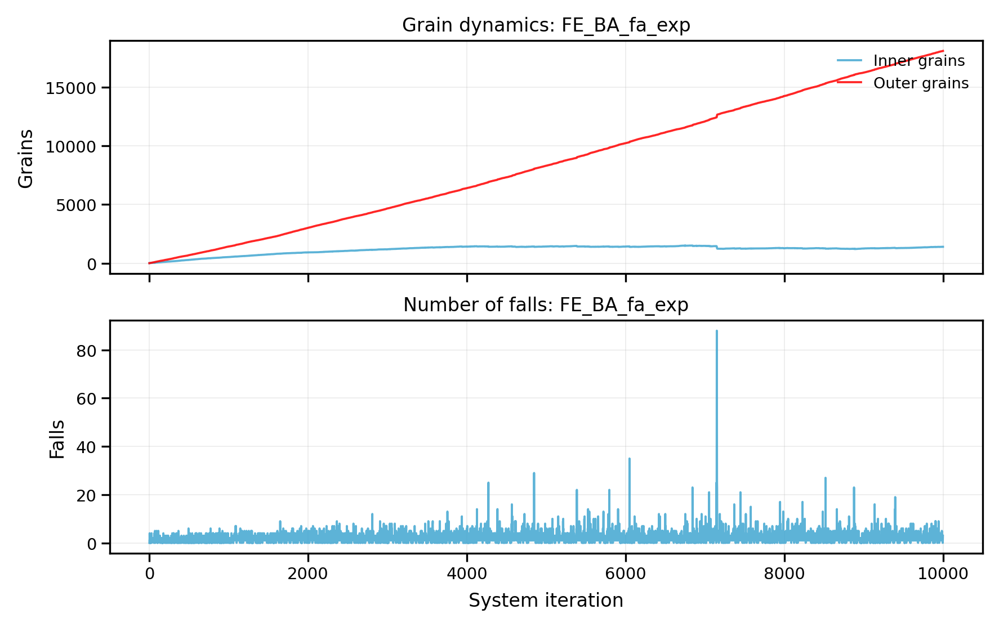

In [117]:
spread("FE", G_BA, number_of_days, new_grains_exp, "BA", facilitated = True, expon = True)

100%|██████████| 9999/9999 [00:37<00:00, 267.02it/s]


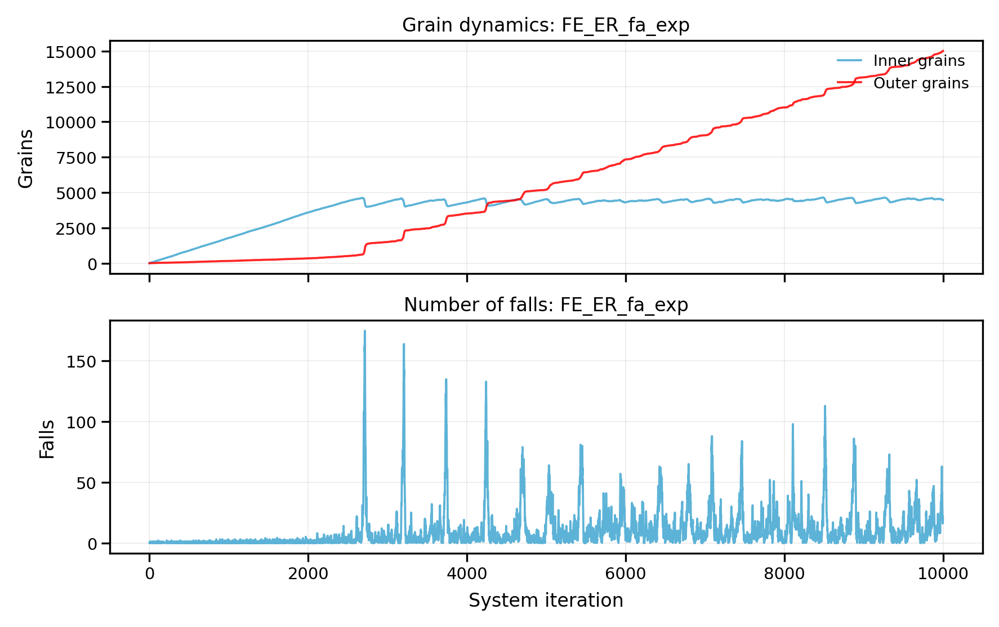

In [118]:
spread("FE", G_ER, number_of_days, new_grains_exp, "ER", facilitated = True, expon = True)

100%|██████████| 9999/9999 [00:30<00:00, 327.87it/s]


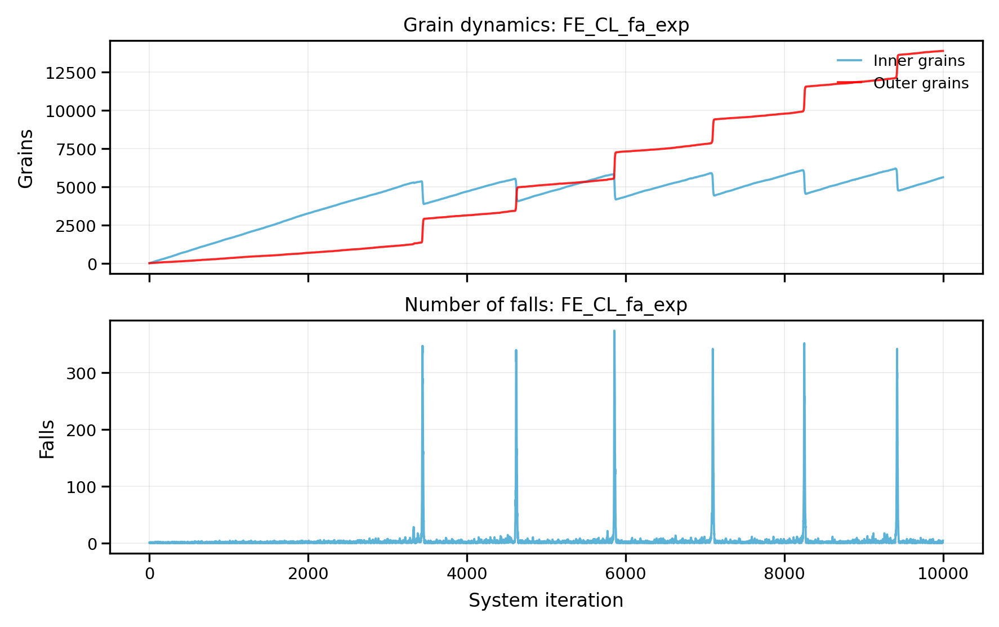

In [119]:
spread("FE", G_CL, number_of_days, new_grains_exp, "CL", facilitated = True, expon = True)

100%|██████████| 9999/9999 [00:24<00:00, 415.02it/s]


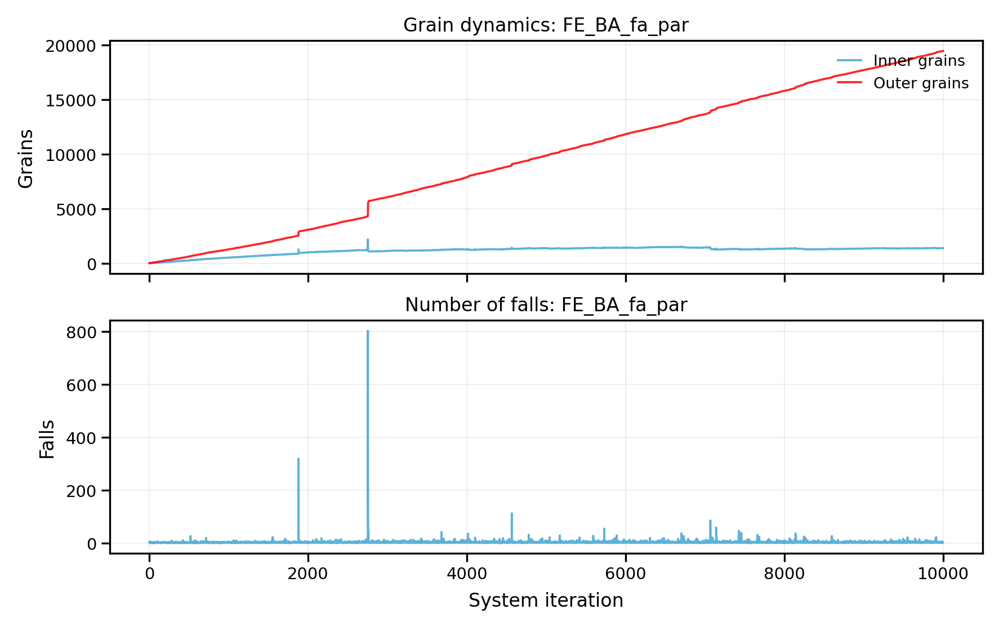

In [120]:
spread("FE", G_BA, number_of_days, new_grains_par, "BA", facilitated = True, par = True)

100%|██████████| 9999/9999 [00:37<00:00, 269.47it/s]


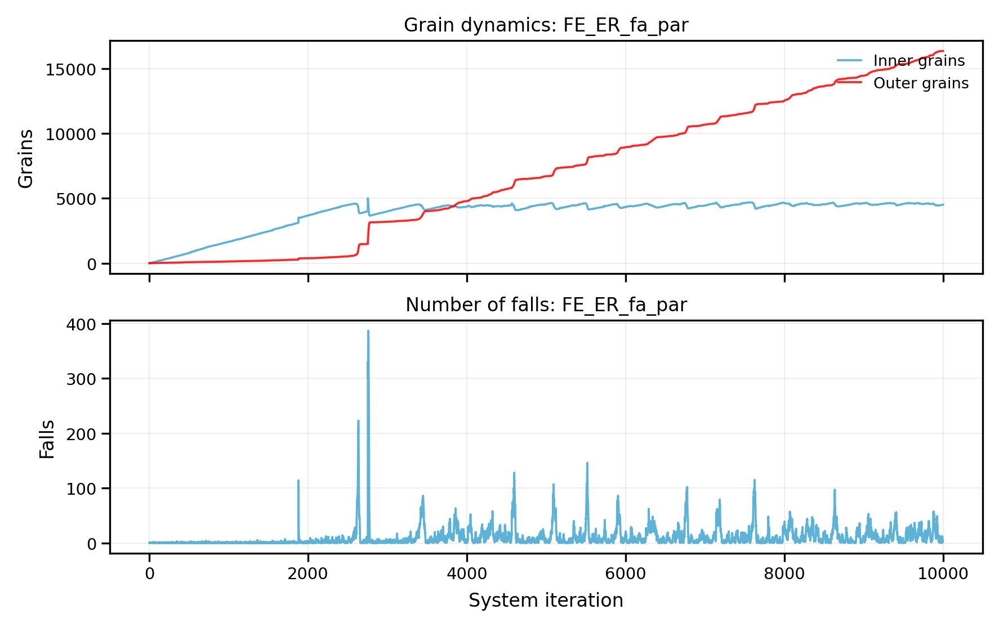

In [121]:
spread("FE", G_ER, number_of_days, new_grains_par, "ER", facilitated = True, par = True)

100%|██████████| 9999/9999 [00:30<00:00, 328.48it/s]


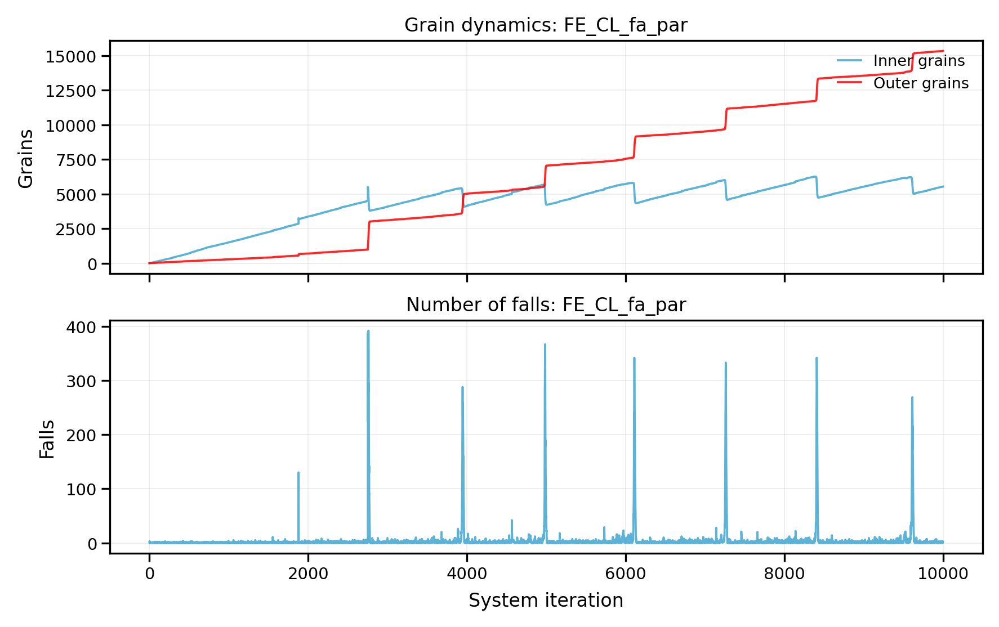

In [122]:
spread("FE", G_CL, number_of_days, new_grains_par, "CL", facilitated = True, par = True)

### Stochastic Feder

#### Standart Model

##### Standart Dissipation

100%|██████████| 9999/9999 [00:23<00:00, 420.25it/s]


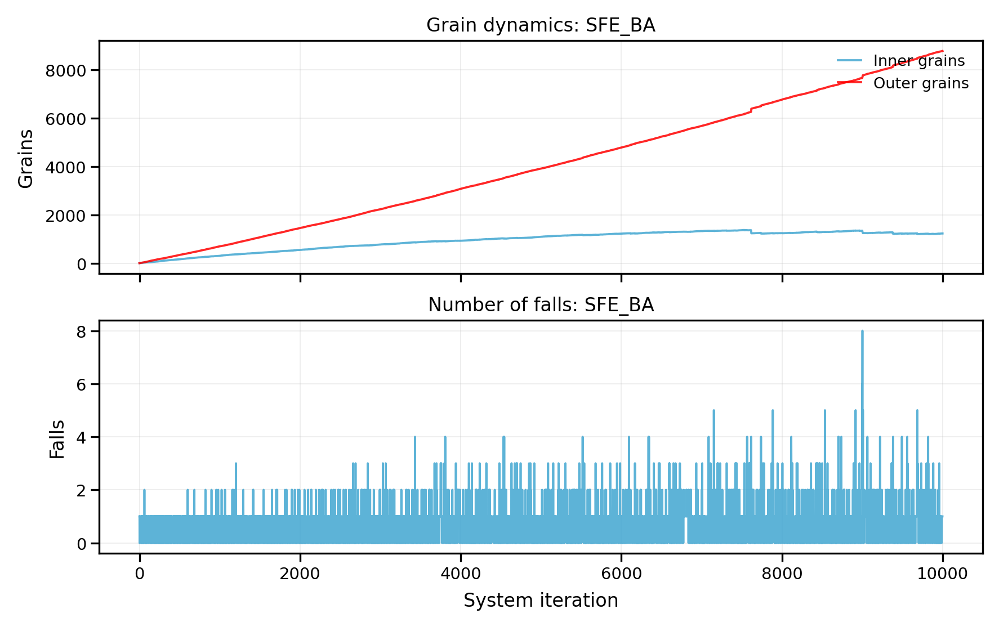

In [123]:
spread("SFE", G_BA, number_of_days, new_grains, "BA")

100%|██████████| 9999/9999 [00:23<00:00, 432.62it/s]


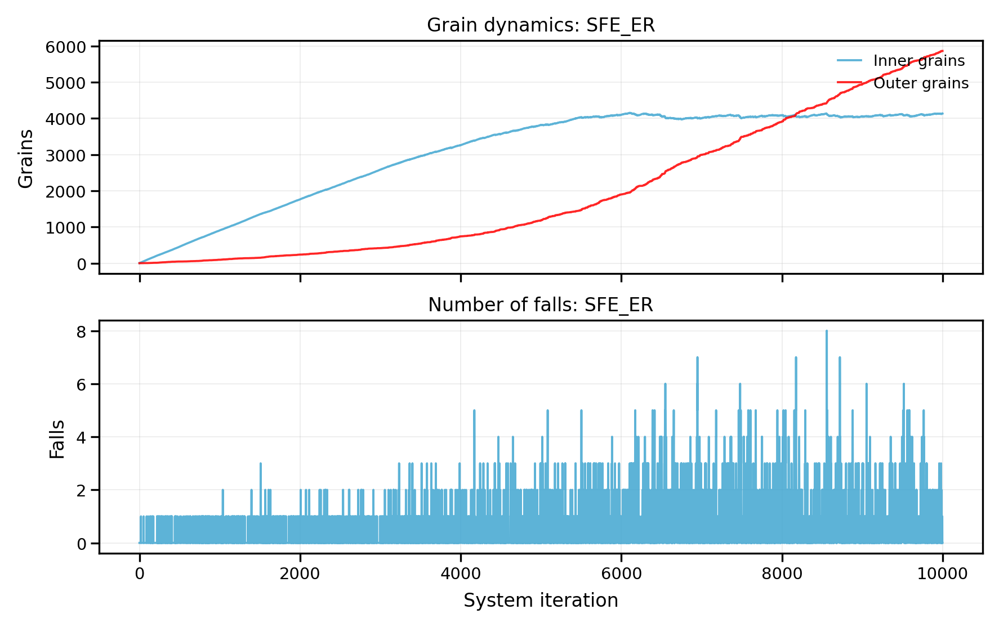

In [124]:
spread("SFE", G_ER, number_of_days, new_grains, "ER")

100%|██████████| 9999/9999 [00:23<00:00, 418.03it/s]


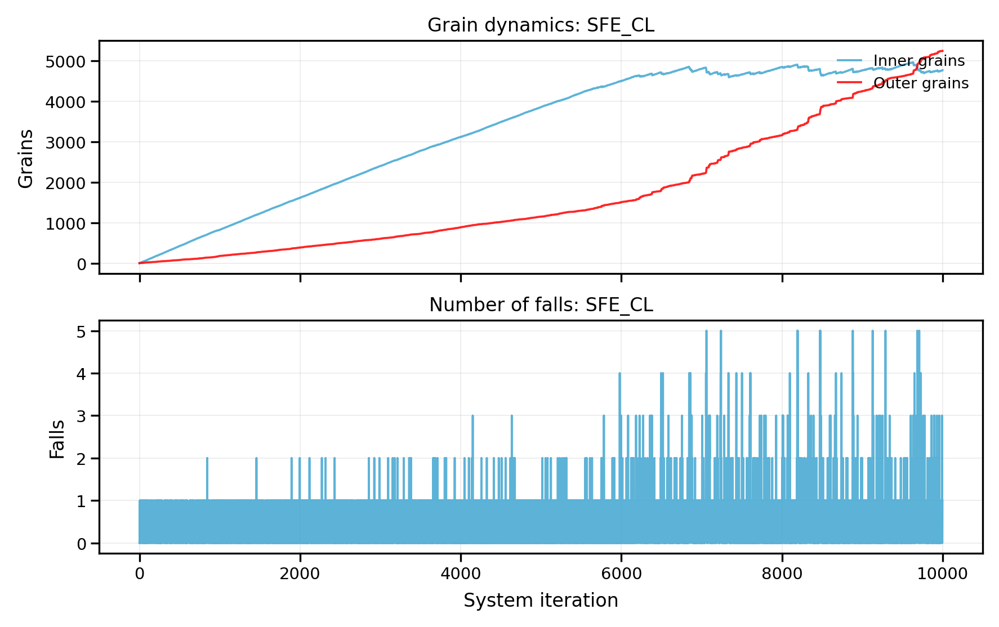

In [125]:
spread("SFE", G_CL, number_of_days, new_grains, "CL")

##### Additional Dissipation

100%|██████████| 9999/9999 [00:25<00:00, 393.86it/s]


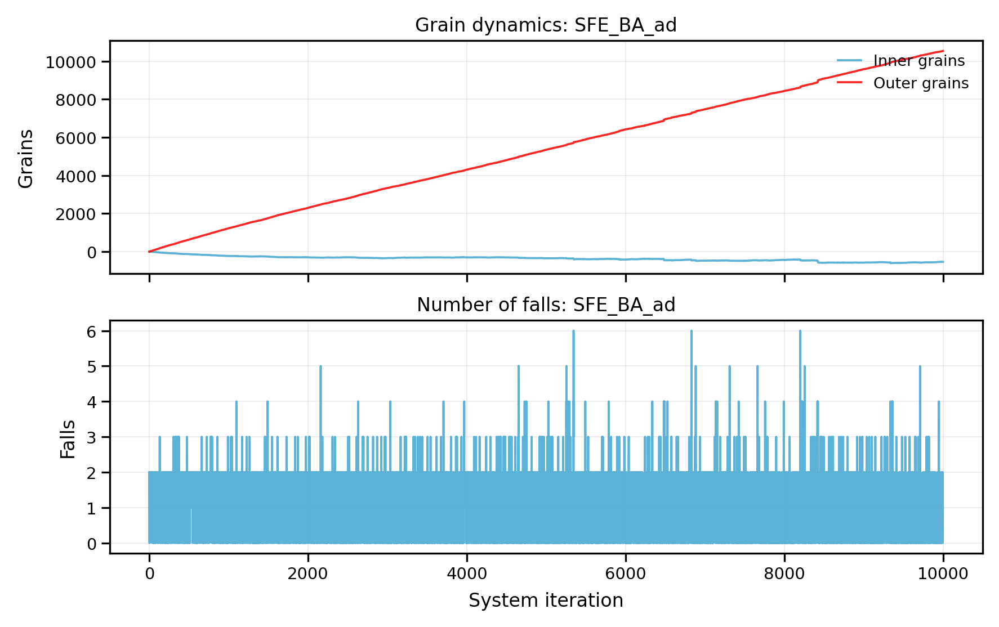

In [126]:
spread("SFE", G_BA, number_of_days, new_grains, "BA", ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

100%|██████████| 9999/9999 [00:25<00:00, 387.59it/s]


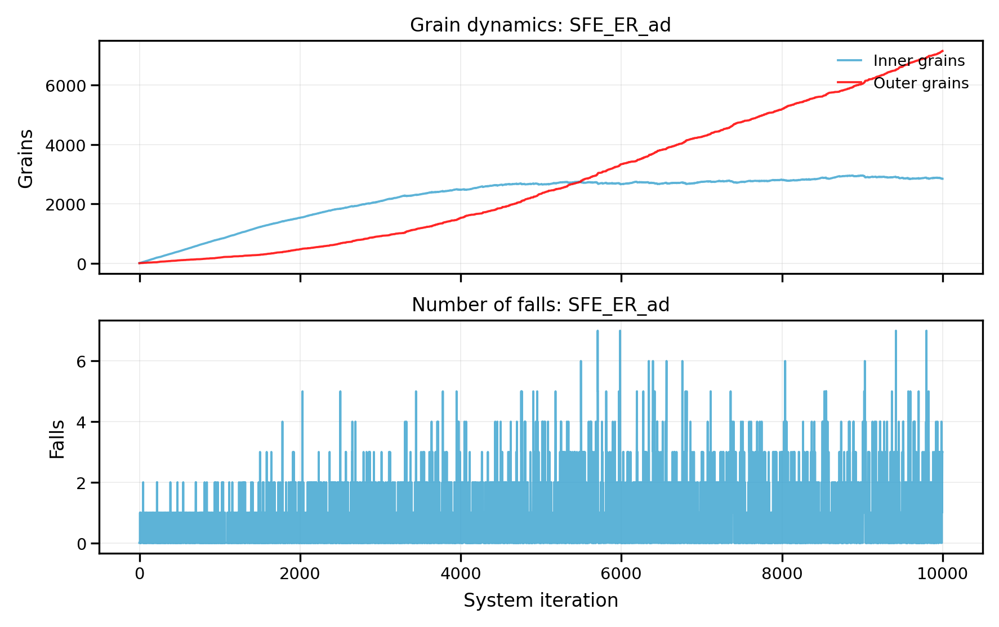

In [127]:
spread("SFE", G_ER, number_of_days, new_grains, "ER", ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

100%|██████████| 9999/9999 [00:24<00:00, 402.01it/s]


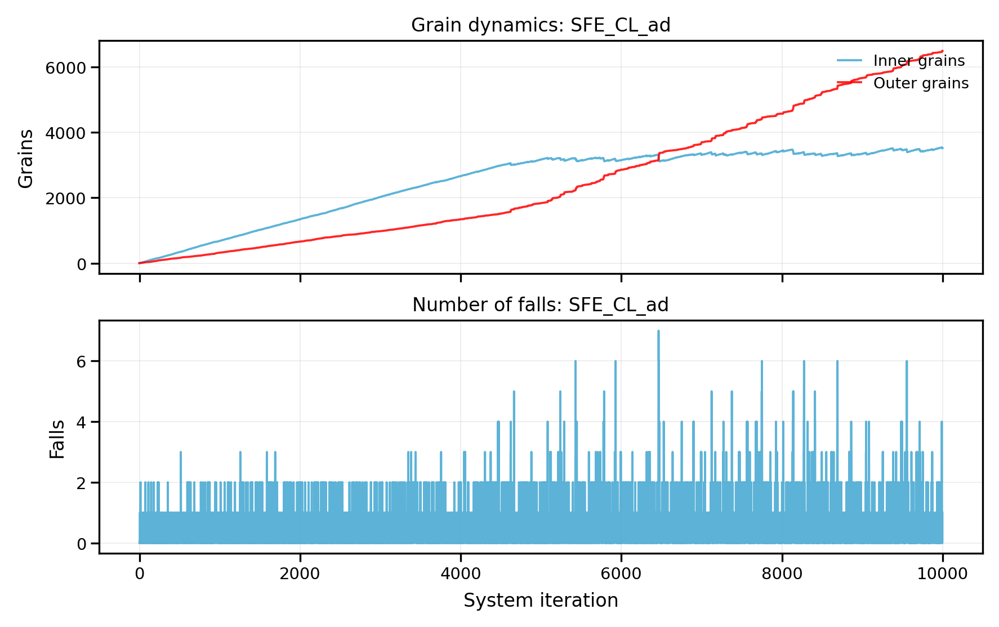

In [128]:
spread("SFE", G_CL, number_of_days, new_grains, "CL", ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

##### Neutral State

100%|██████████| 9999/9999 [00:23<00:00, 421.59it/s]


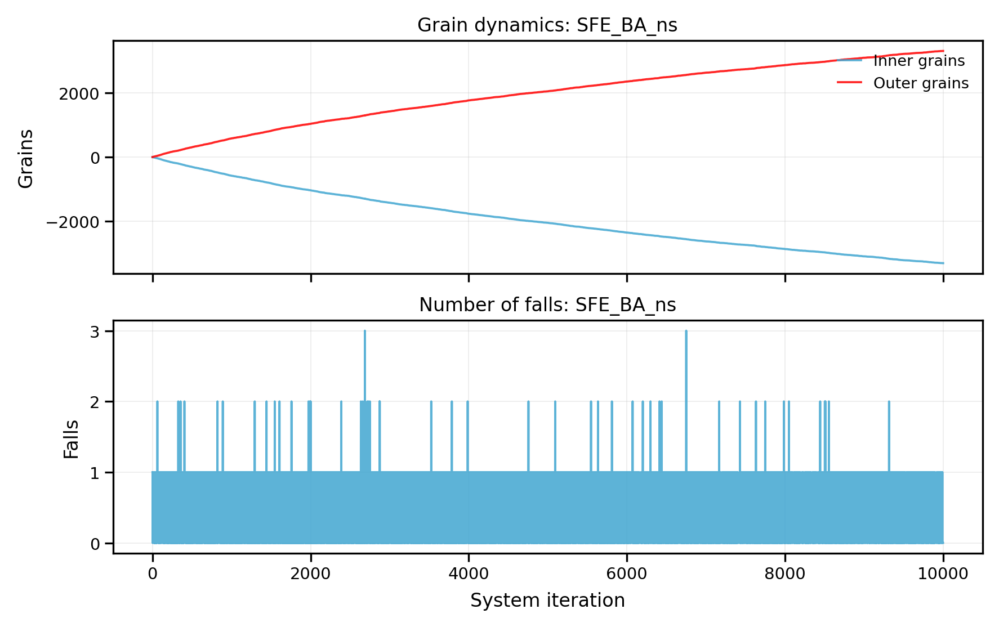

In [129]:
spread("SFE", G_BA, number_of_days, new_grains, "BA", neutral_state = True, new_grains_minus = new_grains_minus)

100%|██████████| 9999/9999 [00:23<00:00, 433.23it/s]


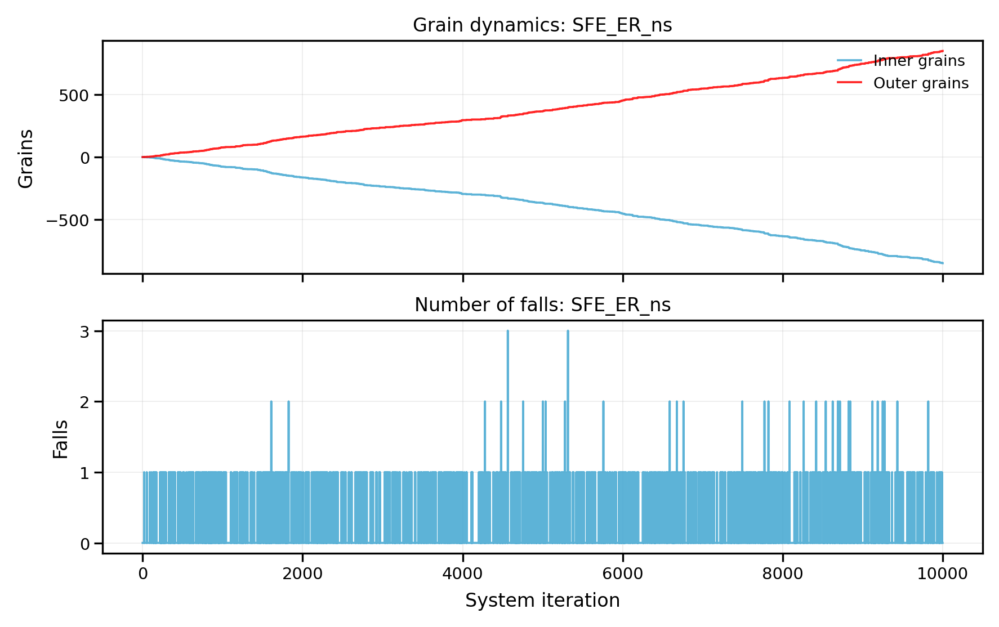

In [130]:
spread("SFE", G_ER, number_of_days, new_grains, "ER", neutral_state = True, new_grains_minus = new_grains_minus)

100%|██████████| 9999/9999 [00:23<00:00, 420.63it/s]


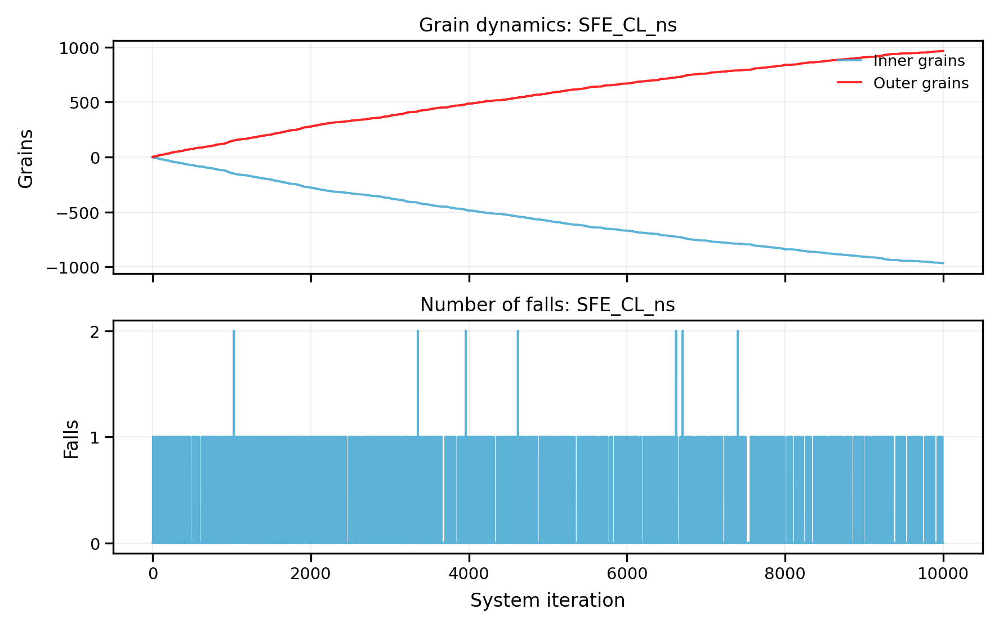

In [131]:
spread("SFE", G_CL, number_of_days, new_grains, "CL", neutral_state = True, new_grains_minus = new_grains_minus)

##### Additional Pumping

100%|██████████| 9999/9999 [00:23<00:00, 429.18it/s]


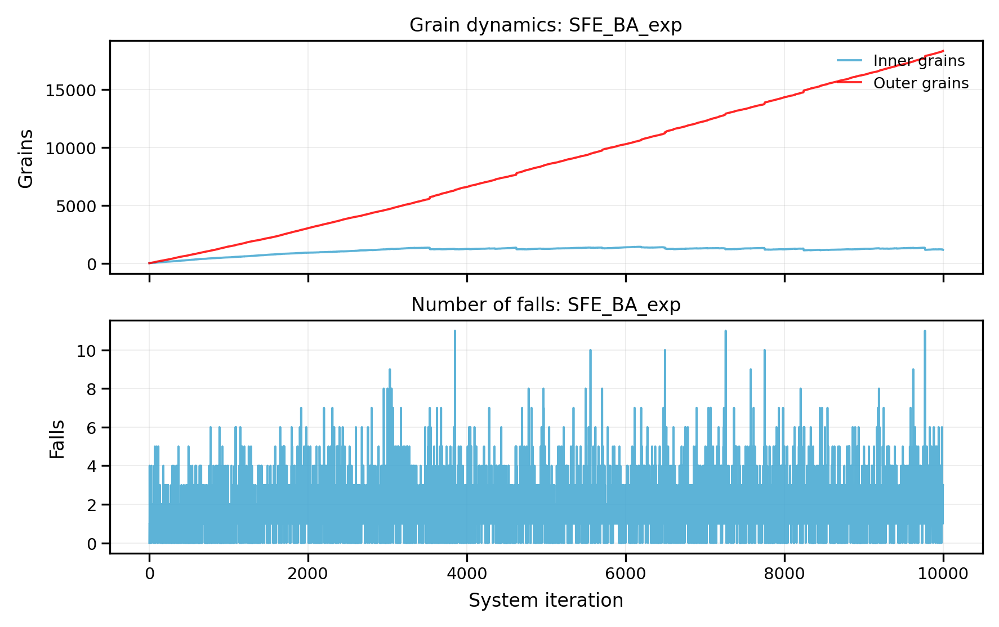

In [132]:
spread("SFE", G_BA, number_of_days, new_grains_exp, "BA", expon = True)

100%|██████████| 9999/9999 [00:24<00:00, 400.13it/s]


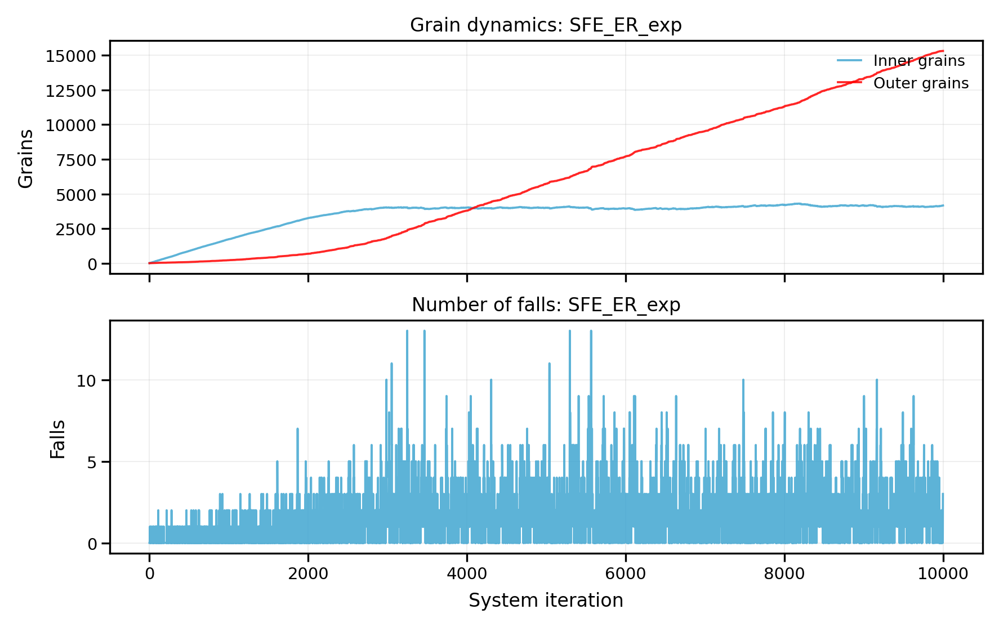

In [133]:
spread("SFE", G_ER, number_of_days, new_grains_exp, "ER", expon = True)

100%|██████████| 9999/9999 [00:24<00:00, 411.60it/s]


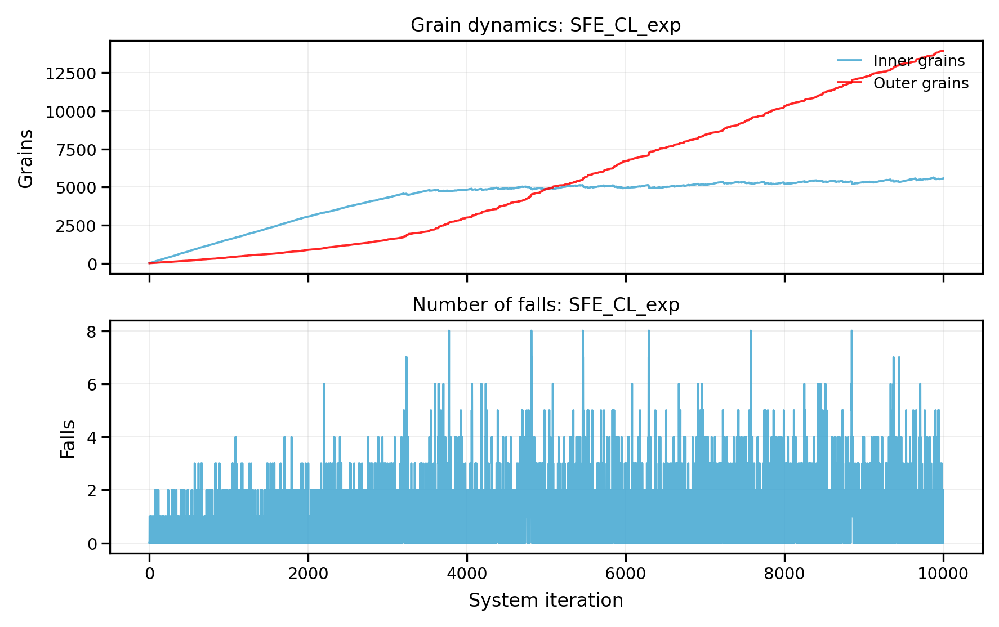

In [134]:
spread("SFE", G_CL, number_of_days, new_grains_exp, "CL", expon = True)

100%|██████████| 9999/9999 [00:23<00:00, 426.61it/s]


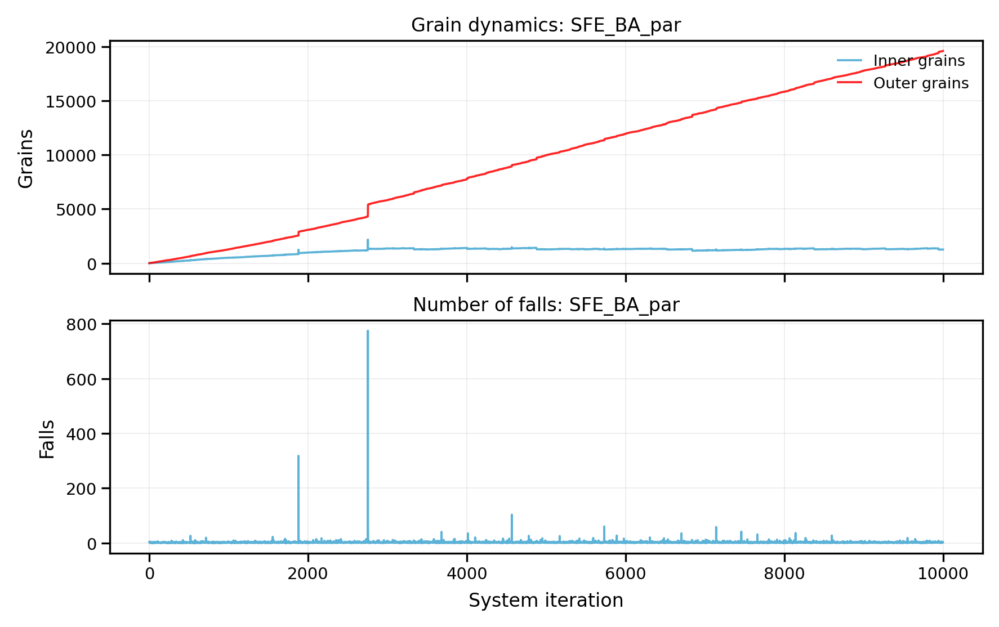

In [135]:
spread("SFE", G_BA, number_of_days, new_grains_par, "BA", par = True)

100%|██████████| 9999/9999 [00:24<00:00, 402.72it/s]


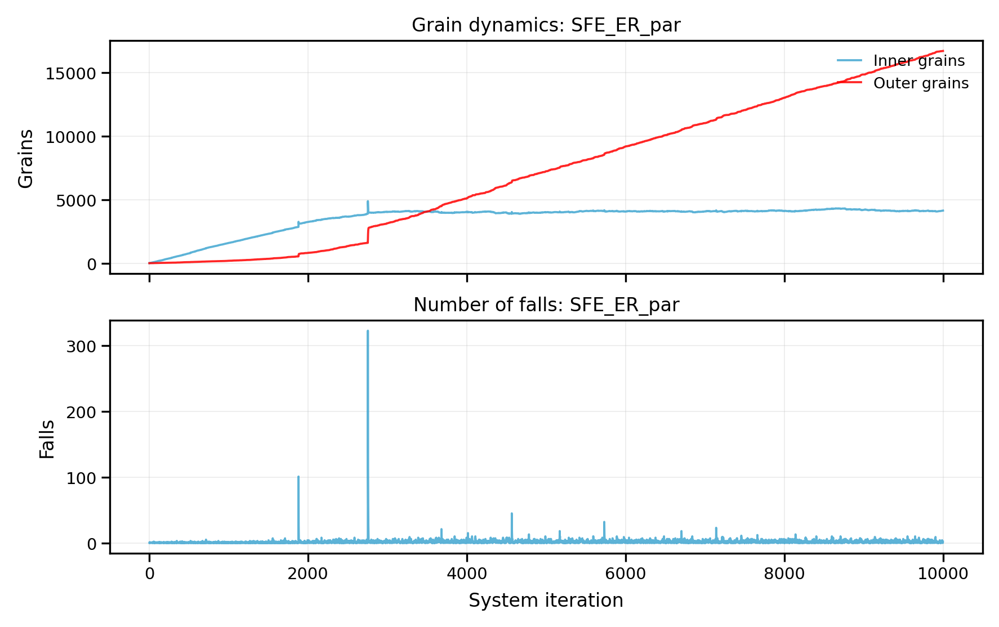

In [136]:
spread("SFE", G_ER, number_of_days, new_grains_par, "ER", par = True)

100%|██████████| 9999/9999 [00:24<00:00, 409.16it/s]


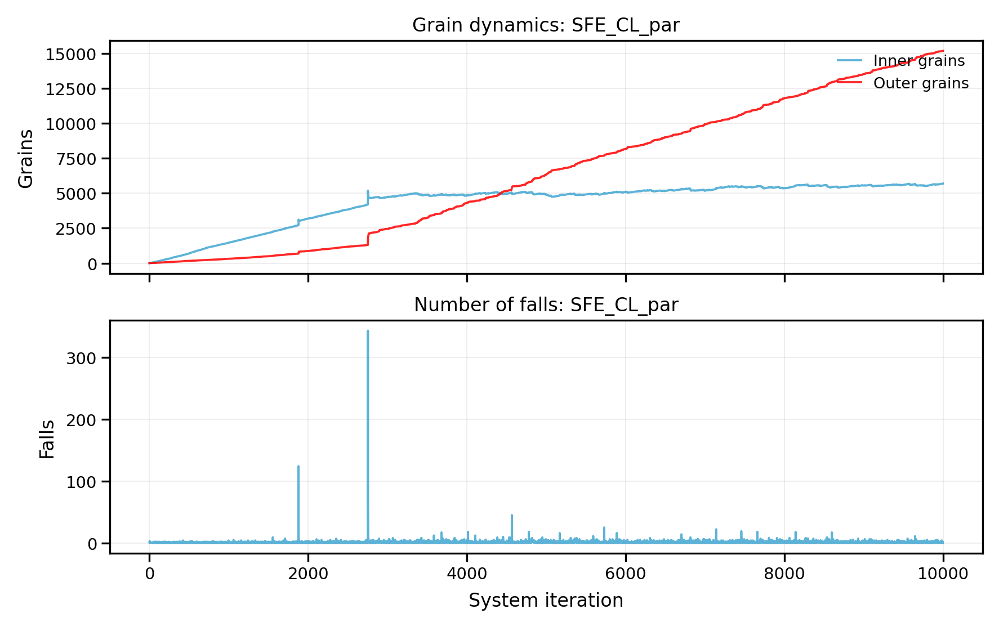

In [137]:
spread("SFE", G_CL, number_of_days, new_grains_par, "CL", par = True)

#### Facilitated Model

##### Standart Dissipation

100%|██████████| 9999/9999 [00:23<00:00, 430.66it/s]


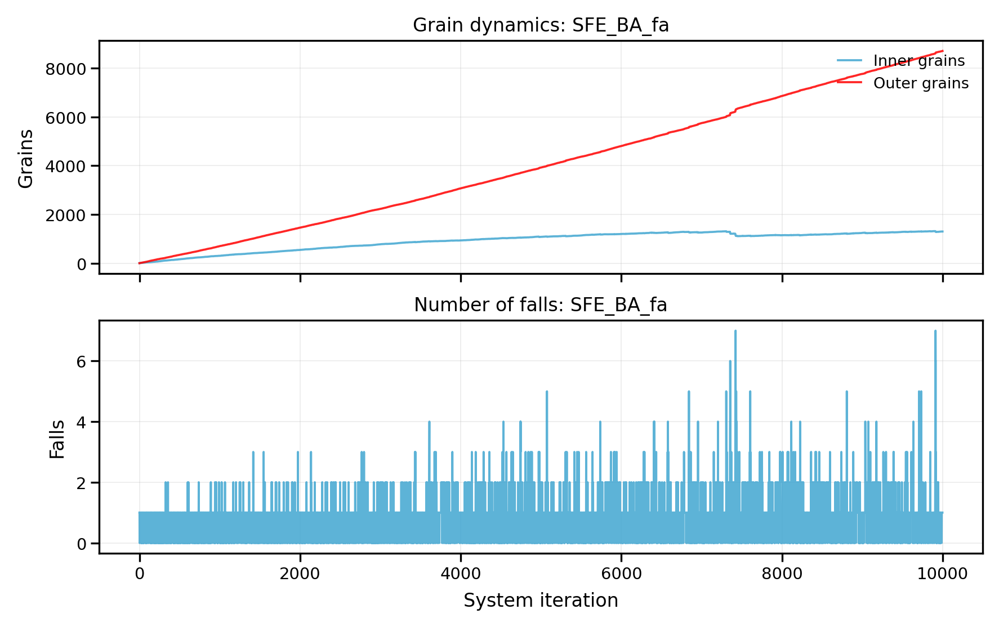

In [138]:
spread("SFE", G_BA, number_of_days, new_grains, "BA", facilitated = True)

100%|██████████| 9999/9999 [00:24<00:00, 415.81it/s]


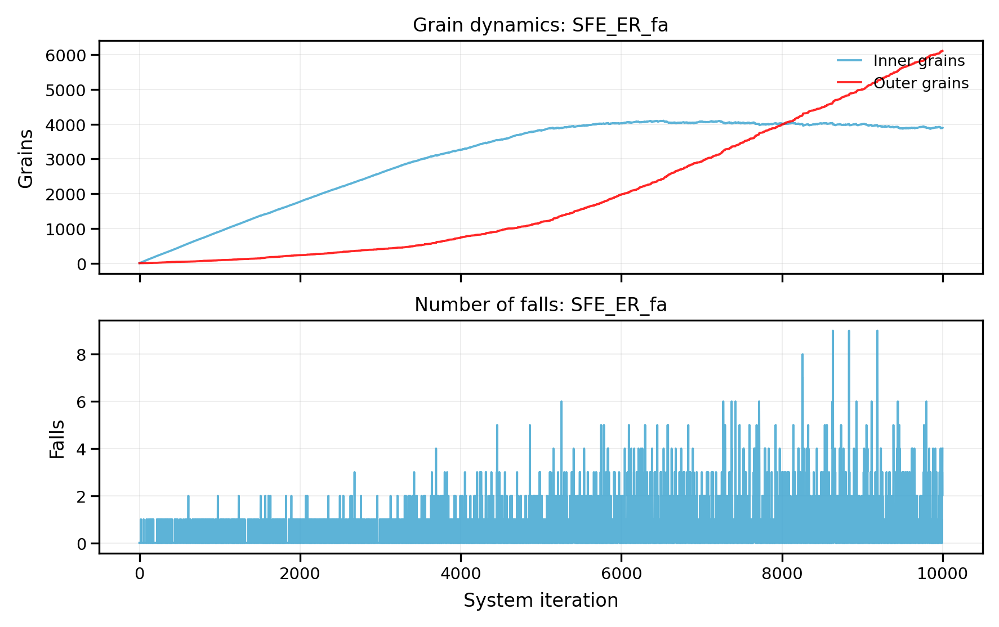

In [139]:
spread("SFE", G_ER, number_of_days, new_grains, "ER", facilitated = True)

100%|██████████| 9999/9999 [00:23<00:00, 428.60it/s]


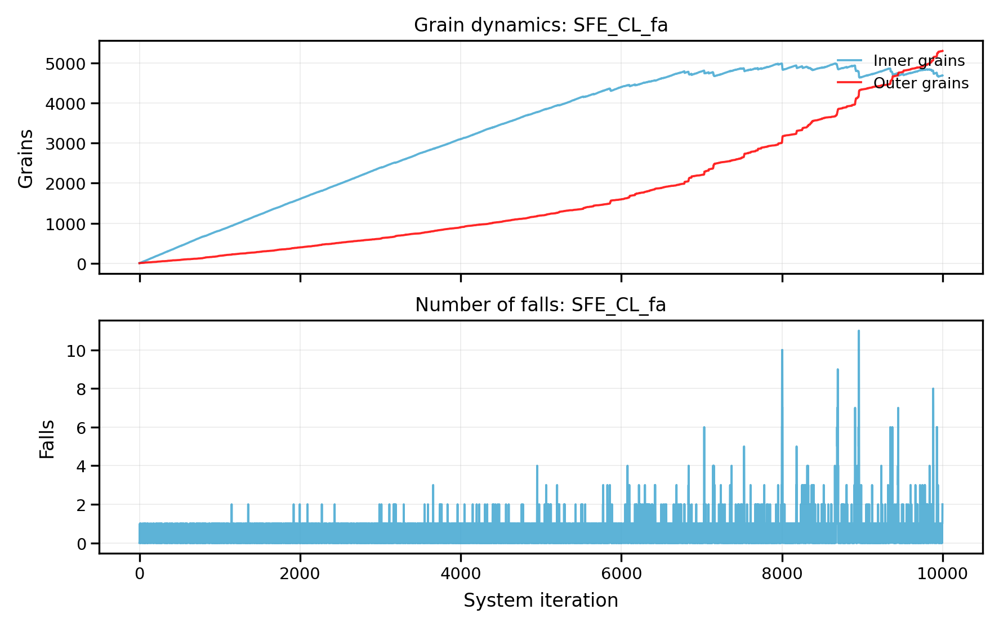

In [140]:
spread("SFE", G_CL, number_of_days, new_grains, "CL", facilitated = True)

##### Additional Dissipation

100%|██████████| 9999/9999 [00:25<00:00, 392.30it/s]


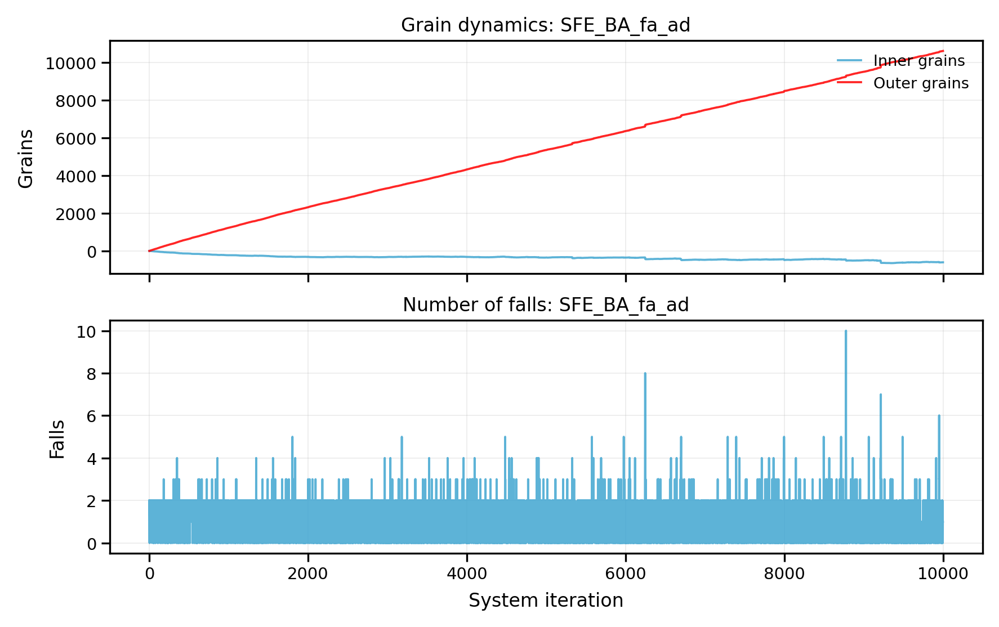

In [141]:
spread("SFE", G_BA, number_of_days, new_grains, "BA", facilitated = True, ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

100%|██████████| 9999/9999 [00:25<00:00, 391.94it/s]


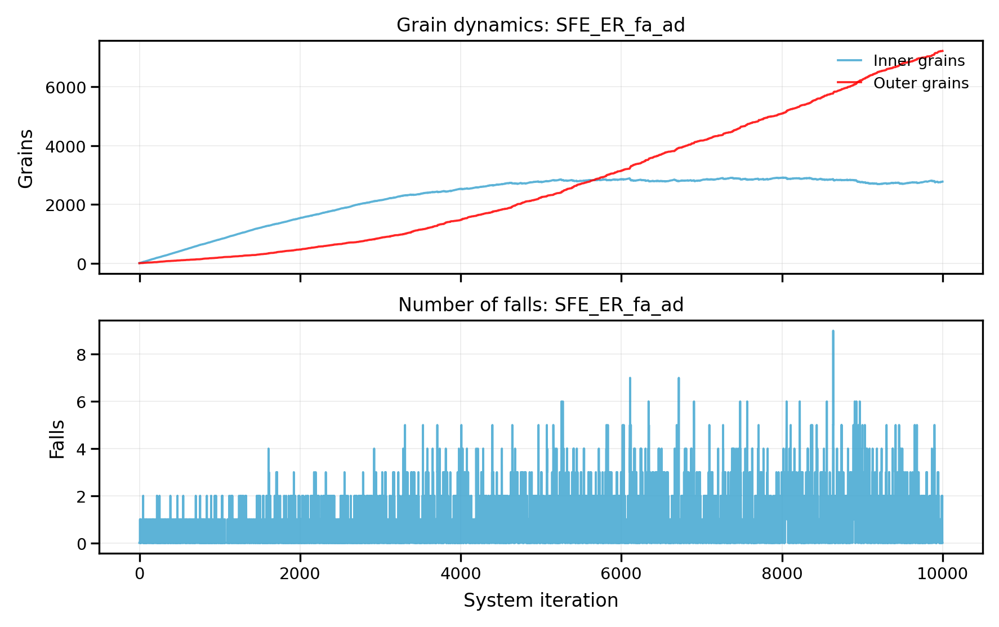

In [142]:
spread("SFE", G_ER, number_of_days, new_grains, "ER", facilitated = True, ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

100%|██████████| 9999/9999 [00:26<00:00, 372.68it/s]


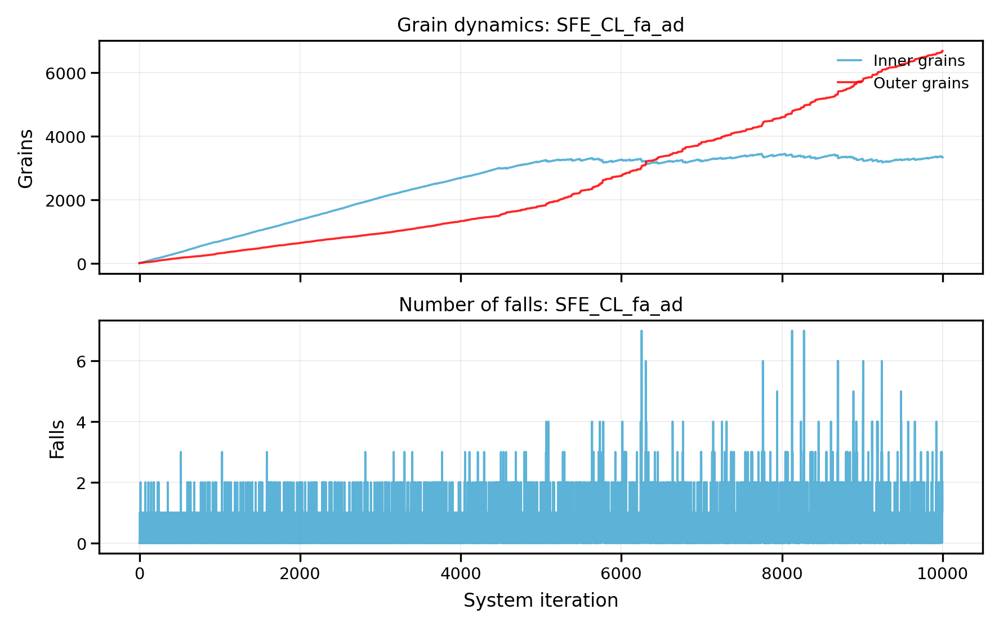

In [143]:
spread("SFE", G_CL, number_of_days, new_grains, "CL", facilitated = True, ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

##### Neutral State

100%|██████████| 9999/9999 [00:23<00:00, 419.22it/s]


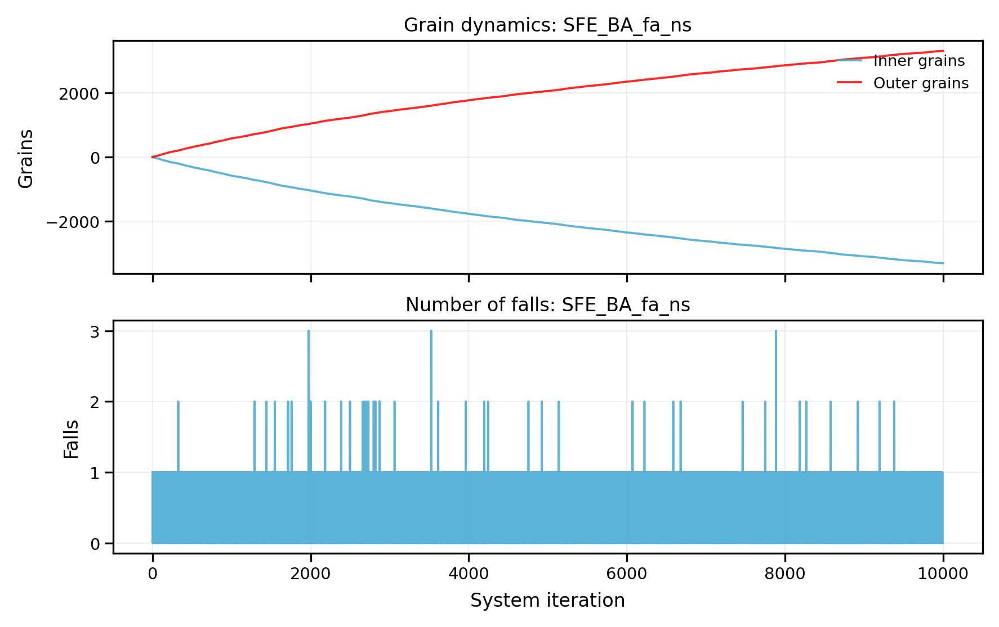

In [144]:
spread("SFE", G_BA, number_of_days, new_grains, "BA", facilitated = True, neutral_state = True, new_grains_minus = new_grains_minus)

100%|██████████| 9999/9999 [00:24<00:00, 407.85it/s]


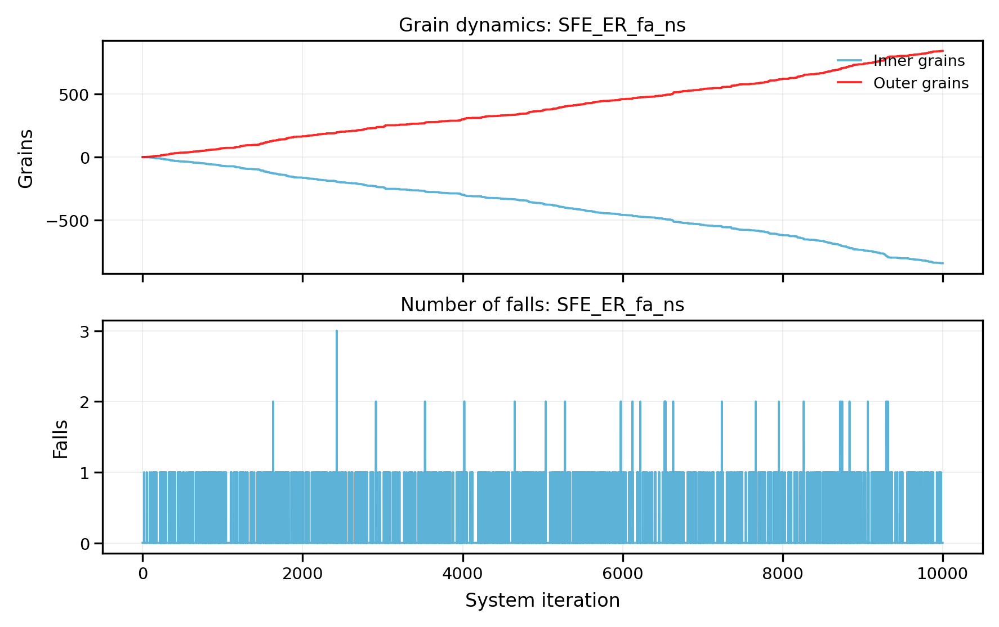

In [145]:
spread("SFE", G_ER, number_of_days, new_grains, "ER", facilitated = True, neutral_state = True, new_grains_minus = new_grains_minus)

100%|██████████| 9999/9999 [00:23<00:00, 419.97it/s]


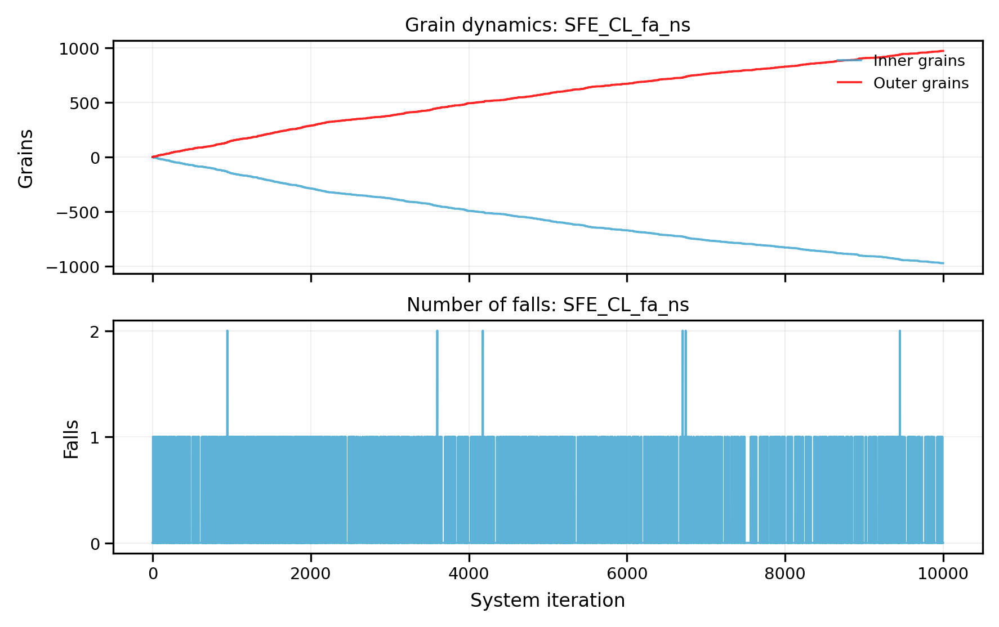

In [146]:
spread("SFE", G_CL, number_of_days, new_grains, "CL", facilitated = True, neutral_state = True, new_grains_minus = new_grains_minus)

##### Additional Pumping

100%|██████████| 9999/9999 [00:24<00:00, 414.34it/s]


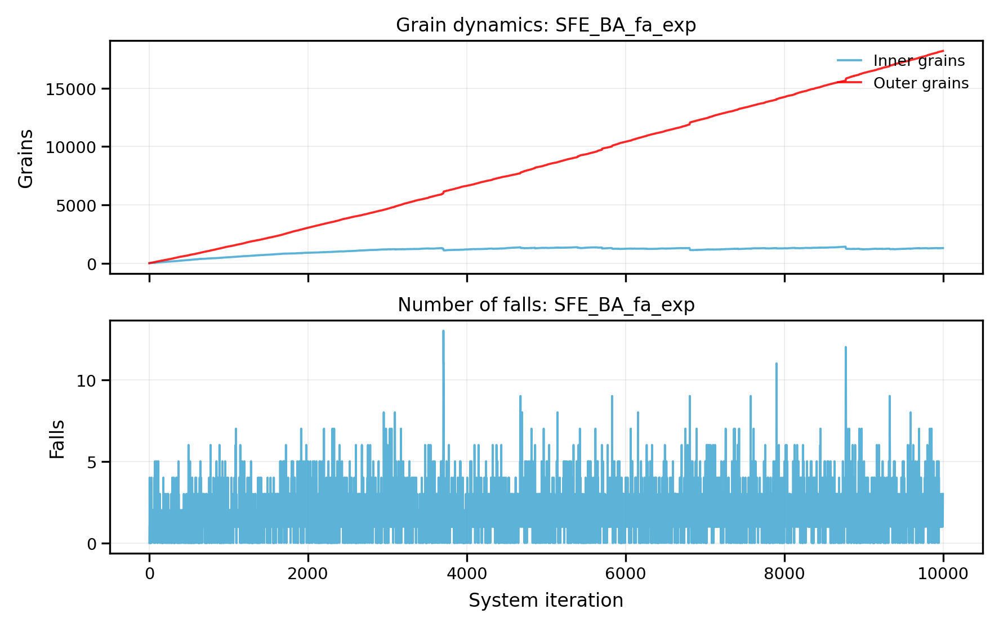

In [147]:
spread("SFE", G_BA, number_of_days, new_grains_exp, "BA", facilitated = True, expon = True)

100%|██████████| 9999/9999 [00:25<00:00, 398.44it/s]


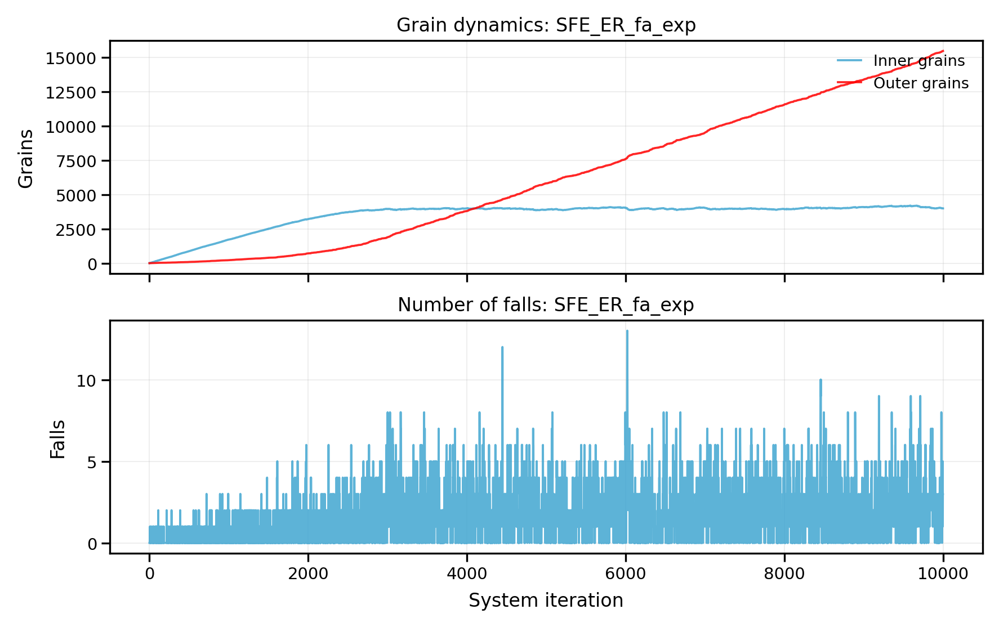

In [148]:
spread("SFE", G_ER, number_of_days, new_grains_exp, "ER", facilitated = True, expon = True)

100%|██████████| 9999/9999 [00:25<00:00, 397.16it/s]


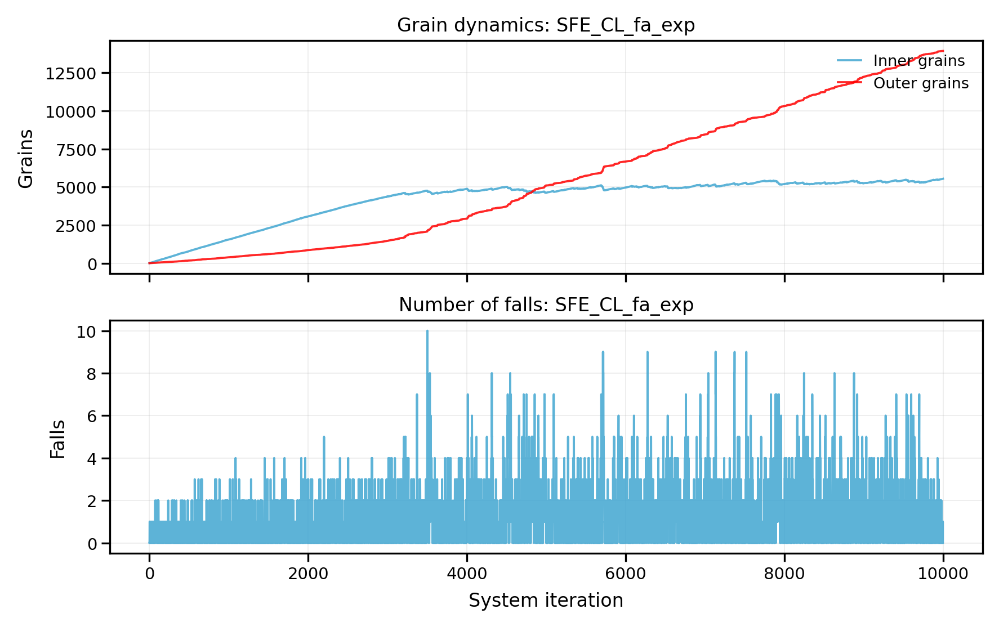

In [149]:
spread("SFE", G_CL, number_of_days, new_grains_exp, "CL", facilitated = True, expon = True)

100%|██████████| 9999/9999 [00:23<00:00, 421.58it/s]


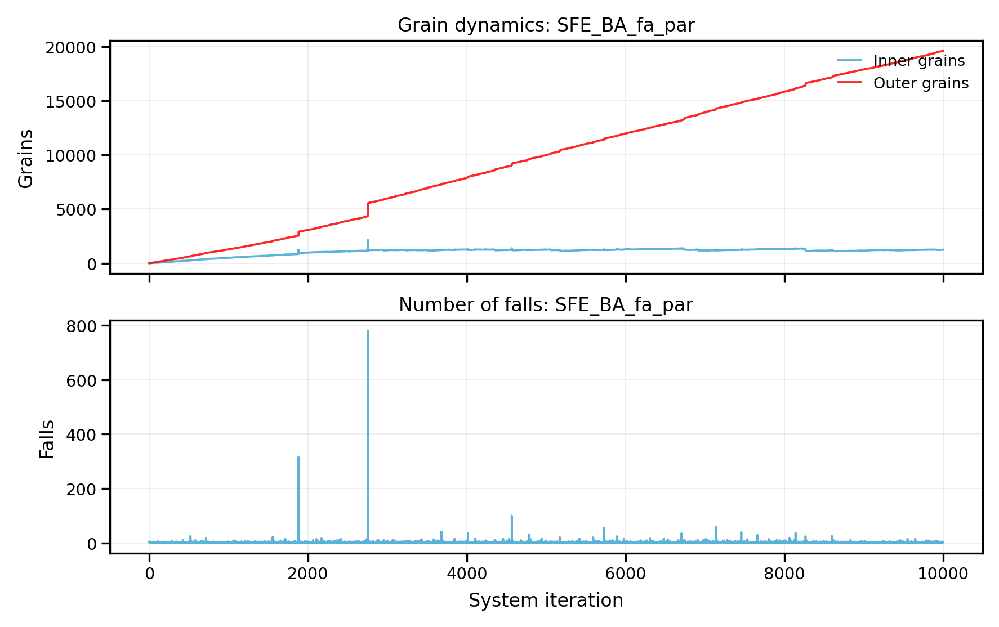

In [150]:
spread("SFE", G_BA, number_of_days, new_grains_par, "BA", facilitated = True, par = True)

100%|██████████| 9999/9999 [00:25<00:00, 389.04it/s]


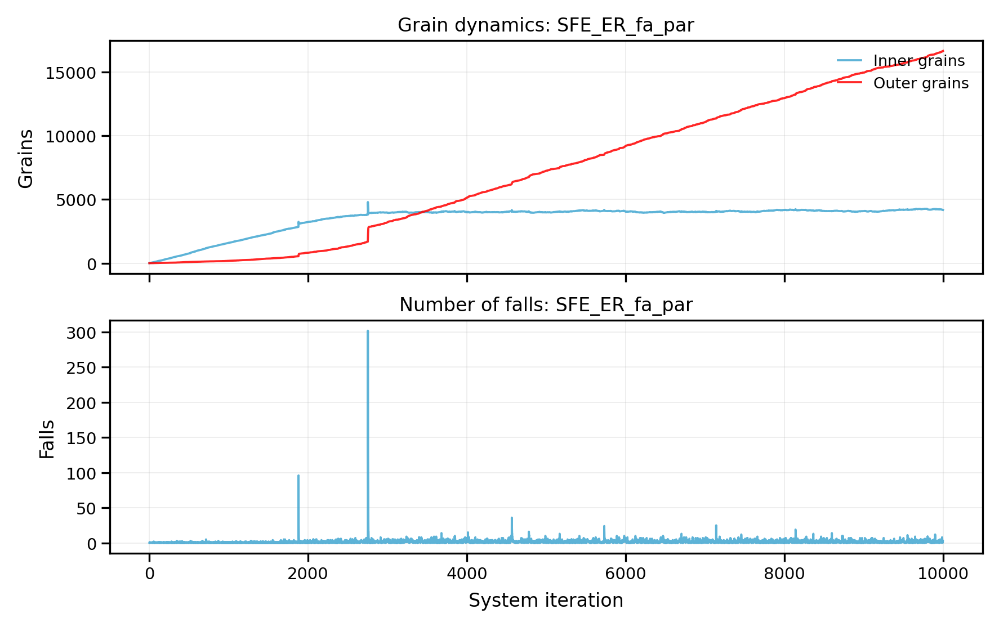

In [151]:
spread("SFE", G_ER, number_of_days, new_grains_par, "ER", facilitated = True, par = True)

100%|██████████| 9999/9999 [00:25<00:00, 399.72it/s]


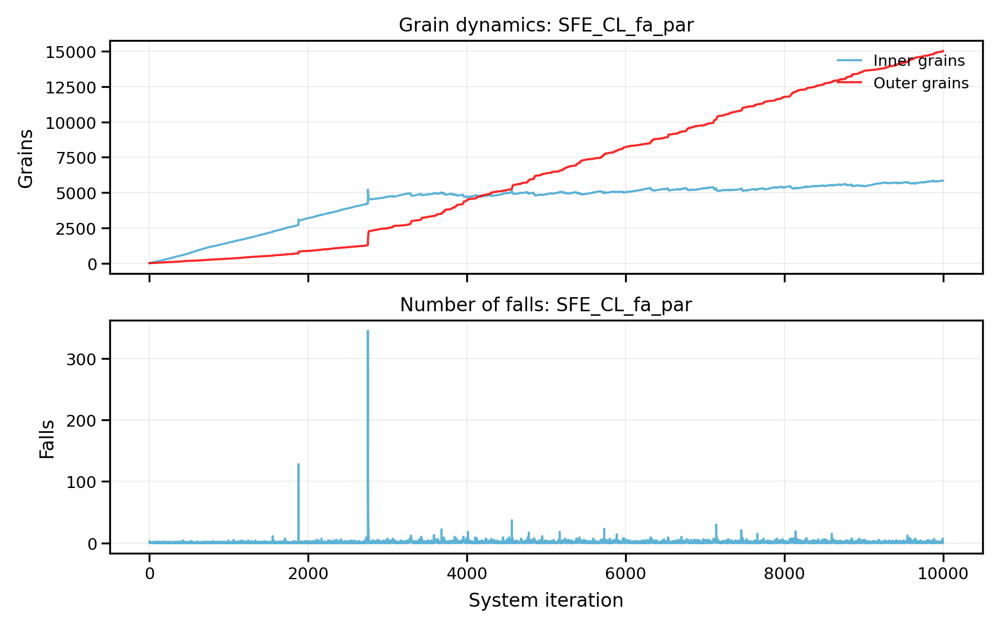

In [152]:
spread("SFE", G_CL, number_of_days, new_grains_par, "CL", facilitated = True, par = True)

### Graph statistics

#### Plotting function

In [153]:
# Plotting

def k_distrib(graph, graph_type = None, scale='lin', colour='#40a6d1', alpha=.8, fit_line=False, expct_lo=1, expct_hi=10, expct_const=1):
    
    plt.close()
    num_nodes = graph.number_of_nodes()
    max_degree = 0
    
    # Calculate the maximum degree to know the range of x-axis
    for n in graph.nodes():
        if graph.degree(n) > max_degree:
            max_degree = graph.degree(n)
    
    # X-axis and y-axis values
    x = []
    y_tmp = []
    
    # Loop over all degrees until the maximum to compute the portion of nodes for that degree
    for i in range(max_degree + 1):
        x.append(i)
        y_tmp.append(0)
        for n in graph.nodes():
            if graph.degree(n) == i:
                y_tmp[i] += 1
        y = [i / num_nodes for i in y_tmp]
    
    if graph_type != None:  
      with open('degrees_' + graph_type + '.csv', 'w') as myfile:
        wr = csv.writer(myfile, delimiter=',')
        wr.writerow(y_tmp)
    
    # Check for the lin / log parameter and set axes scale
    if scale == 'log':
        plt.figure(figsize=(10, 8))
        plt.xscale('log')
        plt.yscale('log')
        plt.title('Degree distribution (log-log scale)')
        plt.ylabel('log(P(k))')
        plt.xlabel('log(k)')
        plt.plot(x, y, linewidth = 0, marker = 'o', markersize = 8, color = colour, alpha = alpha)
        
        if fit_line:
            # Add theoretical distribution line k^-3
            # Note that you need to parametrize it manually
            w = [a for a in range(expct_lo,expct_hi)]
            z = []
            for i in w:
                x = (i**-3) * expct_const # set line's length and fit intercept
                z.append(x)

            plt.plot(w, z, 'k-', color='#7f7f7f')
            
    else:
        plt.figure(figsize=(10, 8))
        plt.plot(x, y, linewidth = 0, marker = 'o', markersize = 8, color = colour, alpha = alpha)
        plt.title('Degree distribution (linear scale)')
        plt.ylabel('P(k)')
        plt.xlabel('k')

    plt.show()

#### Barabasi-Albert

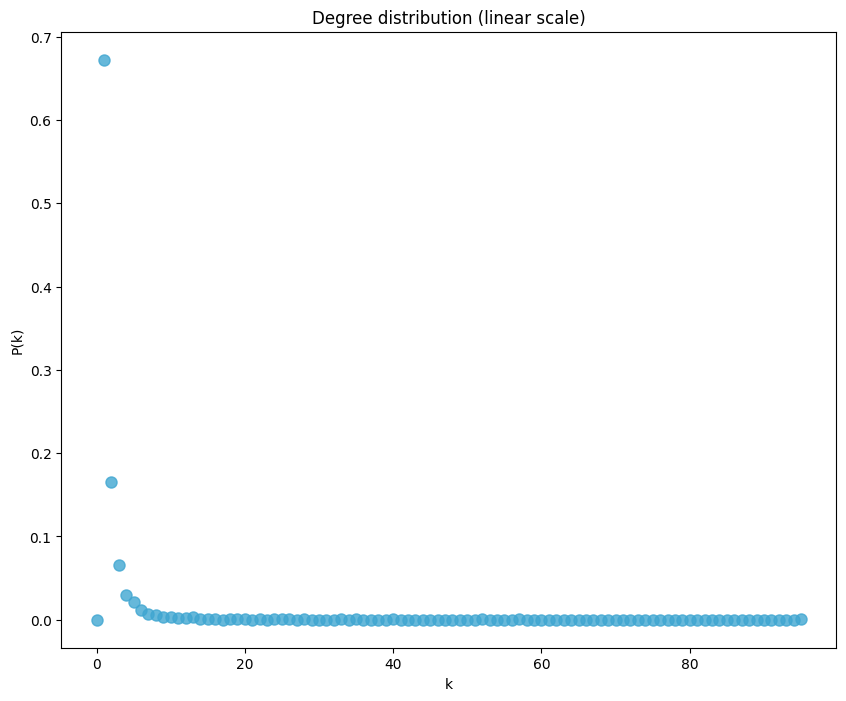

In [154]:
k_distrib(G_BA, "BA")

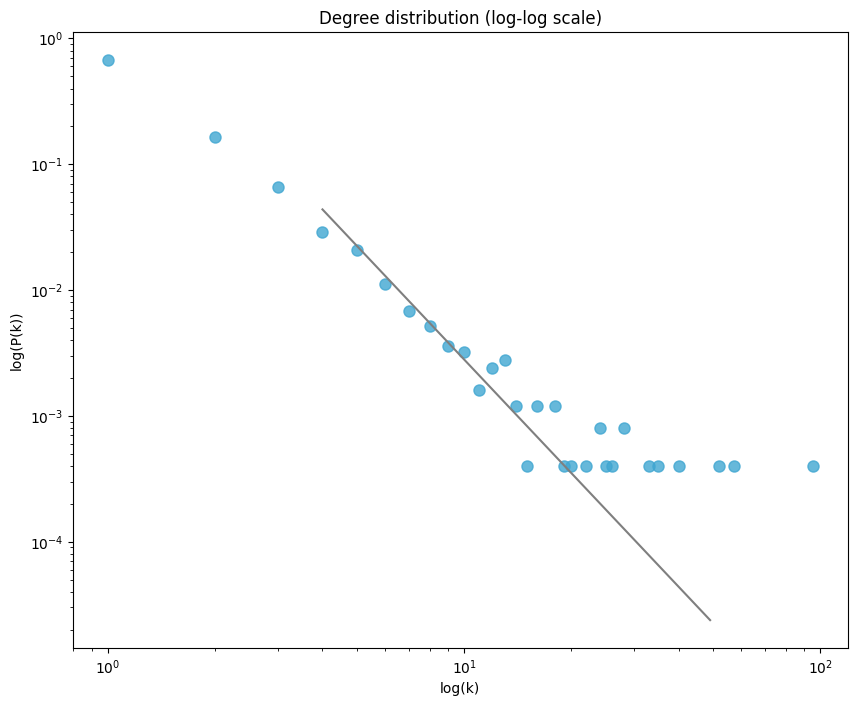

In [155]:
k_distrib(G_BA, scale = 'log', fit_line = True, expct_lo=4, expct_hi=50, expct_const=2.8)

#### Erdos-Renyi

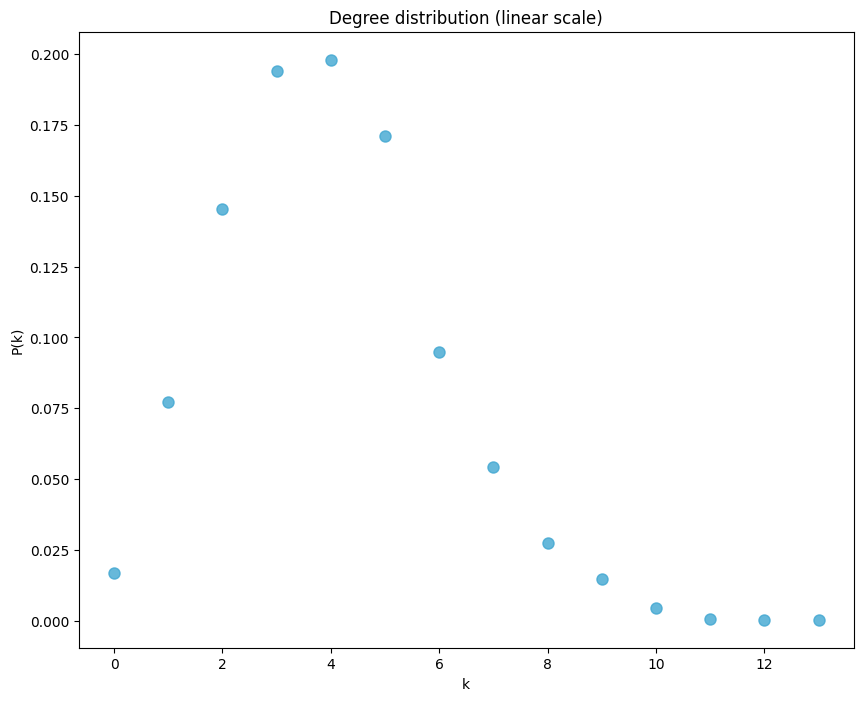

In [156]:
k_distrib(G_ER, "ER")

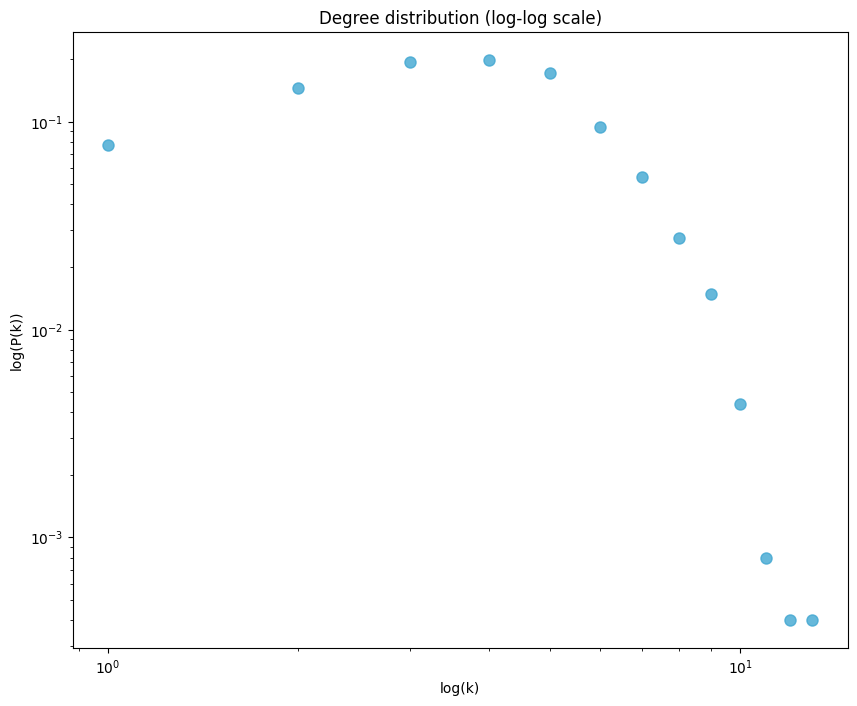

In [157]:
k_distrib(G_ER, scale = 'log', fit_line = False, expct_lo=4, expct_hi=50, expct_const=2.8)

#### Chung-Lu

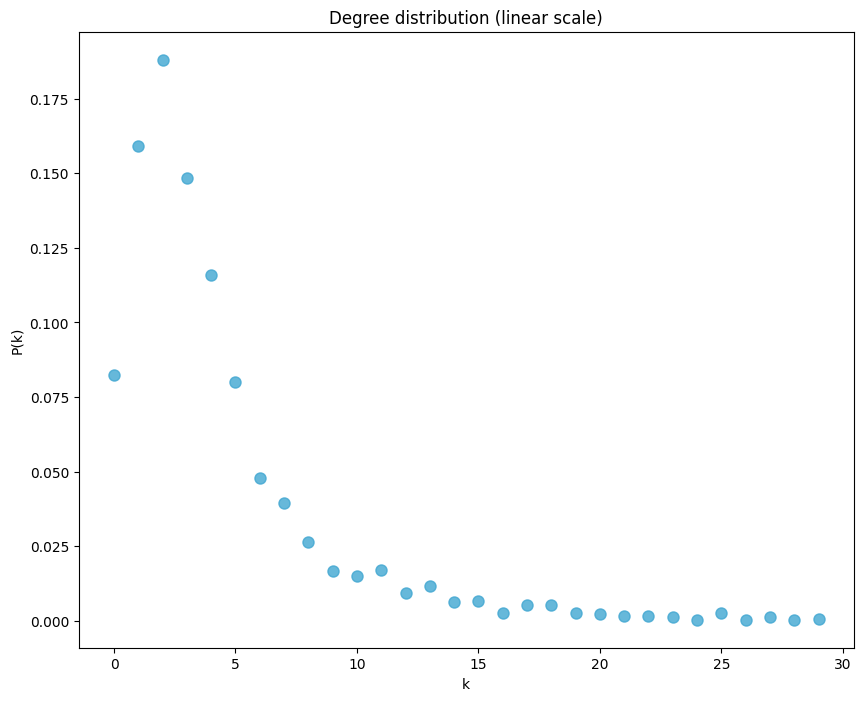

In [158]:
k_distrib(G_CL, "CL")

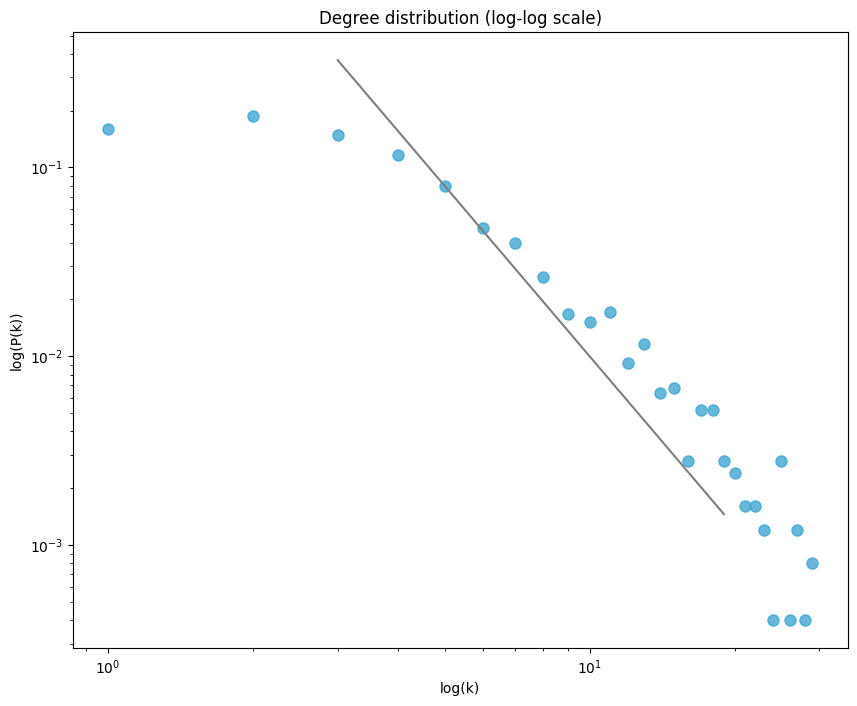

In [159]:
k_distrib(G_CL, scale = 'log', fit_line = True, expct_lo=3, expct_hi=20, expct_const=10)